#Installing The Required Libraries

In [ ]:
!pip install pdfplumber

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 77.7 MB/s eta 0:00:00


#Chapter 4 Extraction Tables

In [ ]:
import pdfplumber
import pandas as pd
import re

def parse_table_line_variable_columns(line):
    """
    Parse a line from the table, handling variable number of columns.
    Assumes the first number is energy, followed by any number of numeric columns.
    """
    line = line.strip()

    # Skip non-data lines
    if not line or any(skip_word in line.lower() for skip_word in
                      ['column', 'spectra', 'table', 'energy', 'phasetron', 'ihep', 'page']):
        return None

    # Split line by whitespace and try to find numeric values
    parts = re.split(r'\s+', line)
    numbers = []
    sci_pattern = r'^\d+\.?\d*(E[+-]?\d+)?$'  # matches scientific notation or plain numbers

    for part in parts:
        # Normalize number format (convert regular decimals/integers to scientific notation style string)
        if re.match(sci_pattern, part, re.IGNORECASE):
            # Convert to scientific if decimal or integer without exponent
            if 'E' not in part.upper():
                try:
                    val = float(part)
                    numbers.append(f"{val:.6E}")
                except:
                    continue
            else:
                numbers.append(part.upper())

    if numbers:
        return numbers  # return all numbers found, with first assumed energy
    else:
        return None


def is_response_section(page_text, line_context):
    """
    Determine if the current section/page contains response data rather than spectra data.
    Returns True if this section should be SKIPPED (contains responses).
    """
    # Combine page text and local context
    full_context = (page_text + ' ' + ' '.join(line_context)).lower()

    # STRONG indicators this section contains response/dose data (SKIP this section)
    response_indicators = [
        'spectrum weighted',
        'spectrum-weighted',
        'weighted response',
        'response function',
        'conversion coefficient',
        'conversion factor',
        'dose rate',
        'dose conversion',
        'effective dose',
        'ambient dose',
        'personal dose',
        'organ dose',
        'tissue dose',
        'sv/h',
        'sv h',
        'gy/h',
        'gy h',
        'rem/h',
        'rem h',
        'dosimetric',
        'dose equivalent',
        'kerma',
        'absorbed dose',
        'exposure rate',
        'fluence to dose',
        'fluence-to-dose',
        'h\\*(10)',  # H*(10) - ambient dose
        'hp\\(10\\)',  # Hp(10) - personal dose
        'hp\\(0\\.07\\)',  # Hp(0.07) - skin dose
        'sv.*per.*neutron',
        'gy.*per.*neutron',
        'rem.*per.*neutron',
        'dose.*per.*unit.*fluence',
        'response.*per.*unit.*fluence'
    ]

    # Check for response indicators
    for indicator in response_indicators:
        if re.search(indicator, full_context, re.IGNORECASE):
            return True

    # Additional check: look for dose units in column headers or descriptions
    dose_unit_patterns = [
        r'sv\s*cm²',
        r'gy\s*cm²',
        r'rem\s*cm²',
        r'msv\s*per',
        r'mgy\s*per',
        r'mrem\s*per'
    ]

    for pattern in dose_unit_patterns:
        if re.search(pattern, full_context, re.IGNORECASE):
            return True

    return False


def extract_all_tables_chapter_4_variable_columns(pdf_path, start_page=82, end_page=145):
    """
    Extract tables specifically for chapter 4, handling variable number of columns
    and filtering out response sections while keeping spectra sections.
    """
    tables = {}
    current_table_name = None
    current_table_data = []
    collecting = False
    skip_current_section = False
    page_buffer = []

    with pdfplumber.open(pdf_path) as pdf:
        for i in range(start_page - 1, min(end_page, len(pdf.pages))):
            try:
                text = pdf.pages[i].extract_text()
                if not text:
                    continue

                lines = text.split('\n')
                page_buffer.extend(lines)
                if len(page_buffer) > 100:
                    page_buffer = page_buffer[-100:]

                # Check if this entire page should be skipped (contains response data)
                page_has_responses = is_response_section(text, [])
                if page_has_responses:
                    print(f"📄 SKIPPING page {i+1}: Contains response data")
                    continue

                for j, line in enumerate(lines):
                    line = line.strip()

                    # Look for chapter 4 table headers
                    table_patterns = [
                        r'^TABLE\s+4\.([IVXLCDM]+)',
                        r'^Table\s+4\.([IVXLCDM]+)',
                        r'^TABLE\s+4\s*\.?\s*([IVXLCDM]+)',
                        r'4\.([IVXLCDM]+).*DATA',
                        r'4\.([IVXLCDM]+).*REFERENCES'
                    ]

                    table_match = None
                    for pattern in table_patterns:
                        table_match = re.search(pattern, line, re.IGNORECASE)
                        if table_match:
                            break

                    if table_match:
                        table_name = f"TABLE_4{table_match.group(1)}"

                        # Save previous table data if exists
                        if current_table_name and current_table_name != table_name and current_table_data:
                            if current_table_name not in tables:
                                tables[current_table_name] = []
                            tables[current_table_name].extend(current_table_data)
                            print(f"💾 SAVED: {current_table_name} with {len(current_table_data)} rows")
                            current_table_data = []

                        current_table_name = table_name
                        collecting = True
                        skip_current_section = False  # Reset section skip flag
                        print(f"\n🔍 Found table header: {table_name} on page {i+1}")
                        continue

                    # Check for section breaks within a table that might indicate response data
                    section_break_patterns = [
                        r'spectrum.*weighted.*response',
                        r'dose.*conversion.*coefficient',
                        r'response.*function',
                        r'ambient.*dose.*equivalent',
                        r'personal.*dose.*equivalent',
                        r'effective.*dose.*conversion'
                    ]

                    section_context = lines[max(0, j-5):min(len(lines), j+10)]
                    if any(re.search(pattern, ' '.join(section_context).lower(), re.IGNORECASE)
                           for pattern in section_break_patterns):
                        if collecting:
                            skip_current_section = True
                            print(f"🚫 SKIPPING section in {current_table_name}: Found response data indicators")
                        continue

                    # Check if we should resume collecting (look for spectra indicators)
                    if skip_current_section and collecting:
                        spectra_resume_patterns = [
                            r'energy.*spectrum',
                            r'neutron.*spectrum',
                            r'gamma.*spectrum',
                            r'reference.*spectrum',
                            r'workplace.*spectrum',
                            r'energy.*distribution',
                            r'differential.*spectrum'
                        ]

                        if any(re.search(pattern, ' '.join(section_context).lower(), re.IGNORECASE)
                               for pattern in spectra_resume_patterns):
                            skip_current_section = False
                            print(f"✅ RESUMING collection for {current_table_name}: Found spectra indicators")

                    # Stop collecting when encountering these keywords
                    if re.match(r'^(CHAPTER|APPENDIX|REFERENCES|BIBLIOGRAPHY)', line, re.IGNORECASE):
                        if current_table_name and current_table_data:
                            if current_table_name not in tables:
                                tables[current_table_name] = []
                            tables[current_table_name].extend(current_table_data)
                            print(f"💾 SAVED: {current_table_name} with {len(current_table_data)} rows")
                            current_table_data = []
                        collecting = False
                        skip_current_section = False
                        current_table_name = None
                        continue

                    # Collect data only if we're in a table and not in a response section
                    if collecting and current_table_name and not skip_current_section:
                        # Additional line-level check for response data
                        line_context = lines[max(0, j-2):min(len(lines), j+3)]
                        if not is_response_section("", line_context):
                            parsed_row = parse_table_line_variable_columns(line)
                            if parsed_row:
                                current_table_data.append(parsed_row)

                            # Check if data spans multiple lines
                            if not parsed_row and j > 0 and j < len(lines) - 1:
                                combined_line = lines[j-1].strip() + ' ' + line + ' ' + lines[j+1].strip()
                                combined_context = lines[max(0, j-3):min(len(lines), j+4)]
                                if not is_response_section("", combined_context):
                                    parsed_combined = parse_table_line_variable_columns(combined_line)
                                    if parsed_combined:
                                        current_table_data.append(parsed_combined)
                        else:
                            if not skip_current_section:
                                print(f"⚠️  Skipping response data line in {current_table_name}")

            except Exception as e:
                print(f"⚠️  Error processing page {i+1}: {e}")
                continue

    # Handle the last table
    if current_table_name and current_table_data:
        if current_table_name not in tables:
            tables[current_table_name] = []
        tables[current_table_name].extend(current_table_data)
        print(f"💾 SAVED: {current_table_name} with {len(current_table_data)} rows")

    # Remove duplicates while preserving order
    cleaned_tables = {}
    for name, data in tables.items():
        if data:
            seen = set()
            unique_data = []
            for row in data:
                row_tuple = tuple(row)
                if row_tuple not in seen:
                    seen.add(row_tuple)
                    unique_data.append(row)
            cleaned_tables[name] = unique_data

    return cleaned_tables


def save_all_tables_variable_columns(tables):
    """Save tables with dynamic column count, energy always first column."""
    print(f"\n💾 Saving {len(tables)} tables with spectra sections only...")

    def roman_to_int(roman):
        values = {'I': 1, 'V': 5, 'X': 10, 'L': 50, 'C': 100, 'D': 500, 'M': 1000}
        total = 0
        prev_value = 0
        for char in reversed(roman):
            value = values.get(char, 0)
            if value < prev_value:
                total -= value
            else:
                total += value
            prev_value = value
        return total

    sorted_tables = sorted(tables.items(),
                           key=lambda x: roman_to_int(x[0].replace('TABLE_4', '')))

    total_rows = 0
    for table_name, data in sorted_tables:
        if data:
            max_cols = max(len(row) for row in data)
            headers = ["Energy_eV"] + [f"Column_{i}" for i in range(1, max_cols)]

            padded_data = [row + [''] * (max_cols - len(row)) for row in data]

            df = pd.DataFrame(padded_data, columns=headers)
            filename = f"{table_name}_SPECTRA_SECTIONS.csv"
            df.to_csv(filename, index=False)

            roman_num = table_name.replace('TABLE_4', '')
            decimal_num = roman_to_int(roman_num)
            total_rows += len(data)

            print(f"✅ Saved {filename} | TABLE 4.{roman_num} ({decimal_num}) | {len(data)} rows")
        else:
            print(f"⚠️  {table_name} has no spectra data")

    print(f"\n📊 FINAL SUMMARY:")
    print(f"   Total tables with spectra sections: {len([t for t in tables.values() if t])}")
    print(f"   Total spectra data rows: {total_rows}")
    print(f"   Response sections/pages excluded! ✨")

    table_numbers = [roman_to_int(name.replace('TABLE_4', '')) for name in tables.keys()]
    if table_numbers:
        min_num, max_num = min(table_numbers), max(table_numbers)
        print(f"✅ Extracted spectra sections from tables {min_num} to {max_num}")


# Main execution
if __name__ == "__main__":
    pdf_path = "/content/TRS403_scr.pdf"

    print("🚀 EXTRACTING CHAPTER 4 SPECTRA SECTIONS ONLY (SKIPPING RESPONSE SECTIONS)")
    print("=" * 75)

    all_tables_ch4 = extract_all_tables_chapter_4_variable_columns(pdf_path)

    if all_tables_ch4:
        save_all_tables_variable_columns(all_tables_ch4)
        print(f"\n🎯 CHAPTER 4 SPECTRA SECTIONS EXTRACTION COMPLETE!")
        print("   📄 Response pages/sections skipped, spectra sections preserved")
        print("   🎯 Tables kept but only spectra data extracted")
    else:
        print("❌ No spectra sections extracted from CHAPTER 4! Check PDF path and page ranges.")

🚀 EXTRACTING CHAPTER 4 SPECTRA SECTIONS ONLY (SKIPPING RESPONSE SECTIONS)

🔍 Found table header: TABLE_4V on page 82
📄 SKIPPING page 84: Contains response data
💾 SAVED: TABLE_4V with 64 rows

🔍 Found table header: TABLE_4VI on page 85
📄 SKIPPING page 87: Contains response data
💾 SAVED: TABLE_4VI with 63 rows

🔍 Found table header: TABLE_4VII on page 88
📄 SKIPPING page 90: Contains response data
💾 SAVED: TABLE_4VII with 64 rows

🔍 Found table header: TABLE_4VIII on page 91
📄 SKIPPING page 93: Contains response data
💾 SAVED: TABLE_4VIII with 63 rows

🔍 Found table header: TABLE_4IX on page 94
📄 SKIPPING page 96: Contains response data
💾 SAVED: TABLE_4IX with 63 rows

🔍 Found table header: TABLE_4X on page 97
📄 SKIPPING page 99: Contains response data
💾 SAVED: TABLE_4X with 63 rows

🔍 Found table header: TABLE_4XI on page 100
📄 SKIPPING page 102: Contains response data
💾 SAVED: TABLE_4XI with 66 rows

🔍 Found table header: TABLE_4XII on page 103
📄 SKIPPING page 105: Contains response data

In [ ]:
import os
import zipfile

def zip_all_csv_files(zip_filename="chapter4_tables.zip"):
    """
    Create a ZIP file containing all CSV files in the current directory.
    """
    csv_files = [f for f in os.listdir('.') if f.lower().endswith('.csv')]
    if not csv_files:
        print("⚠️  No CSV files found to zip.")
        return

    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for csv_file in csv_files:
            zipf.write(csv_file)
            print(f"➕ Added {csv_file} to {zip_filename}")

    print(f"\n✅ Created zip file: {zip_filename} with {len(csv_files)} CSV files.")


# Example usage, add this call at the end of your main script after saving CSVs:
if __name__ == "__main__":
    # ... your existing extraction and save code ...

    # Create zip of all CSV tables extracted
    zip_all_csv_files()


➕ Added TABLE_4XI_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XXV_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4VII_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XX_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4V_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XVII_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4X_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4VI_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4IX_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XIX_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XV_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XXIII_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XVI_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XXI_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4VIII_SPECTRA_SECTIONS.csv to chapter4_tables.zip
➕ Added TABLE_4XIV_SPECTRA_SECTIONS.csv to chapter4_tables.z

#Chapter 5 Extraction Tables

In [ ]:
import pdfplumber
import pandas as pd
import re

def parse_table_line_variable_columns(line):
    """
    Parse a line from the table, handling variable number of columns.
    Assumes the first number is energy, followed by any number of numeric columns.
    """
    line = line.strip()

    # Skip non-data lines
    if not line or any(skip_word in line.lower() for skip_word in
                      ['column', 'spectra', 'table', 'energy', 'phasetron', 'ihep', 'page']):
        return None

    # Split line by whitespace and try to find numeric values
    parts = re.split(r'\s+', line)
    numbers = []
    sci_pattern = r'^\d+\.?\d*(E[+-]?\d+)?$'  # matches scientific notation or plain numbers

    for part in parts:
        # Normalize number format (convert regular decimals/integers to scientific notation style string)
        if re.match(sci_pattern, part, re.IGNORECASE):
            # Convert to scientific if decimal or integer without exponent
            if 'E' not in part.upper():
                try:
                    val = float(part)
                    numbers.append(f"{val:.6E}")
                except:
                    continue
            else:
                numbers.append(part.upper())

    if numbers:
        return numbers  # return all numbers found, with first assumed energy
    else:
        return None


def is_response_section(page_text, line_context):
    """
    Determine if the current section/page contains response data rather than spectra data.
    Returns True if this section should be SKIPPED (contains responses).
    """
    # Combine page text and local context
    full_context = (page_text + ' ' + ' '.join(line_context)).lower()

    # STRONG indicators this section contains response/dose data (SKIP this section)
    response_indicators = [
        'spectrum weighted',
        'spectrum-weighted',
        'weighted response',
        'response function',
        'conversion coefficient',
        'conversion factor',
        'dose rate',
        'dose conversion',
        'effective dose',
        'ambient dose',
        'personal dose',
        'organ dose',
        'tissue dose',
        'sv/h',
        'sv h',
        'gy/h',
        'gy h',
        'rem/h',
        'rem h',
        'dosimetric',
        'dose equivalent',
        'kerma',
        'absorbed dose',
        'exposure rate',
        'fluence to dose',
        'fluence-to-dose',
        'h\\*(10)',  # H*(10) - ambient dose
        'hp\\(10\\)',  # Hp(10) - personal dose
        'hp\\(0\\.07\\)',  # Hp(0.07) - skin dose
        'sv.*per.*neutron',
        'gy.*per.*neutron',
        'rem.*per.*neutron',
        'dose.*per.*unit.*fluence',
        'response.*per.*unit.*fluence'
    ]

    # Check for response indicators
    for indicator in response_indicators:
        if re.search(indicator, full_context, re.IGNORECASE):
            return True

    # Additional check: look for dose units in column headers or descriptions
    dose_unit_patterns = [
        r'sv\s*cm²',
        r'gy\s*cm²',
        r'rem\s*cm²',
        r'msv\s*per',
        r'mgy\s*per',
        r'mrem\s*per'
    ]

    for pattern in dose_unit_patterns:
        if re.search(pattern, full_context, re.IGNORECASE):
            return True

    return False


def extract_all_tables_chapter_5_variable_columns(pdf_path, start_page=153, end_page=270):
    """
    Extract tables specifically for chapter 5, handling variable number of columns
    and filtering out response sections while keeping spectra sections.
    """
    tables = {}
    current_table_name = None
    current_table_data = []
    collecting = False
    skip_current_section = False
    page_buffer = []

    with pdfplumber.open(pdf_path) as pdf:
        for i in range(start_page - 1, min(end_page, len(pdf.pages))):
            try:
                text = pdf.pages[i].extract_text()
                if not text:
                    continue

                lines = text.split('\n')
                page_buffer.extend(lines)
                if len(page_buffer) > 100:
                    page_buffer = page_buffer[-100:]

                # Check if this entire page should be skipped (contains response data)
                page_has_responses = is_response_section(text, [])
                if page_has_responses:
                    print(f"📄 SKIPPING page {i+1}: Contains response data")
                    continue

                for j, line in enumerate(lines):
                    line = line.strip()

                    # Look for chapter 5 table headers
                    table_patterns = [
                        r'^TABLE\s+5\.([IVXLCDM]+)',
                        r'^Table\s+5\.([IVXLCDM]+)',
                        r'^TABLE\s+5\s*\.?\s*([IVXLCDM]+)',
                        r'5\.([IVXLCDM]+).*DATA',
                        r'5\.([IVXLCDM]+).*REFERENCES'
                    ]

                    table_match = None
                    for pattern in table_patterns:
                        table_match = re.search(pattern, line, re.IGNORECASE)
                        if table_match:
                            break

                    if table_match:
                        table_name = f"TABLE_5{table_match.group(1)}"

                        # Save previous table data if exists
                        if current_table_name and current_table_name != table_name and current_table_data:
                            if current_table_name not in tables:
                                tables[current_table_name] = []
                            tables[current_table_name].extend(current_table_data)
                            print(f"💾 SAVED: {current_table_name} with {len(current_table_data)} rows")
                            current_table_data = []

                        current_table_name = table_name
                        collecting = True
                        skip_current_section = False  # Reset section skip flag
                        print(f"\n🔍 Found table header: {table_name} on page {i+1}")
                        continue

                    # Check for section breaks within a table that might indicate response data
                    section_break_patterns = [
                        r'spectrum.*weighted.*response',
                        r'dose.*conversion.*coefficient',
                        r'response.*function',
                        r'ambient.*dose.*equivalent',
                        r'personal.*dose.*equivalent',
                        r'effective.*dose.*conversion'
                    ]

                    section_context = lines[max(0, j-5):min(len(lines), j+10)]
                    if any(re.search(pattern, ' '.join(section_context).lower(), re.IGNORECASE)
                           for pattern in section_break_patterns):
                        if collecting:
                            skip_current_section = True
                            print(f"🚫 SKIPPING section in {current_table_name}: Found response data indicators")
                        continue

                    # Check if we should resume collecting (look for spectra indicators)
                    if skip_current_section and collecting:
                        spectra_resume_patterns = [
                            r'energy.*spectrum',
                            r'neutron.*spectrum',
                            r'gamma.*spectrum',
                            r'reference.*spectrum',
                            r'workplace.*spectrum',
                            r'energy.*distribution',
                            r'differential.*spectrum'
                        ]

                        if any(re.search(pattern, ' '.join(section_context).lower(), re.IGNORECASE)
                               for pattern in spectra_resume_patterns):
                            skip_current_section = False
                            print(f"✅ RESUMING collection for {current_table_name}: Found spectra indicators")

                    # Stop collecting when encountering these keywords
                    if re.match(r'^(CHAPTER|APPENDIX|REFERENCES|BIBLIOGRAPHY)', line, re.IGNORECASE):
                        if current_table_name and current_table_data:
                            if current_table_name not in tables:
                                tables[current_table_name] = []
                            tables[current_table_name].extend(current_table_data)
                            print(f"💾 SAVED: {current_table_name} with {len(current_table_data)} rows")
                            current_table_data = []
                        collecting = False
                        skip_current_section = False
                        current_table_name = None
                        continue

                    # Collect data only if we're in a table and not in a response section
                    if collecting and current_table_name and not skip_current_section:
                        # Additional line-level check for response data
                        line_context = lines[max(0, j-2):min(len(lines), j+3)]
                        if not is_response_section("", line_context):
                            parsed_row = parse_table_line_variable_columns(line)
                            if parsed_row:
                                current_table_data.append(parsed_row)

                            # Check if data spans multiple lines
                            if not parsed_row and j > 0 and j < len(lines) - 1:
                                combined_line = lines[j-1].strip() + ' ' + line + ' ' + lines[j+1].strip()
                                combined_context = lines[max(0, j-3):min(len(lines), j+4)]
                                if not is_response_section("", combined_context):
                                    parsed_combined = parse_table_line_variable_columns(combined_line)
                                    if parsed_combined:
                                        current_table_data.append(parsed_combined)
                        else:
                            if not skip_current_section:
                                print(f"⚠️  Skipping response data line in {current_table_name}")

            except Exception as e:
                print(f"⚠️  Error processing page {i+1}: {e}")
                continue

    # Handle the last table
    if current_table_name and current_table_data:
        if current_table_name not in tables:
            tables[current_table_name] = []
        tables[current_table_name].extend(current_table_data)
        print(f"💾 SAVED: {current_table_name} with {len(current_table_data)} rows")

    # Remove duplicates while preserving order
    cleaned_tables = {}
    for name, data in tables.items():
        if data:
            seen = set()
            unique_data = []
            for row in data:
                row_tuple = tuple(row)
                if row_tuple not in seen:
                    seen.add(row_tuple)
                    unique_data.append(row)
            cleaned_tables[name] = unique_data

    return cleaned_tables


def save_all_tables_variable_columns(tables):
    """Save tables with dynamic column count, energy always first column."""
    print(f"\n💾 Saving {len(tables)} tables with spectra sections only...")

    def roman_to_int(roman):
        values = {'I': 1, 'V': 5, 'X': 10, 'L': 50, 'C': 100, 'D': 500, 'M': 1000}
        total = 0
        prev_value = 0
        for char in reversed(roman):
            value = values.get(char, 0)
            if value < prev_value:
                total -= value
            else:
                total += value
            prev_value = value
        return total

    sorted_tables = sorted(tables.items(),
                           key=lambda x: roman_to_int(x[0].replace('TABLE_5', '')))

    total_rows = 0
    for table_name, data in sorted_tables:
        if data:
            max_cols = max(len(row) for row in data)
            headers = ["Energy_eV"] + [f"Column_{i}" for i in range(1, max_cols)]

            padded_data = [row + [''] * (max_cols - len(row)) for row in data]

            df = pd.DataFrame(padded_data, columns=headers)
            filename = f"{table_name}_SPECTRA_SECTIONS.csv"
            df.to_csv(filename, index=False)

            roman_num = table_name.replace('TABLE_5', '')
            decimal_num = roman_to_int(roman_num)
            total_rows += len(data)

            print(f"✅ Saved {filename} | TABLE 5.{roman_num} ({decimal_num}) | {len(data)} rows")
        else:
            print(f"⚠️  {table_name} has no spectra data")

    print(f"\n📊 FINAL SUMMARY:")
    print(f"   Total tables with spectra sections: {len([t for t in tables.values() if t])}")
    print(f"   Total spectra data rows: {total_rows}")
    print(f"   Response sections/pages excluded! ✨")

    table_numbers = [roman_to_int(name.replace('TABLE_5', '')) for name in tables.keys()]
    if table_numbers:
        min_num, max_num = min(table_numbers), max(table_numbers)
        print(f"✅ Extracted spectra sections from tables {min_num} to {max_num}")


# Main execution
if __name__ == "__main__":
    pdf_path = "/content/TRS403_scr.pdf"

    print("🚀 EXTRACTING SPECTRA SECTIONS ONLY (SKIPPING RESPONSE SECTIONS)")
    print("=" * 75)

    all_tables_ch5 = extract_all_tables_chapter_5_variable_columns(pdf_path)

    if all_tables_ch5:
        save_all_tables_variable_columns(all_tables_ch5)
        print(f"\n🎯 SPECTRA SECTIONS EXTRACTION COMPLETE!")
        print("   📄 Response pages/sections skipped, spectra sections preserved")
        print("   🎯 Tables kept but only spectra data extracted")
    else:
        print("❌ No spectra sections extracted from CHAPTER 5! Check PDF path and page ranges.")

🚀 EXTRACTING SPECTRA SECTIONS ONLY (SKIPPING RESPONSE SECTIONS)

🔍 Found table header: TABLE_5VIII on page 153
📄 SKIPPING page 155: Contains response data
💾 SAVED: TABLE_5VIII with 63 rows

🔍 Found table header: TABLE_5IX on page 156
📄 SKIPPING page 158: Contains response data
💾 SAVED: TABLE_5IX with 63 rows

🔍 Found table header: TABLE_5X on page 159
📄 SKIPPING page 161: Contains response data
💾 SAVED: TABLE_5X with 63 rows

🔍 Found table header: TABLE_5XI on page 162
📄 SKIPPING page 164: Contains response data
💾 SAVED: TABLE_5XI with 63 rows

🔍 Found table header: TABLE_5XII on page 165
📄 SKIPPING page 167: Contains response data
💾 SAVED: TABLE_5XII with 63 rows

🔍 Found table header: TABLE_5XIII on page 168
📄 SKIPPING page 170: Contains response data
💾 SAVED: TABLE_5XIII with 63 rows

🔍 Found table header: TABLE_5XIV on page 171
📄 SKIPPING page 173: Contains response data
💾 SAVED: TABLE_5XIV with 63 rows

🔍 Found table header: TABLE_5XV on page 174
📄 SKIPPING page 176: Contains resp

In [ ]:
import os
import zipfile

def zip_all_csv_files(zip_filename="chapter5_tables.zip"):
    """
    Create a ZIP file containing all CSV files in the current directory.
    """
    csv_files = [f for f in os.listdir('.') if f.lower().endswith('.csv')]
    if not csv_files:
        print("⚠️  No CSV files found to zip.")
        return

    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for csv_file in csv_files:
            zipf.write(csv_file)
            print(f"➕ Added {csv_file} to {zip_filename}")

    print(f"\n✅ Created zip file: {zip_filename} with {len(csv_files)} CSV files.")


# Example usage, add this call at the end of your main script after saving CSVs:
if __name__ == "__main__":
    # ... your existing extraction and save code ...

    # Create zip of all CSV tables extracted
    zip_all_csv_files()


➕ Added TABLE_5XXIII_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XVI_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XXIV_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XXII_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XLI_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XLIV_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XXI_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XVIII_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XXV_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XIV_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XI_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XIII_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XXXVII_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XV_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5XXVI_SPECTRA_SECTIONS.csv to chapter5_tables.zip
➕ Added TABLE_5VIII_SPECTRA_SECTIONS.csv to c

#Plotting The Original Data

🎯 SPECTRAL DATA PLOTTING TOOL
📋 SPECTRAL DATA SUMMARY:
📄 TABLE_5IX_SPECTRA_SECTIONS:
   📊 Data columns: 4 (Column_1, Column_2, Column_3, Column_4)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5VIII_SPECTRA_SECTIONS:
   📊 Data columns: 4 (Column_1, Column_2, Column_3, Column_4)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XIII_SPECTRA_SECTIONS:
   📊 Data columns: 5 (Column_1, Column_2, Column_3, Column_4, Column_5)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XII_SPECTRA_SECTIONS:
   📊 Data columns: 5 (Column_1, Column_2, Column_3, Column_4, Column_5)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XIV_SPECTRA_SECTIONS:
   📊 Data columns: 4 (Column_1, Column_2, Column_3, Column_4)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XIX_SPECTRA_SECTIONS:
   📊 Data columns: 5 (Column_1, Column_2, Column_3, Column_4, Column_5)
   ⚡ Energy range: 1.

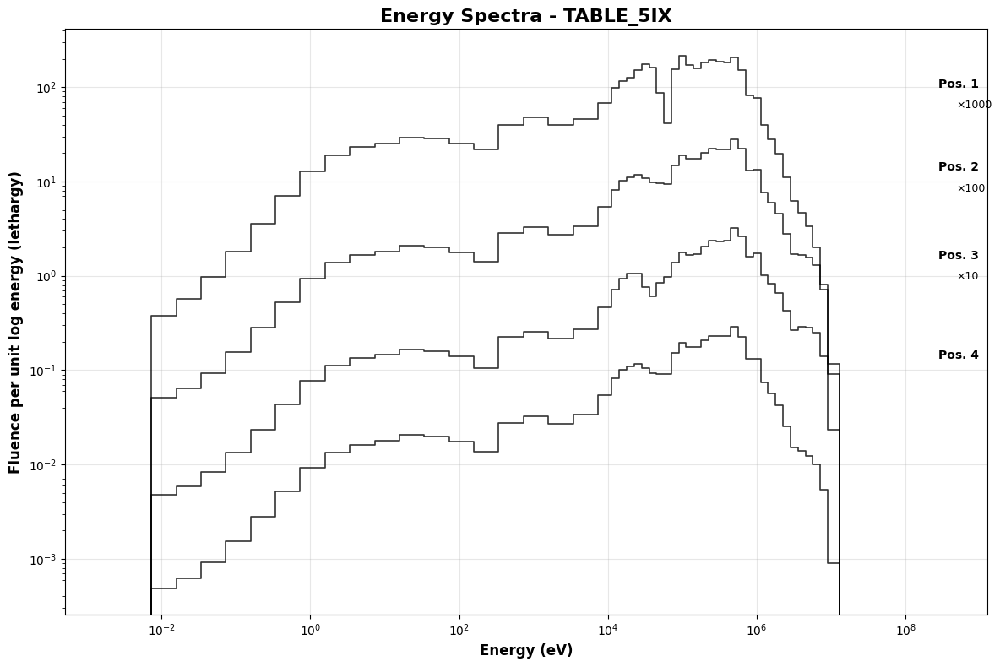


📊 Processing individual plot: TABLE_5VIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5VIII_SPECTRUM_PLOT.png


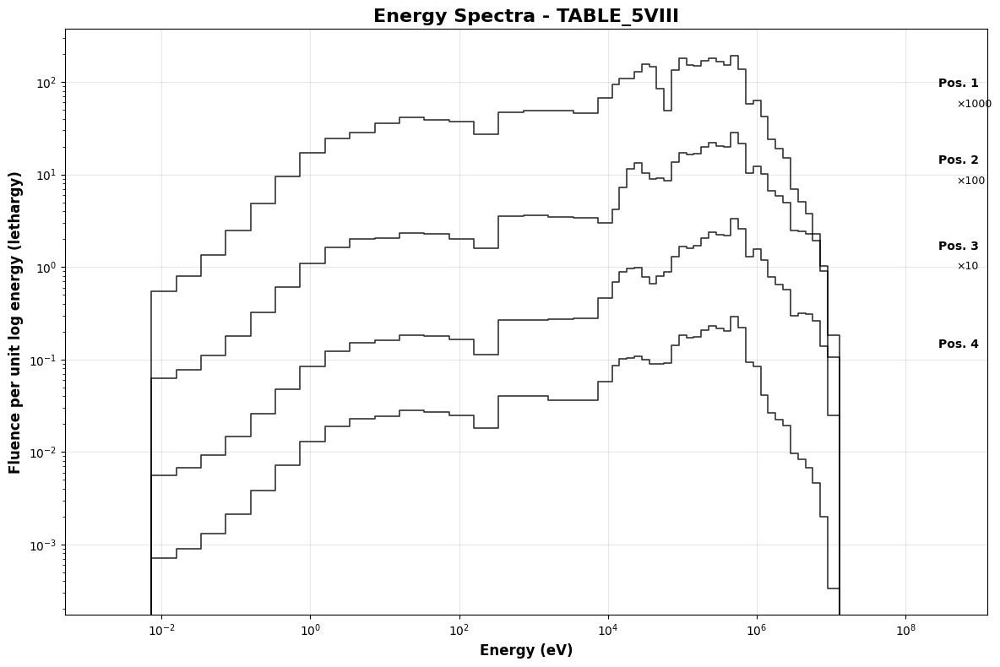


📊 Processing individual plot: TABLE_5XIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XIII_SPECTRUM_PLOT.png


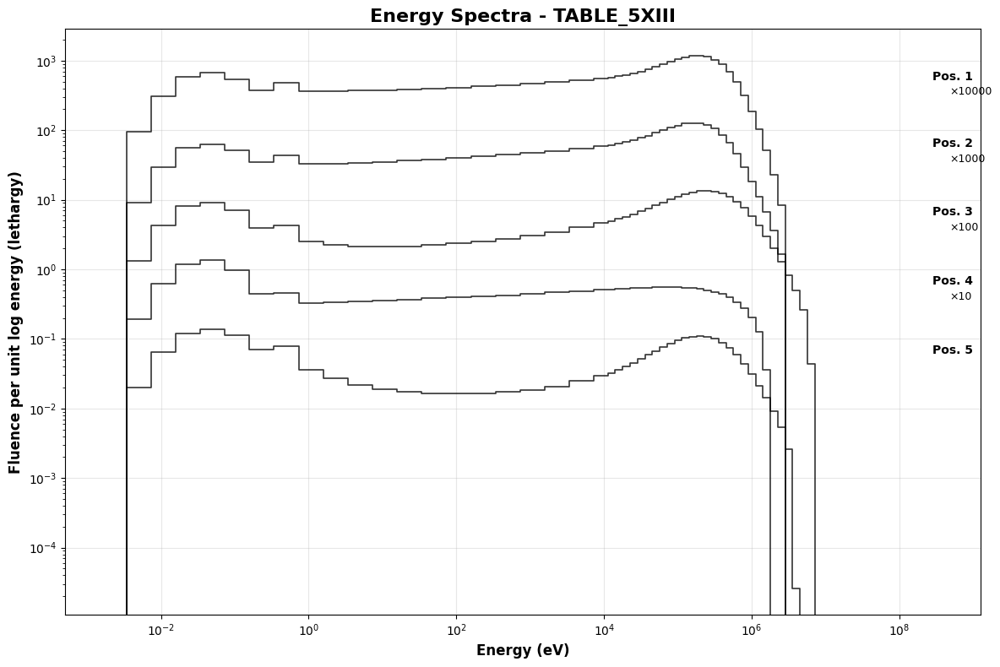


📊 Processing individual plot: TABLE_5XII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XII_SPECTRUM_PLOT.png


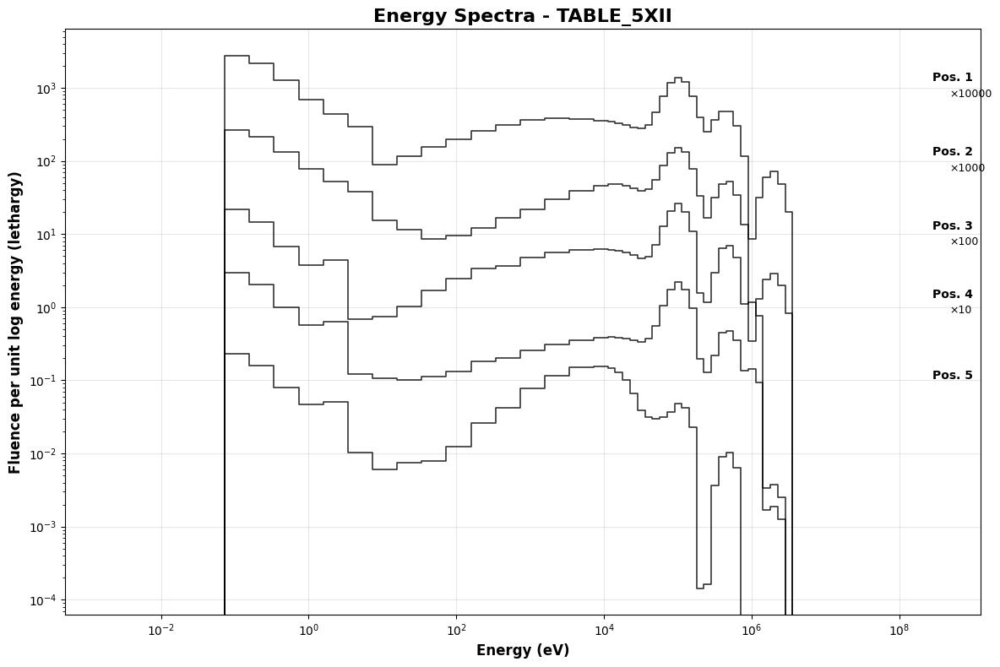


📊 Processing individual plot: TABLE_5XIV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XIV_SPECTRUM_PLOT.png


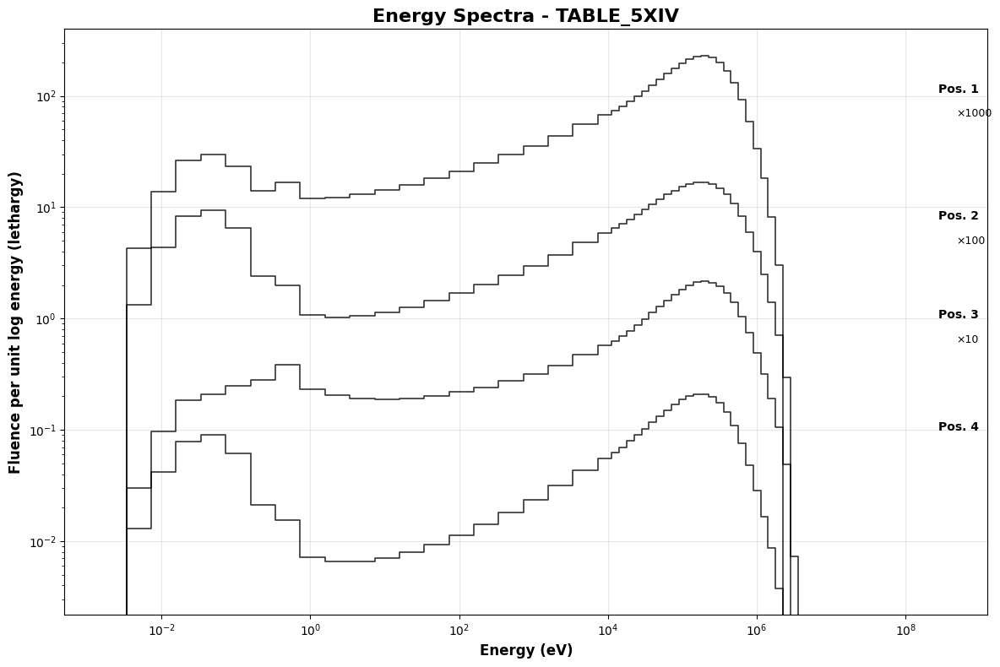


📊 Processing individual plot: TABLE_5XIX_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XIX_SPECTRUM_PLOT.png


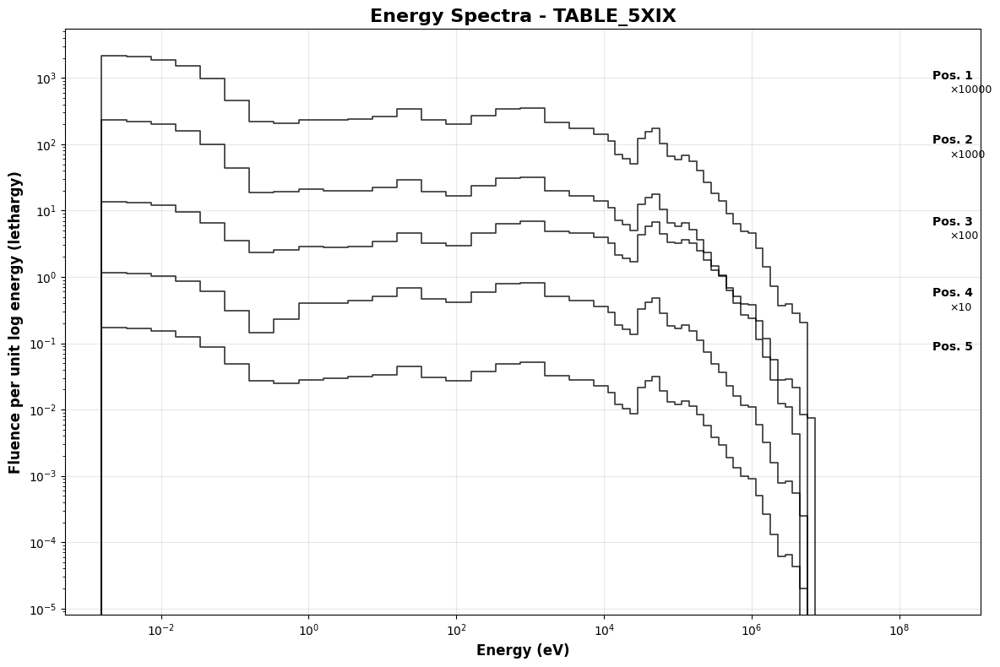


📊 Processing individual plot: TABLE_5XI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XI_SPECTRUM_PLOT.png


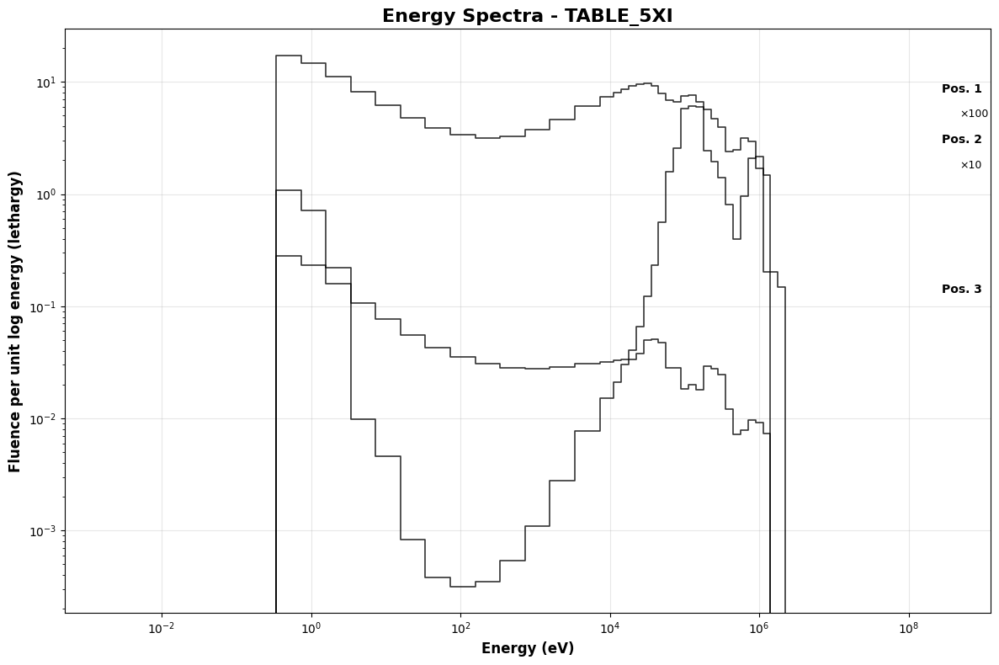


📊 Processing individual plot: TABLE_5XLIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XLIII_SPECTRUM_PLOT.png


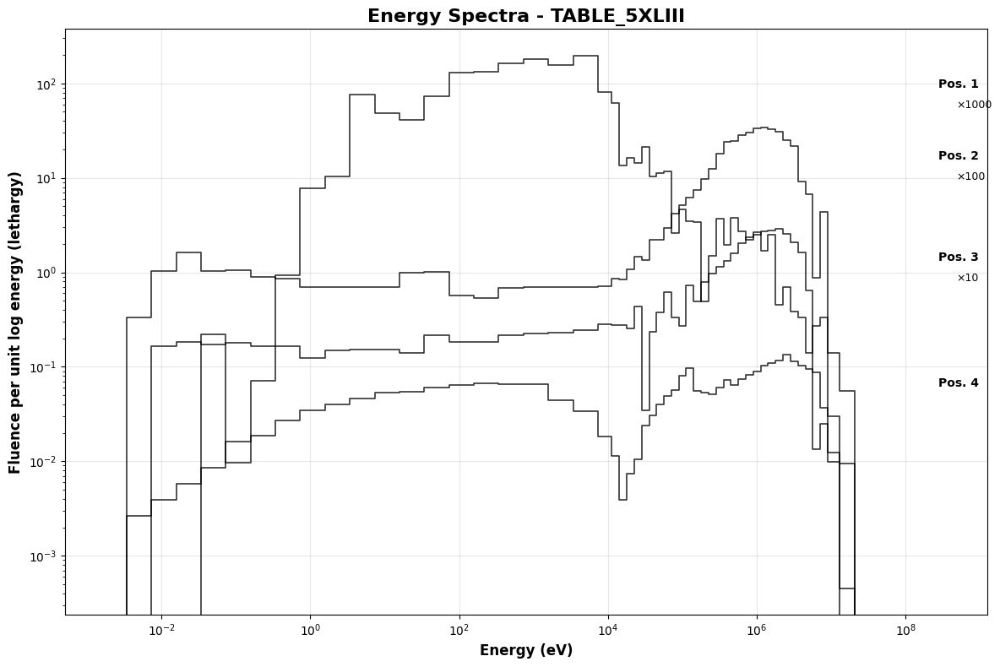


📊 Processing individual plot: TABLE_5XLII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XLII_SPECTRUM_PLOT.png


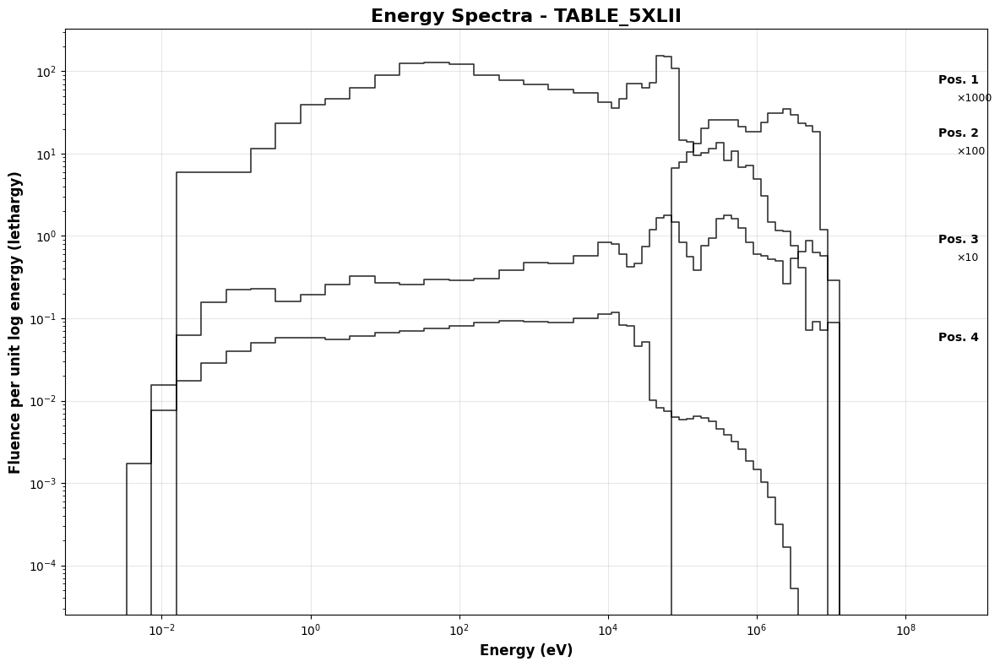


📊 Processing individual plot: TABLE_5XLIV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XLIV_SPECTRUM_PLOT.png


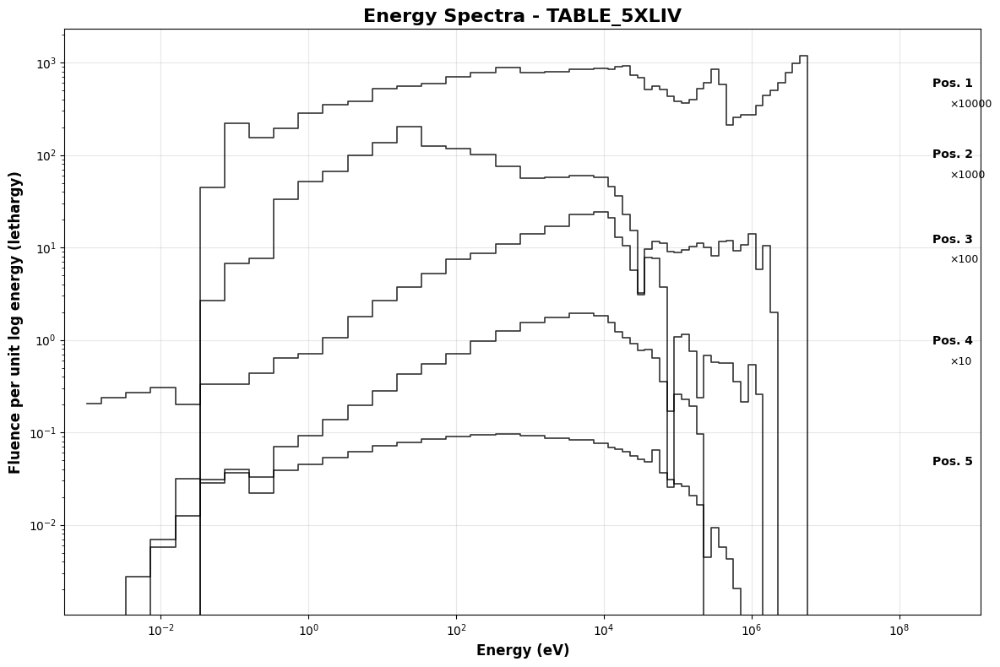


📊 Processing individual plot: TABLE_5XLI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XLI_SPECTRUM_PLOT.png


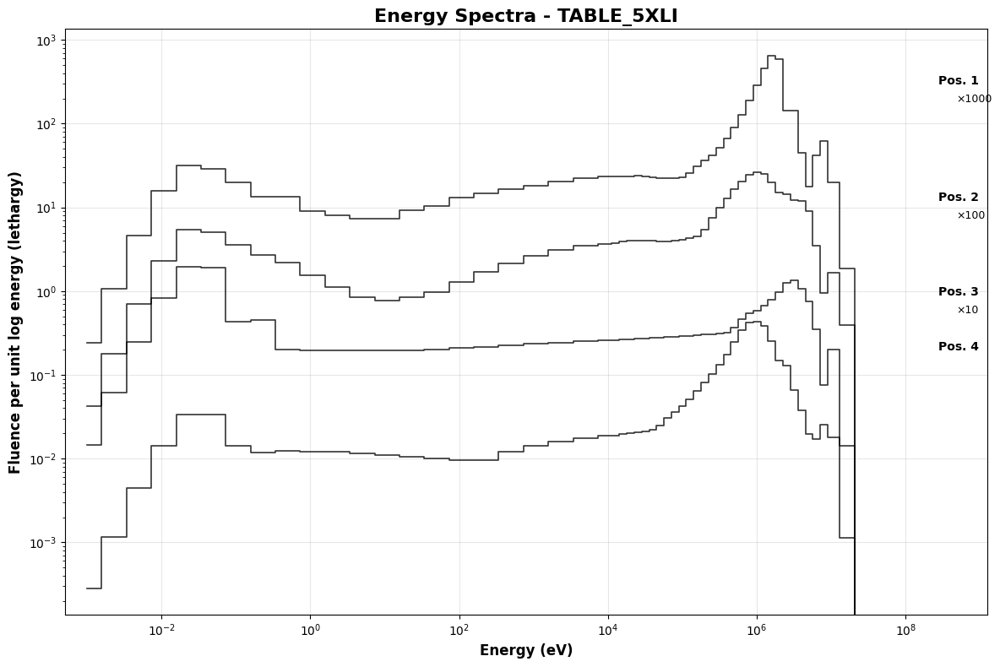


📊 Processing individual plot: TABLE_5XVIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XVIII_SPECTRUM_PLOT.png


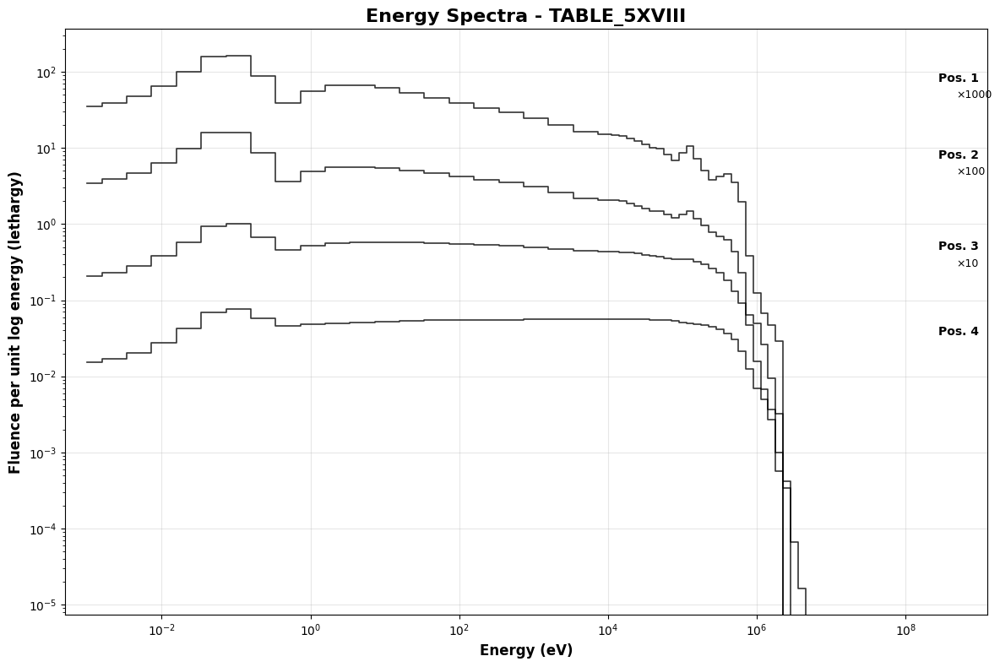


📊 Processing individual plot: TABLE_5XVII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XVII_SPECTRUM_PLOT.png


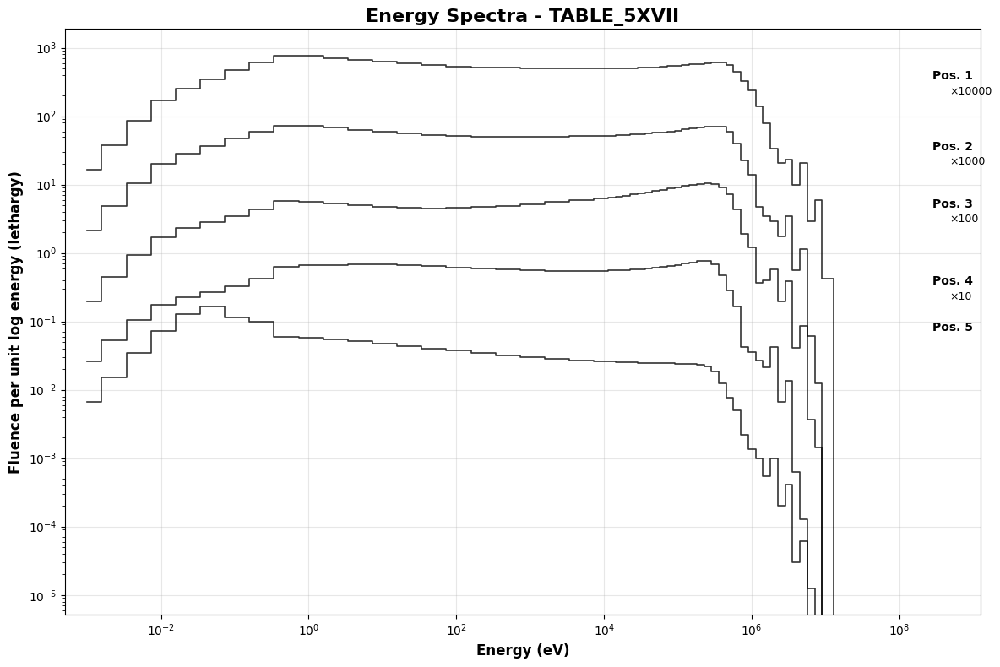


📊 Processing individual plot: TABLE_5XVI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XVI_SPECTRUM_PLOT.png


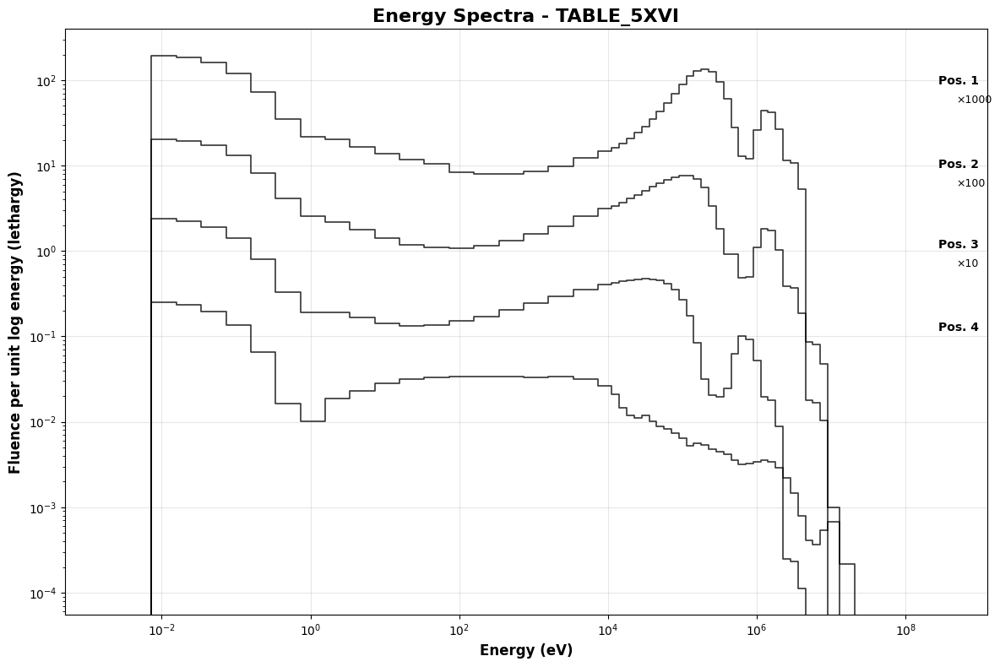


📊 Processing individual plot: TABLE_5XV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XV_SPECTRUM_PLOT.png


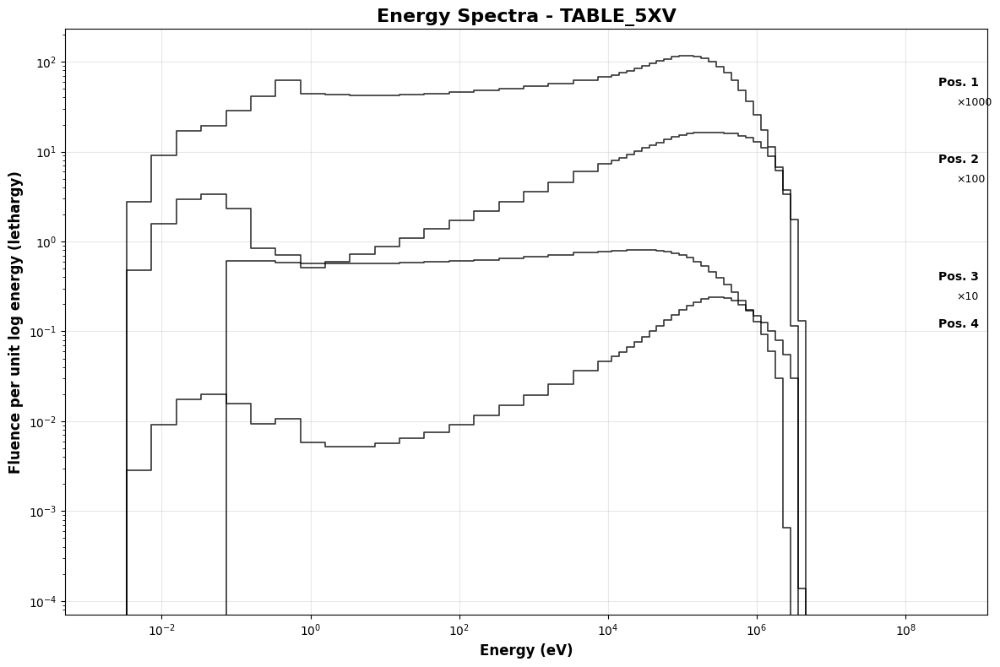


📊 Processing individual plot: TABLE_5XXIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXIII_SPECTRUM_PLOT.png


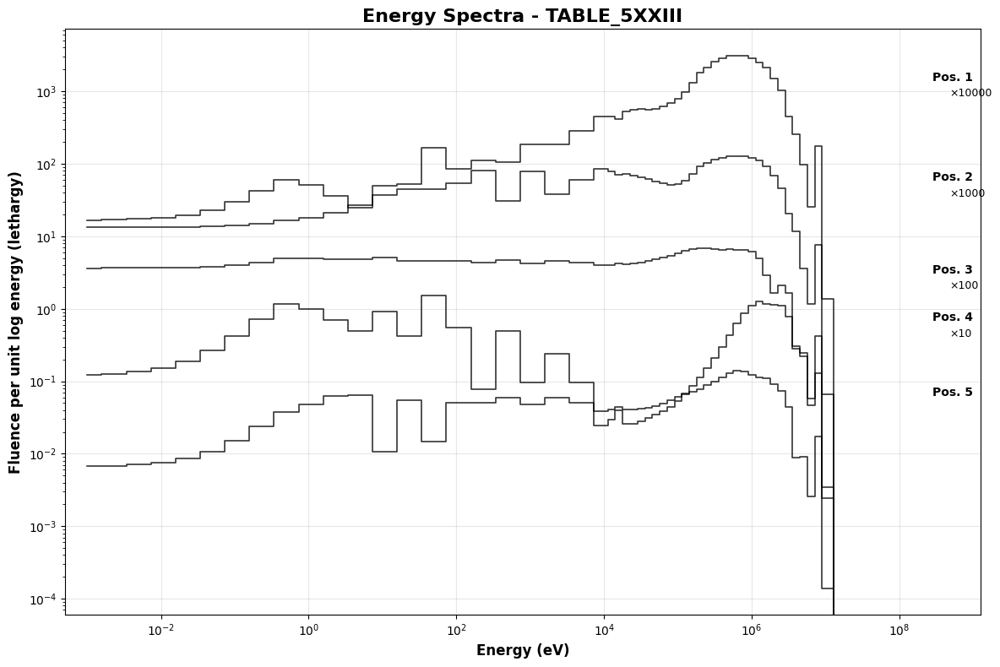


📊 Processing individual plot: TABLE_5XXII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXII_SPECTRUM_PLOT.png


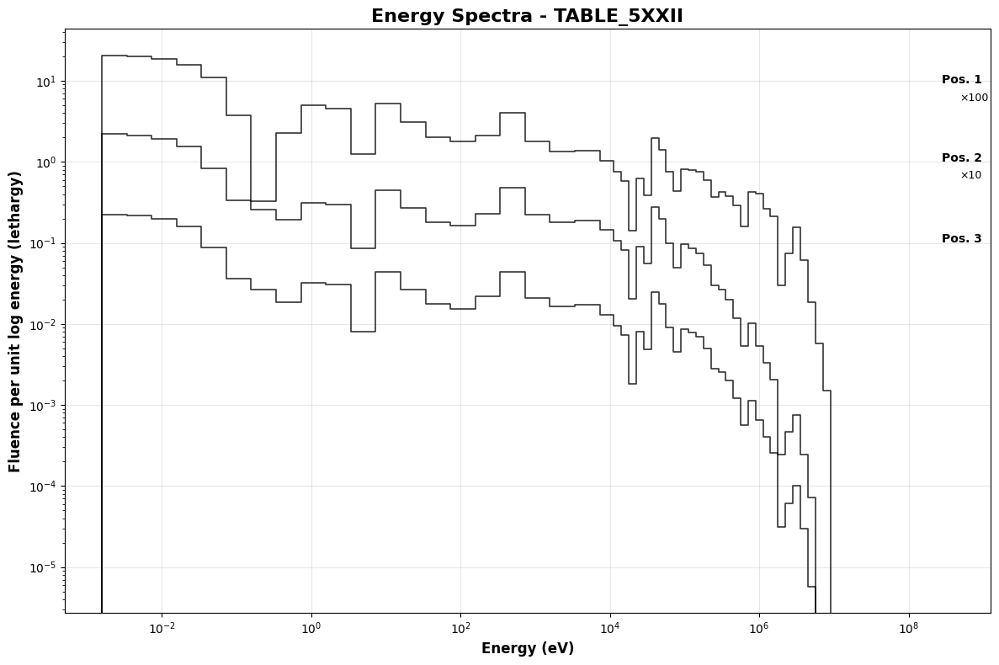


📊 Processing individual plot: TABLE_5XXIV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXIV_SPECTRUM_PLOT.png


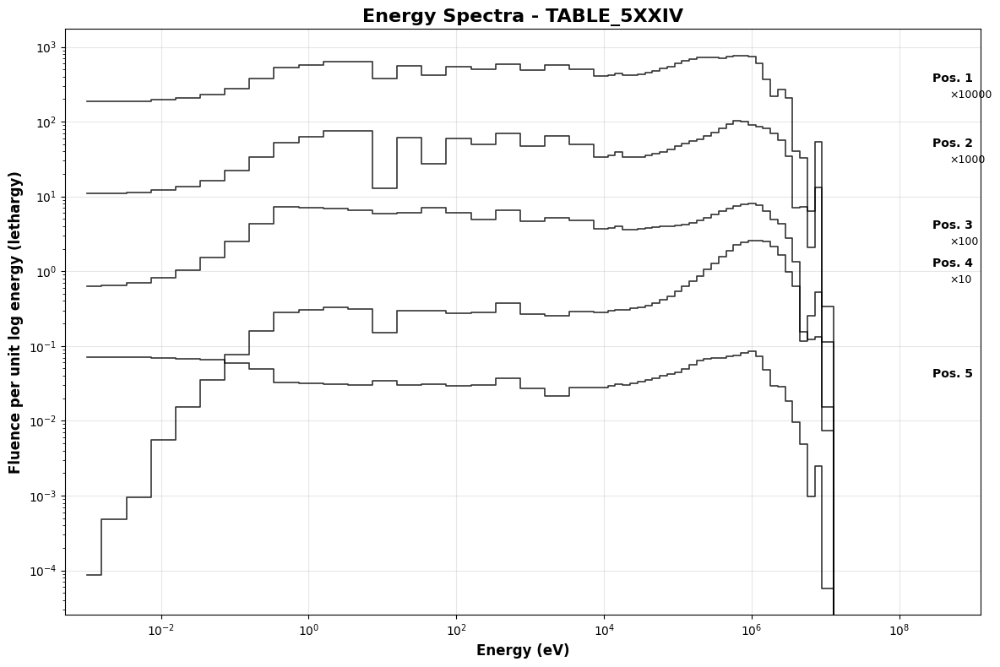


📊 Processing individual plot: TABLE_5XXIX_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXIX_SPECTRUM_PLOT.png


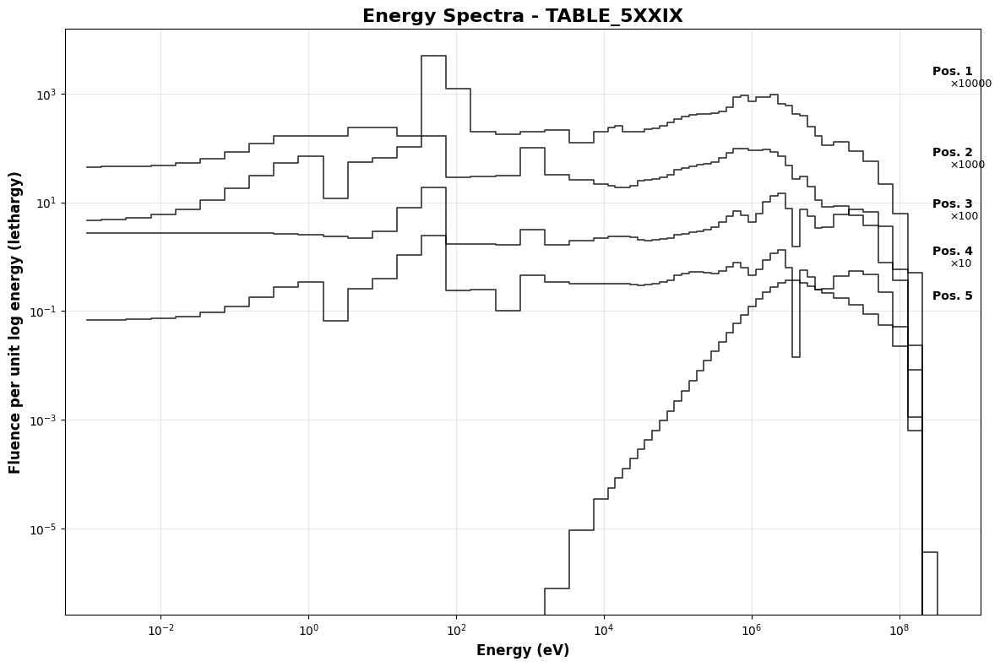


📊 Processing individual plot: TABLE_5XXI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXI_SPECTRUM_PLOT.png


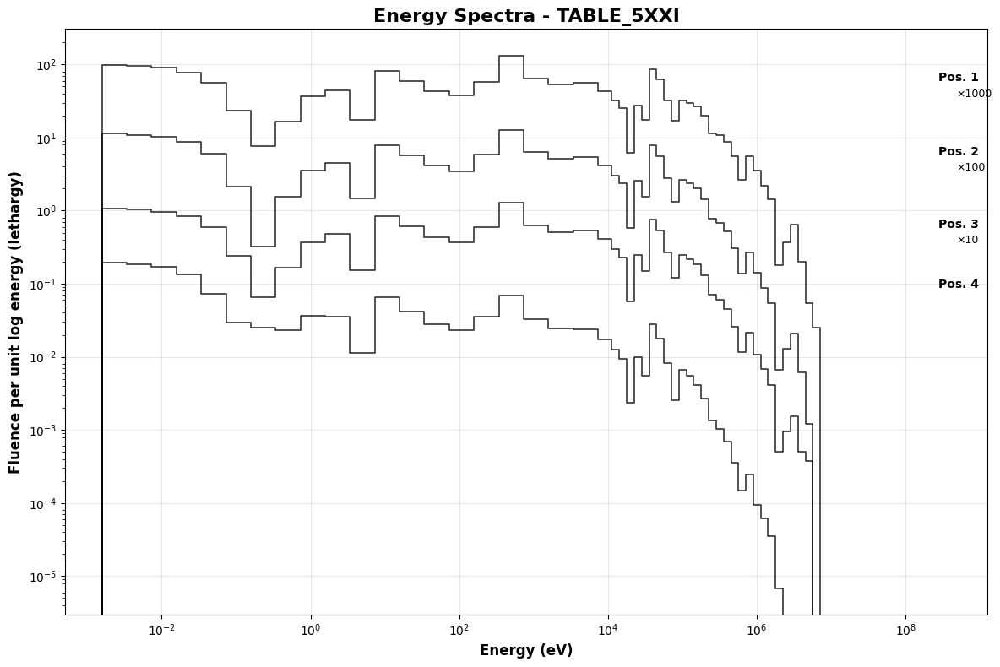


📊 Processing individual plot: TABLE_5XXVIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXVIII_SPECTRUM_PLOT.png


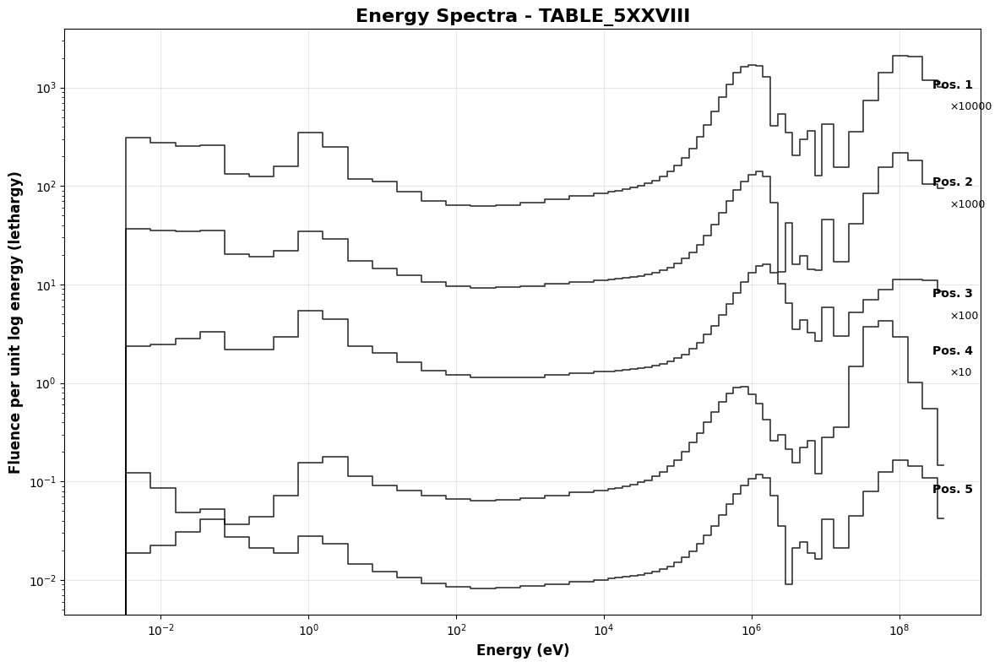


📊 Processing individual plot: TABLE_5XXVII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXVII_SPECTRUM_PLOT.png


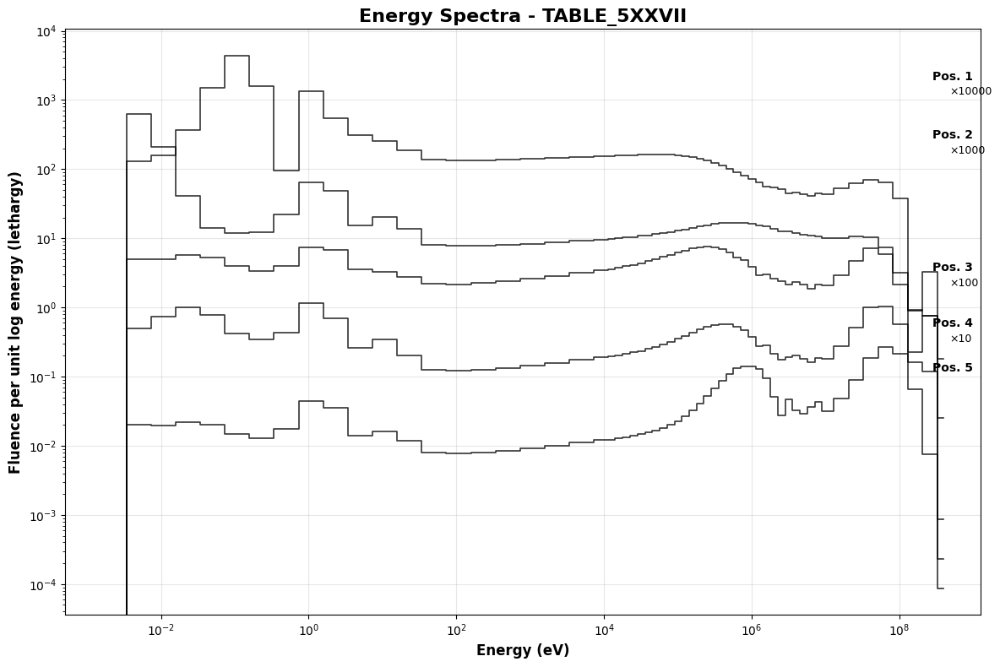


📊 Processing individual plot: TABLE_5XXVI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXVI_SPECTRUM_PLOT.png


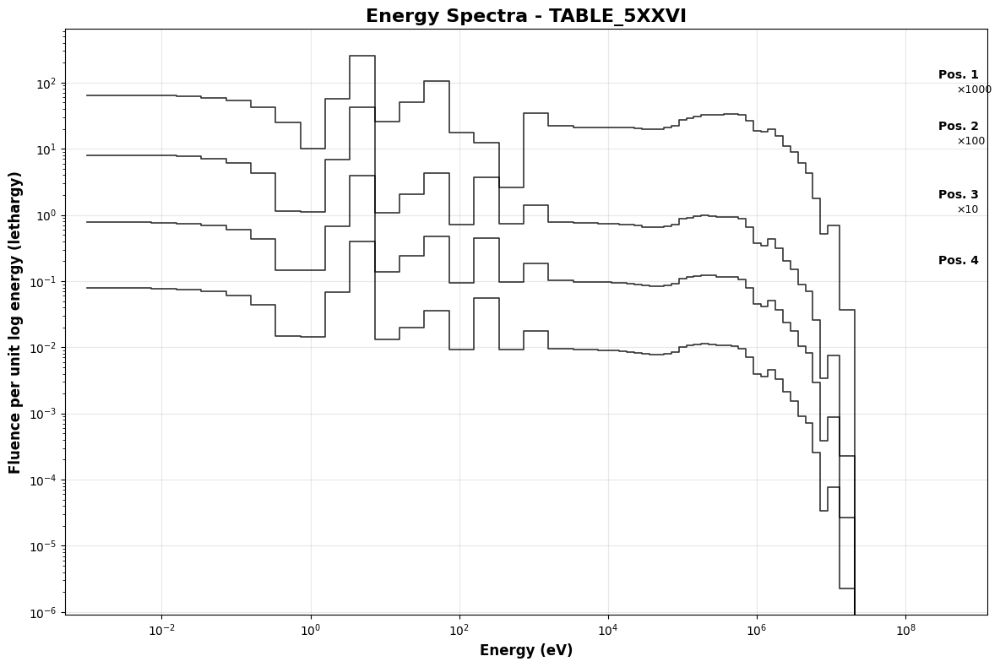


📊 Processing individual plot: TABLE_5XXV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXV_SPECTRUM_PLOT.png


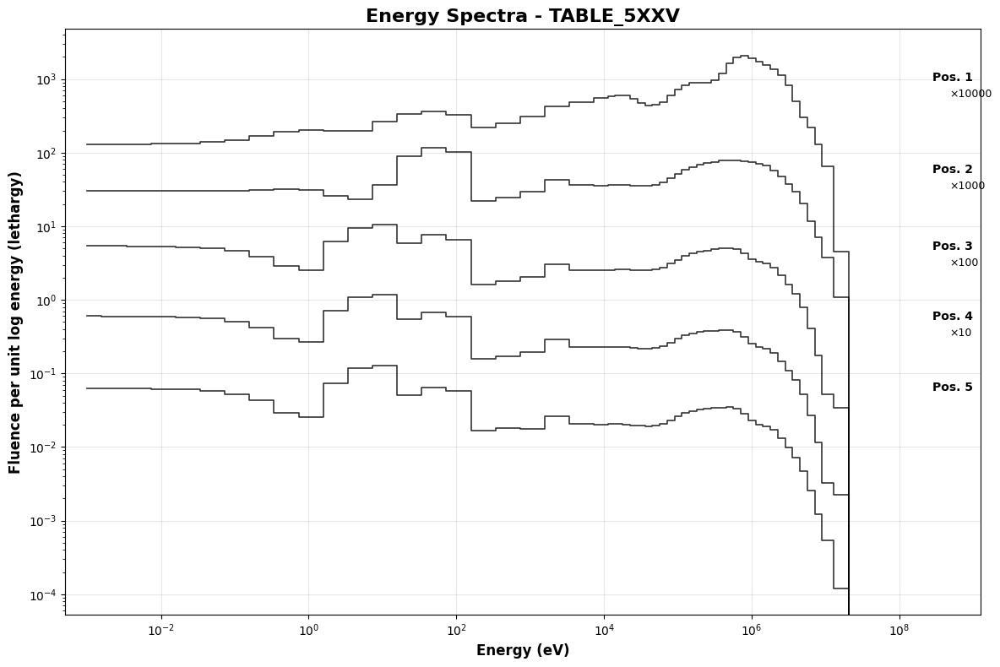


📊 Processing individual plot: TABLE_5XXXIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXIII_SPECTRUM_PLOT.png


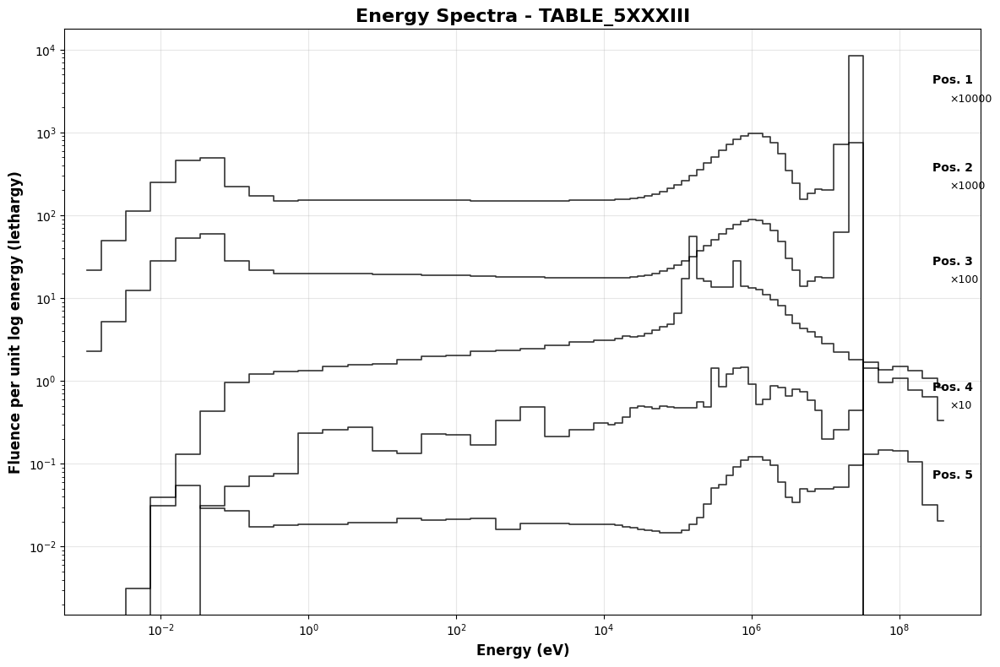


📊 Processing individual plot: TABLE_5XXXII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXII_SPECTRUM_PLOT.png


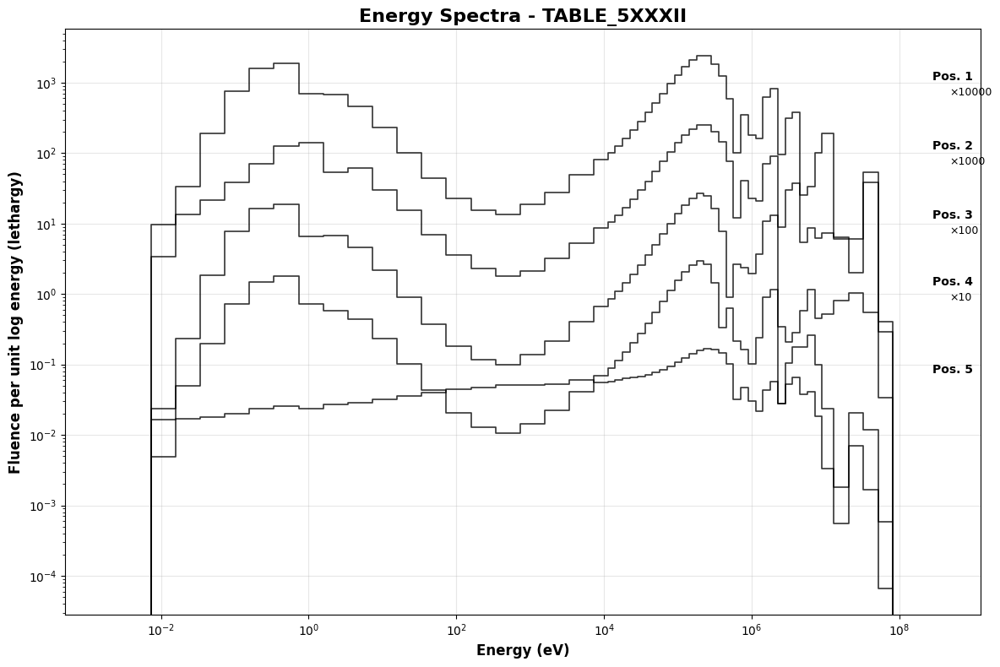


📊 Processing individual plot: TABLE_5XXXIV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXIV_SPECTRUM_PLOT.png


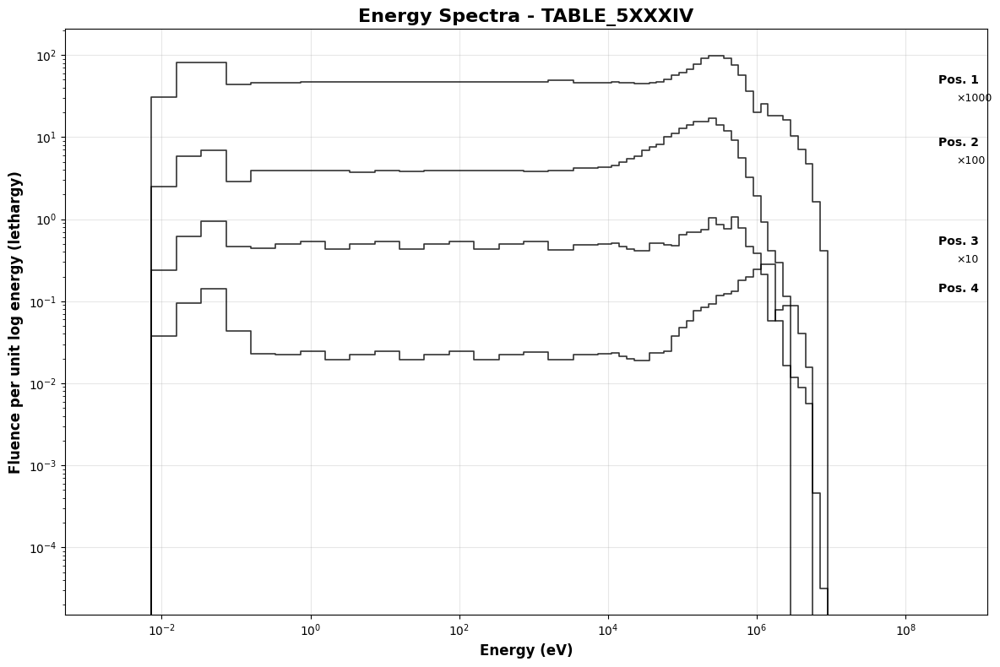


📊 Processing individual plot: TABLE_5XXXIX_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXIX_SPECTRUM_PLOT.png


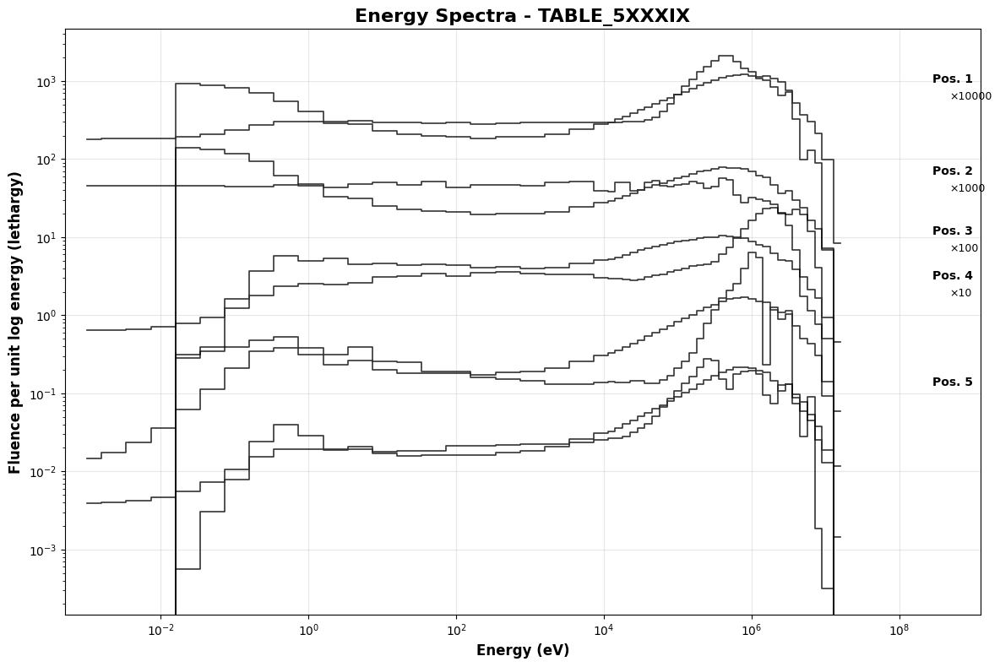


📊 Processing individual plot: TABLE_5XXXI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXI_SPECTRUM_PLOT.png


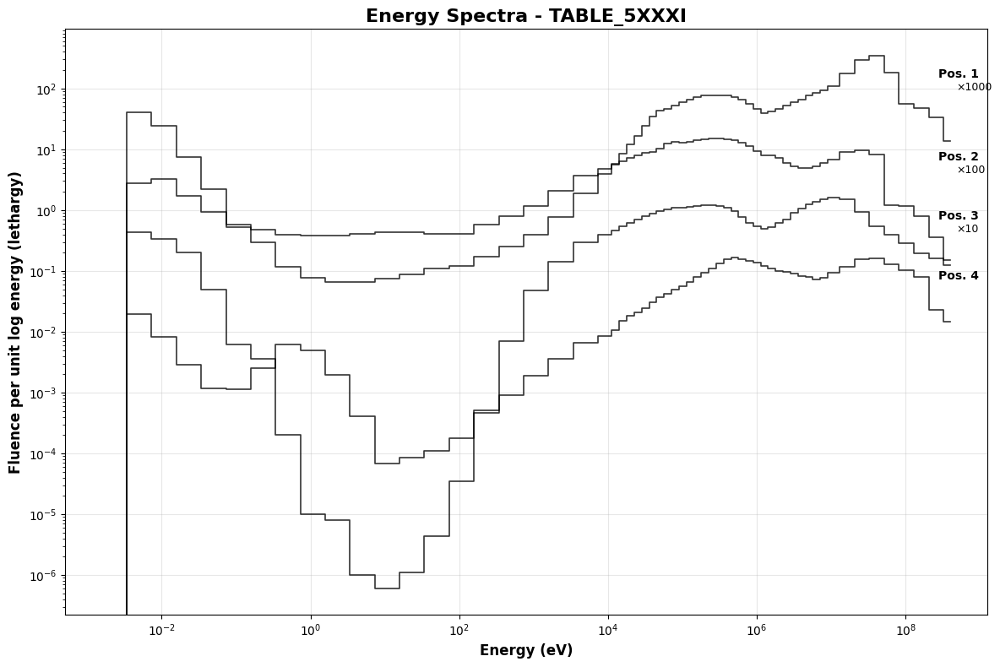


📊 Processing individual plot: TABLE_5XXXVIII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXVIII_SPECTRUM_PLOT.png


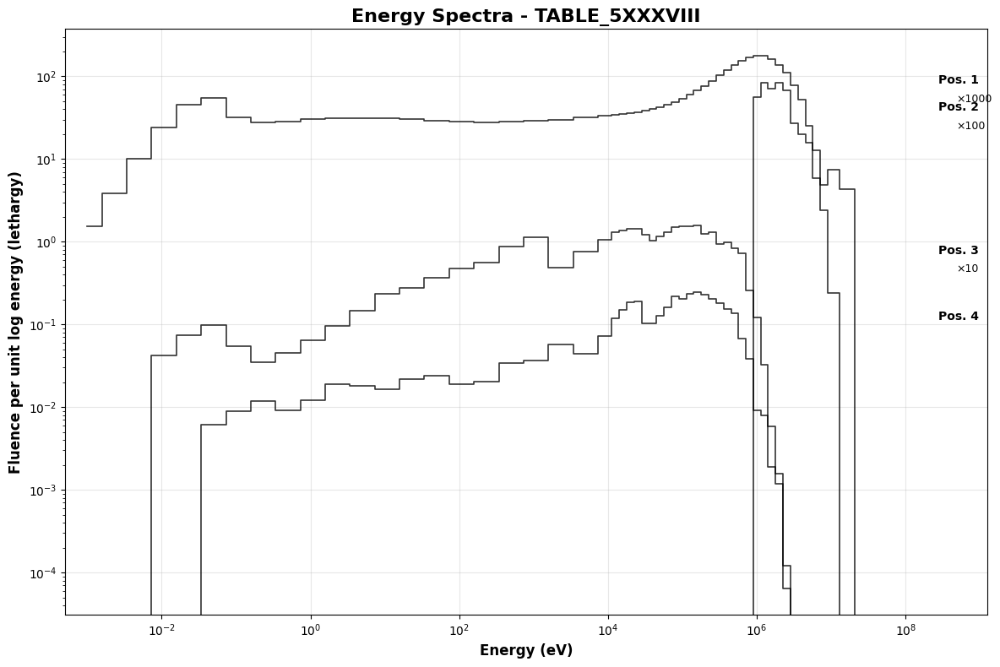


📊 Processing individual plot: TABLE_5XXXVII_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXVII_SPECTRUM_PLOT.png


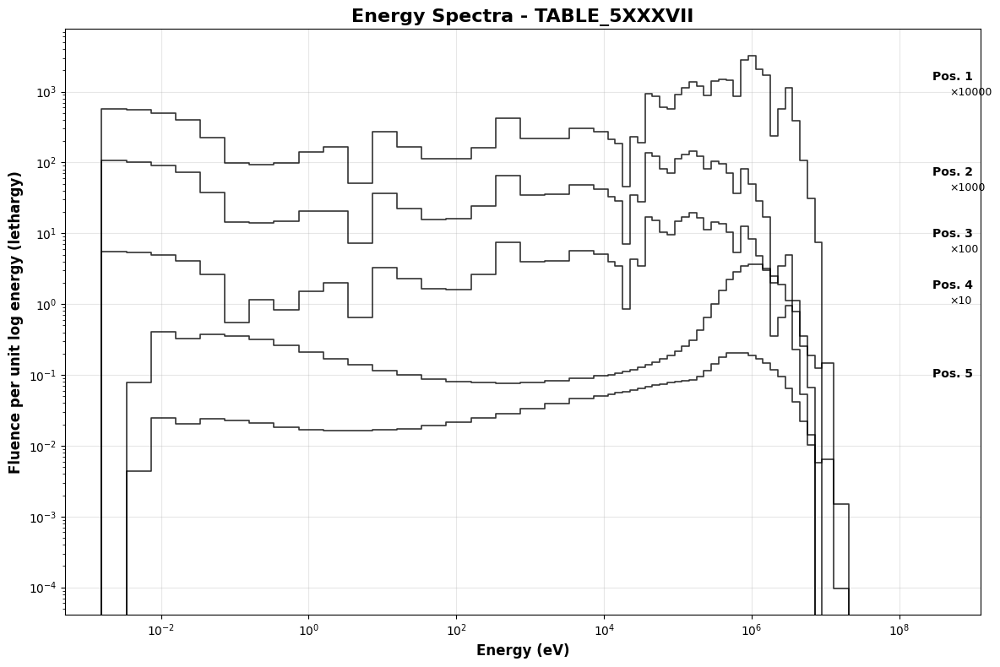


📊 Processing individual plot: TABLE_5XXXVI_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXVI_SPECTRUM_PLOT.png


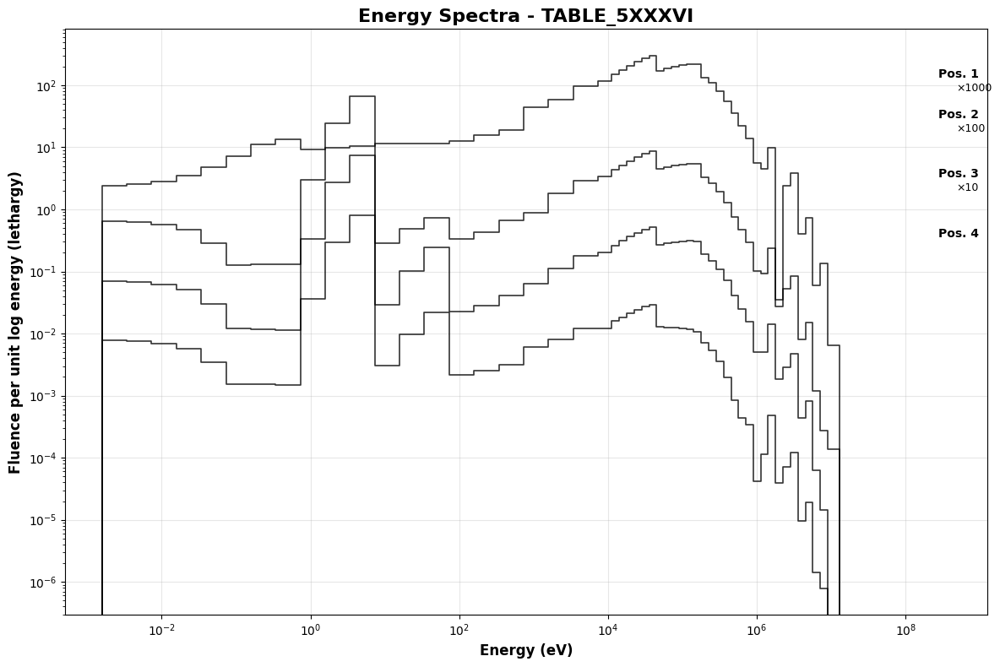


📊 Processing individual plot: TABLE_5XXXV_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXXV_SPECTRUM_PLOT.png


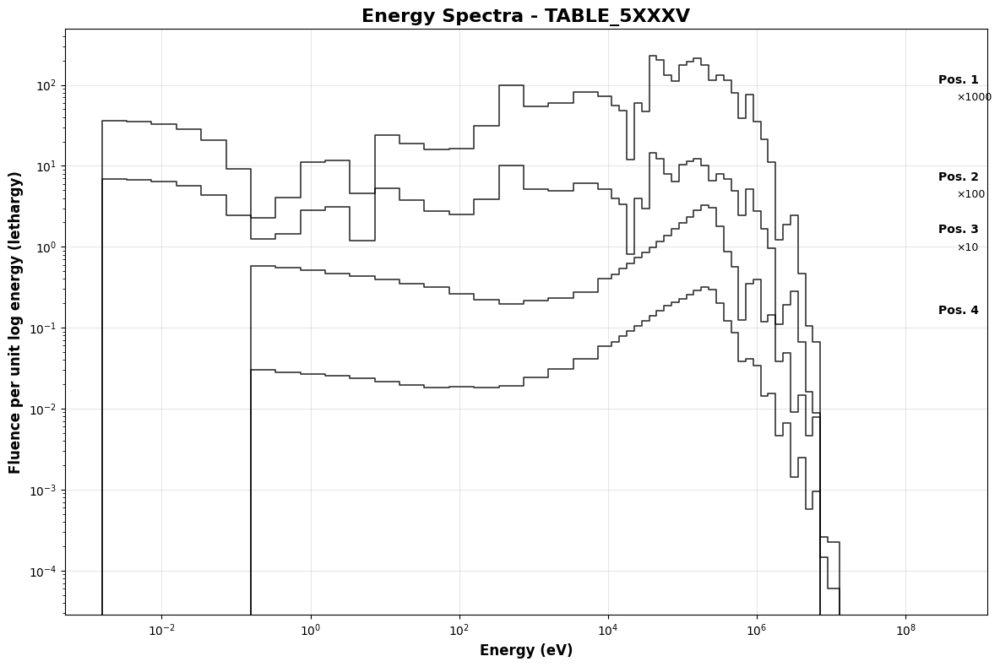


📊 Processing individual plot: TABLE_5XXX_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XXX_SPECTRUM_PLOT.png


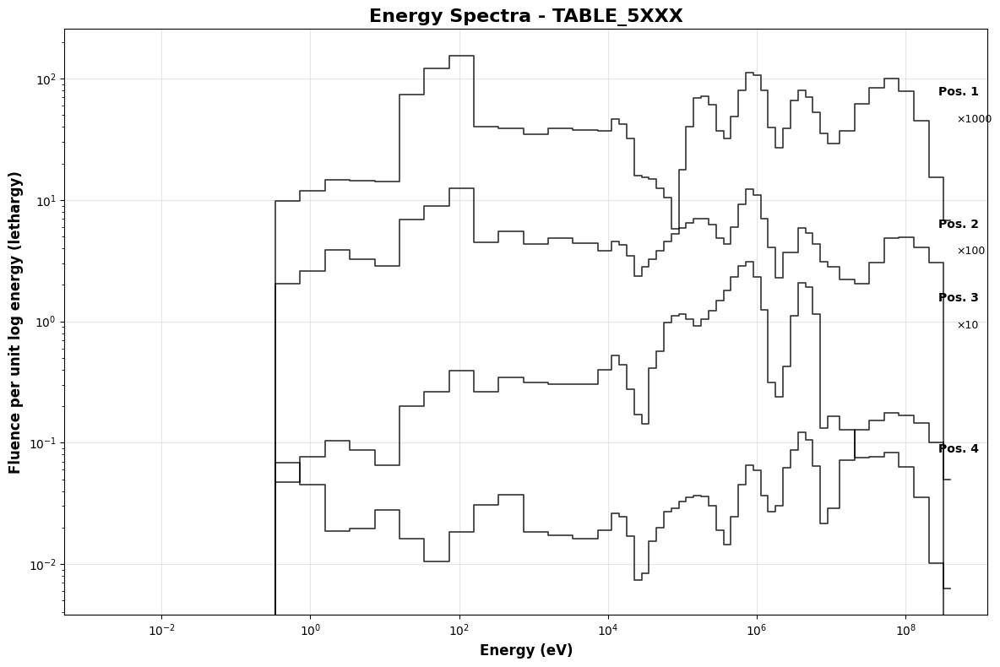


📊 Processing individual plot: TABLE_5XX_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5XX_SPECTRUM_PLOT.png


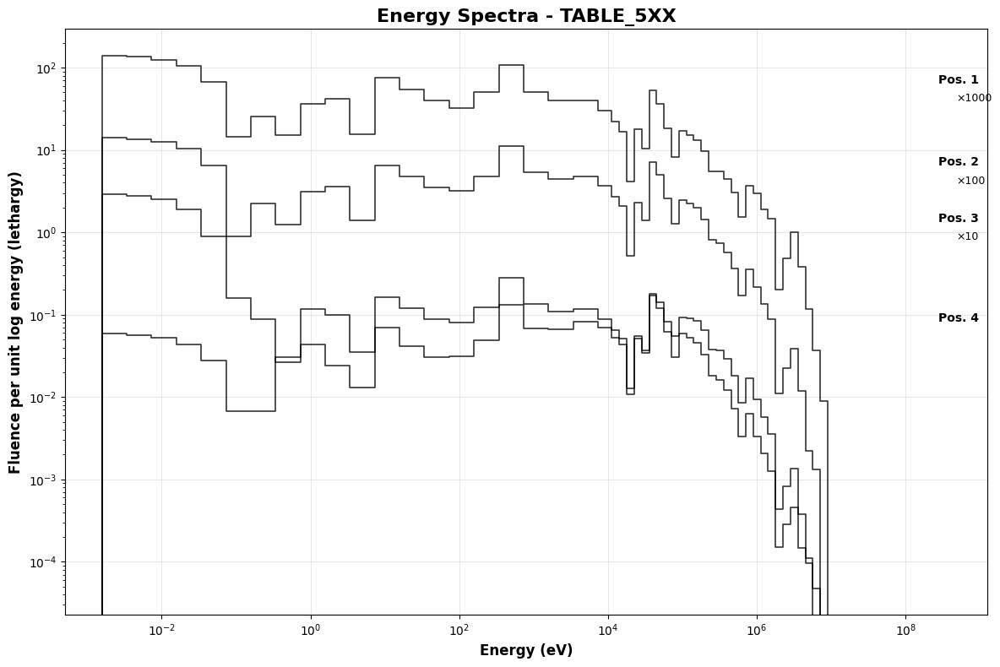


📊 Processing individual plot: TABLE_5X_SPECTRA_SECTIONS.csv
✅ Saved plot: TABLE_5X_SPECTRUM_PLOT.png


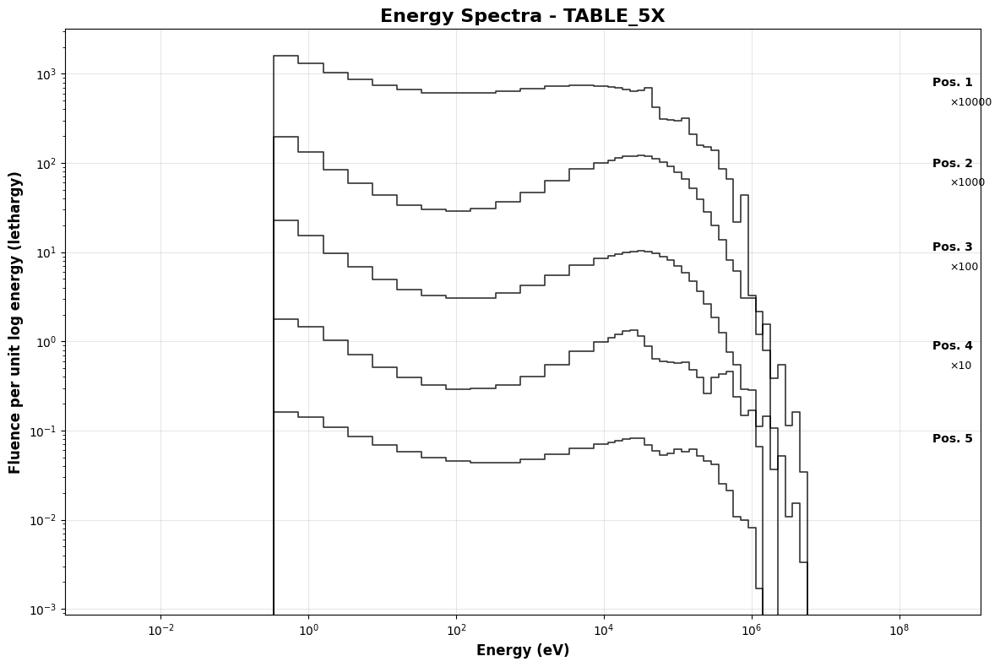


📊 Creating combined ladder plot...
✅ Saved combined ladder plot: CH5_COMBINED_LADDER_PLOT.png


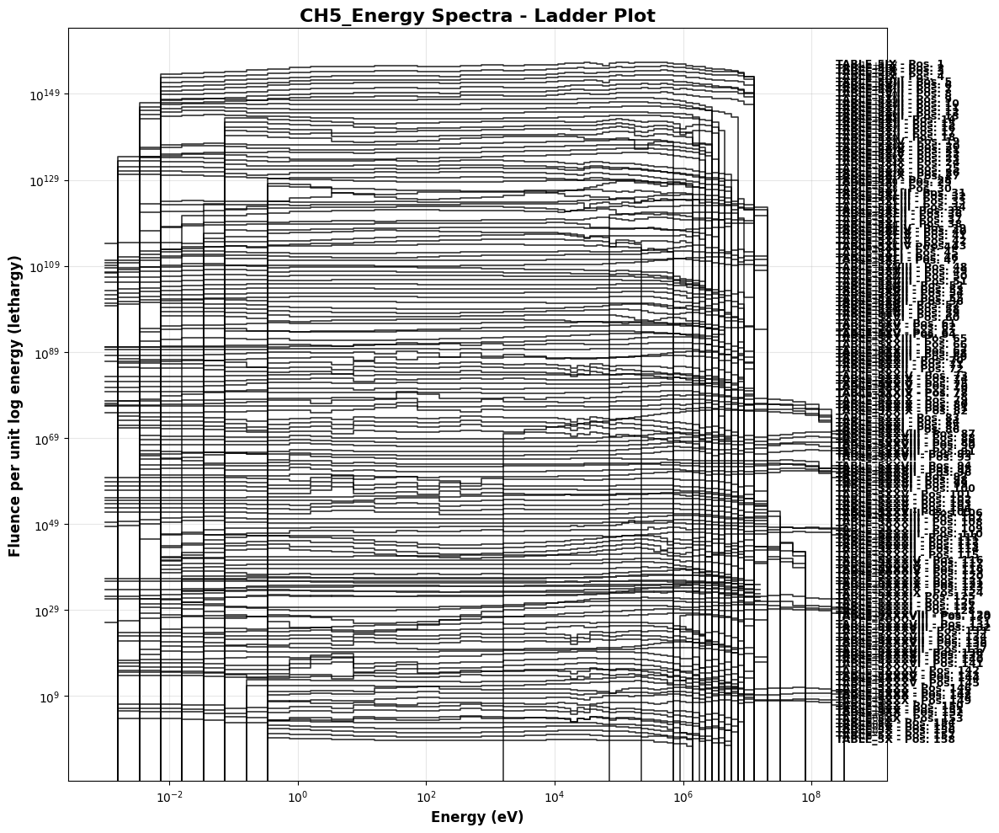


📈 PLOTTING SUMMARY:
   Individual plots: 36/36 files
   Combined ladder plot: 1 file
   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png

🎉 All plots completed!
📁 Check current directory for PNG plot files


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from pathlib import Path

def plot_spectra_from_csv(csv_file):
    """
    Plot spectral data from a single CSV file.
    X-axis: Energy_eV, Y-axis: All other columns
    """
    try:
        # Read the CSV file
        df = pd.read_csv(csv_file)

        # Check if the file has the expected structure
        if 'Energy_eV' not in df.columns:
            print(f"⚠️  Warning: No 'Energy_eV' column found in {csv_file}")
            return

        # Get all columns except Energy_eV
        data_columns = [col for col in df.columns if col != 'Energy_eV']

        if not data_columns:
            print(f"⚠️  Warning: No data columns found in {csv_file}")
            return

        # Convert Energy_eV to numeric, handling scientific notation
        df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')

        # Remove rows with NaN energy values
        df = df.dropna(subset=['Energy_eV'])

        if df.empty:
            print(f"⚠️  Warning: No valid energy data in {csv_file}")
            return

        # Create the plot
        plt.figure(figsize=(12, 8))

        # Plot each data column against energy with ladder offset
        colors = ['black'] * len(data_columns)  # Use black for all curves like the reference

        # Calculate offset multipliers for ladder effect (decreasing from top to bottom)
        offset_multipliers = [10**(i) for i in range(len(data_columns))][::-1]  # Reverse for top-to-bottom

        for i, col in enumerate(data_columns):
            # Convert column data to numeric
            df[col] = pd.to_numeric(df[col], errors='coerce')

            # Remove rows where this column has NaN values
            valid_data = df.dropna(subset=[col])

            if not valid_data.empty:
                # Apply vertical offset for ladder effect
                offset_data = valid_data[col] * offset_multipliers[i]

                plt.loglog(valid_data['Energy_eV'], offset_data,
                          color=colors[i], linewidth=1.2, drawstyle='steps-mid',
                          alpha=0.8)

                # Add position label and multiplier annotation
                pos_label = f"Pos. {i+1}"
                multiplier_label = f"×{offset_multipliers[i]:g}" if offset_multipliers[i] != 1 else ""

                # Position the labels on the right side of the plot
                if not valid_data.empty:
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    # Position label
                    plt.text(max_energy * 0.7, max_flux * 0.5, pos_label,
                            fontsize=10, fontweight='bold', ha='left', va='center')

                    # Multiplier label (if not 1)
                    if multiplier_label:
                        plt.text(max_energy * 1.2, max_flux * 0.3, multiplier_label,
                                fontsize=9, ha='left', va='center')

        # Customize the plot
        table_name = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')
        plt.title(f'Energy Spectra - {table_name}', fontsize=16, fontweight='bold')
        plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
        plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')

        plt.grid(True, alpha=0.3)
        # Remove legend since we're using position labels instead

        # Set axis limits if needed
        if not df['Energy_eV'].empty:
            plt.xlim(df['Energy_eV'].min() * 0.5, df['Energy_eV'].max() * 2)

        plt.tight_layout()

        # Save the plot
        plot_filename = f"{table_name}_SPECTRUM_PLOT.png"
        plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
        print(f"✅ Saved plot: {plot_filename}")

        # Show the plot
        plt.show()

        return True

    except Exception as e:
        print(f"❌ Error plotting {csv_file}: {e}")
        return False


def create_ladder_plot_multiple_files(csv_files, title_prefix=""):
    """
    Create a single ladder plot combining multiple CSV files.
    Each file's data will be offset vertically.
    """
    if not csv_files:
        print("❌ No CSV files provided")
        return

    plt.figure(figsize=(12, 10))

    all_multipliers = []
    position_counter = 1

    # Calculate total number of curves across all files
    total_curves = 0
    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)
            data_columns = [col for col in df.columns if col != 'Energy_eV']
            total_curves += len(data_columns)
        except:
            continue

    # Generate offset multipliers for all curves
    base_multipliers = [10**(i) for i in range(total_curves)][::-1]
    multiplier_idx = 0

    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)

            if 'Energy_eV' not in df.columns:
                continue

            data_columns = [col for col in df.columns if col != 'Energy_eV']
            df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')
            df = df.dropna(subset=['Energy_eV'])

            if df.empty:
                continue

            file_label = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')

            for col in data_columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                valid_data = df.dropna(subset=[col])

                if not valid_data.empty:
                    # Apply vertical offset
                    multiplier = base_multipliers[multiplier_idx]
                    offset_data = valid_data[col] * multiplier

                    plt.loglog(valid_data['Energy_eV'], offset_data,
                              color='black', linewidth=1.2, drawstyle='steps-mid',
                              alpha=0.8)

                    # Add labels
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    pos_label = f"{file_label} - Pos. {position_counter}"
                    multiplier_label = f"×{multiplier:g}" if multiplier != 1 else ""

                    plt.text(max_energy * 0.6, max_flux * 0.5, pos_label,
                            fontsize=9, fontweight='bold', ha='left', va='center')

                    if multiplier_label:
                        plt.text(max_energy * 1.1, max_flux * 0.3, multiplier_label,
                                fontsize=8, ha='left', va='center')

                    position_counter += 1
                    multiplier_idx += 1

        except Exception as e:
            print(f"⚠️  Error processing {csv_file}: {e}")
            continue

    plt.title(f'{title_prefix}Energy Spectra - Ladder Plot', fontsize=16, fontweight='bold')
    plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
    plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    plot_filename = f"{title_prefix}COMBINED_LADDER_PLOT.png"
    plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
    print(f"✅ Saved combined ladder plot: {plot_filename}")
    plt.show()


def plot_all_spectra_files(file_pattern="*SPECTRA*.csv"):
    """
    Find and plot all CSV files - both individual and combined ladder plots.
    """
    csv_files = glob.glob(file_pattern)

    if not csv_files:
        print(f"❌ No CSV files found matching pattern: {file_pattern}")
        print("📂 Current directory contents:")
        for file in os.listdir('.'):
            if file.endswith('.csv'):
                print(f"   📄 {file}")
        return

    print(f"🎯 Found {len(csv_files)} spectral CSV files to plot:")
    for file in sorted(csv_files):
        print(f"   📄 {file}")

    print("\n🚀 Starting plotting process...")
    print("=" * 50)

    # Individual plots with ladder style
    successful_plots = 0
    for csv_file in sorted(csv_files):
        print(f"\n📊 Processing individual plot: {csv_file}")
        if plot_spectra_from_csv(csv_file):
            successful_plots += 1

    # Combined ladder plot
    print(f"\n📊 Creating combined ladder plot...")
    create_ladder_plot_multiple_files(sorted(csv_files), "CH5_")

    print(f"\n📈 PLOTTING SUMMARY:")
    print(f"   Individual plots: {successful_plots}/{len(csv_files)} files")
    print(f"   Combined ladder plot: 1 file")
    print(f"   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png")


def plot_specific_table(table_name):
    """
    Plot a specific table by name (e.g., "TABLE_5I")
    """
    # Look for files matching the table name
    patterns = [
        f"{table_name}*.csv",
        f"*{table_name}*.csv"
    ]

    csv_files = []
    for pattern in patterns:
        csv_files.extend(glob.glob(pattern))

    if not csv_files:
        print(f"❌ No CSV files found for table: {table_name}")
        return

    for csv_file in csv_files:
        print(f"📊 Plotting: {csv_file}")
        plot_spectra_from_csv(csv_file)


def create_summary_info():
    """
    Create a summary of all available spectral data files
    """
    csv_files = glob.glob("*SPECTRA*.csv")

    if not csv_files:
        print("❌ No spectral CSV files found")
        return

    print("📋 SPECTRAL DATA SUMMARY:")
    print("=" * 60)

    for csv_file in sorted(csv_files):
        try:
            df = pd.read_csv(csv_file)
            table_name = Path(csv_file).stem

            if 'Energy_eV' in df.columns:
                data_cols = [col for col in df.columns if col != 'Energy_eV']
                energy_range = f"{df['Energy_eV'].min():.1E} - {df['Energy_eV'].max():.1E} eV"

                print(f"📄 {table_name}:")
                print(f"   📊 Data columns: {len(data_cols)} ({', '.join(data_cols)})")
                print(f"   ⚡ Energy range: {energy_range}")
                print(f"   📈 Data points: {len(df)} rows")
                print()
        except Exception as e:
            print(f"⚠️  Error reading {csv_file}: {e}")


# Main execution options
if __name__ == "__main__":
    # Option 1: Plot all spectral files
    print("🎯 SPECTRAL DATA PLOTTING TOOL")
    print("=" * 40)

    # Show summary first
    create_summary_info()

    # Plot all files
    plot_all_spectra_files()

    # Example of plotting specific table:
    # plot_specific_table("TABLE_5I")

    print("\n🎉 All plots completed!")
    print("📁 Check current directory for PNG plot files")

#Rearranging The Data into 5 Engeny bin

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os
import zipfile

# --- Settings ---
emin, emax = 1e-3, 1e7   # 10 decades
points_per_decade = 5
n_points = points_per_decade * 10 + 1
new_energies = np.logspace(np.log10(emin), np.log10(emax), n_points)

# input pattern: adjust if needed
input_pattern = "/content/TABLE_*_SPECTRA_SECTIONS.csv"
output_dir = "/content/chapter5_5EnergyBin"
os.makedirs(output_dir, exist_ok=True)

generated_files = []

# --- Process each matching file ---
for filepath in glob.glob(input_pattern):
    filename = os.path.basename(filepath)
    base_name = filename.replace("_SPECTRA_SECTIONS.csv", "_5EnergyBin.csv")
    output_path = os.path.join(output_dir, base_name)

    # --- Load data ---
    df = pd.read_csv(filepath)
    energies = df["Energy_eV"].values
    responses = df.drop(columns=["Energy_eV"]).values

    # --- Interpolate in log-log (mask zeros) ---
    new_responses = []
    for i in range(responses.shape[1]):
        col = responses[:, i]

        # mask only positive values
        mask = col > 0
        if np.sum(mask) < 2:
            # not enough points to interpolate safely → return all zeros
            new_col = np.zeros_like(new_energies)
        else:
            f = interp1d(np.log10(energies[mask]),
                         np.log10(col[mask]),
                         kind="linear",
                         fill_value="extrapolate")
            new_col = 10**f(np.log10(new_energies))

        new_responses.append(new_col)

    new_responses = np.array(new_responses).T

    # --- Save rebinned ---
    rebinned = pd.DataFrame(new_responses, columns=df.columns[1:])
    rebinned.insert(0, "Energy_eV", new_energies)
    rebinned.to_csv(output_path, index=False, float_format="%.2E")

    print(f"✅ Saved: {output_path}")
    generated_files.append(output_path)

# --- Zip all results ---
zip_path = "/content/chapter5_5EnergyBin.zip"
with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for f in generated_files:
        zipf.write(f, os.path.basename(f))

print(f"📦 All rebinned CSVs compressed into: {zip_path}")


✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXVIII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXIV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XVII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXVII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXVI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XIX_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXVI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XVI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXVIII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XLIV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXVII_5EnergyBin.csv
✅ Saved: /content/chap

🎯 SPECTRAL DATA PLOTTING TOOL
❌ No spectral CSV files found
🎯 Found 36 spectral CSV files to plot:
   📄 TABLE_5IX_5EnergyBin.csv
   📄 TABLE_5VIII_5EnergyBin.csv
   📄 TABLE_5XIII_5EnergyBin.csv
   📄 TABLE_5XII_5EnergyBin.csv
   📄 TABLE_5XIV_5EnergyBin.csv
   📄 TABLE_5XIX_5EnergyBin.csv
   📄 TABLE_5XI_5EnergyBin.csv
   📄 TABLE_5XLIII_5EnergyBin.csv
   📄 TABLE_5XLII_5EnergyBin.csv
   📄 TABLE_5XLIV_5EnergyBin.csv
   📄 TABLE_5XLI_5EnergyBin.csv
   📄 TABLE_5XVIII_5EnergyBin.csv
   📄 TABLE_5XVII_5EnergyBin.csv
   📄 TABLE_5XVI_5EnergyBin.csv
   📄 TABLE_5XV_5EnergyBin.csv
   📄 TABLE_5XXIII_5EnergyBin.csv
   📄 TABLE_5XXII_5EnergyBin.csv
   📄 TABLE_5XXIV_5EnergyBin.csv
   📄 TABLE_5XXIX_5EnergyBin.csv
   📄 TABLE_5XXI_5EnergyBin.csv
   📄 TABLE_5XXVIII_5EnergyBin.csv
   📄 TABLE_5XXVII_5EnergyBin.csv
   📄 TABLE_5XXVI_5EnergyBin.csv
   📄 TABLE_5XXV_5EnergyBin.csv
   📄 TABLE_5XXXIII_5EnergyBin.csv
   📄 TABLE_5XXXII_5EnergyBin.csv
   📄 TABLE_5XXXIV_5EnergyBin.csv
   📄 TABLE_5XXXIX_5EnergyBin.csv
   📄 TA

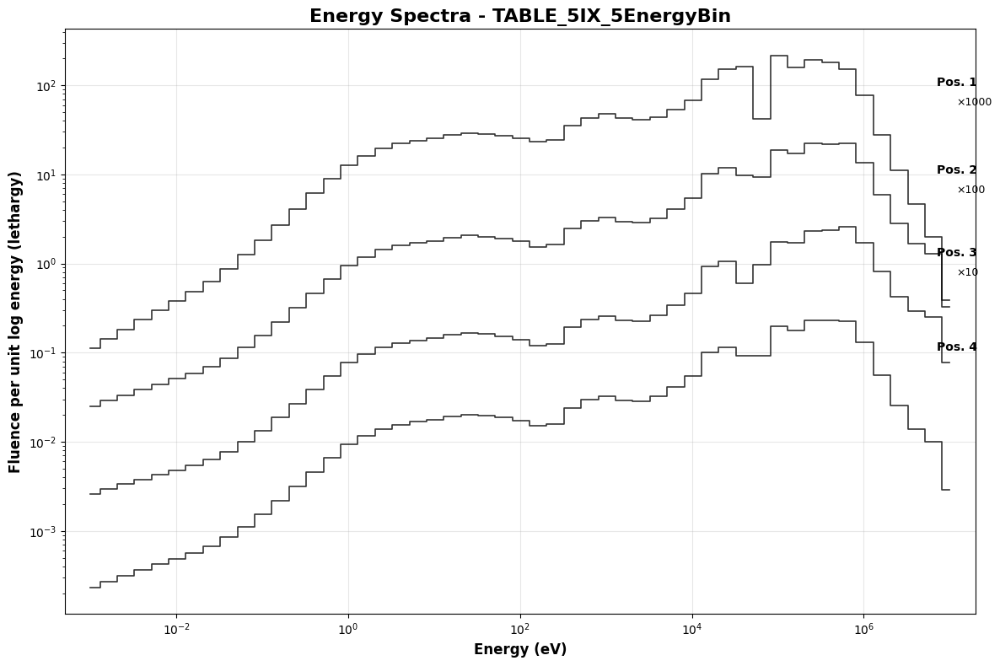


📊 Processing individual plot: TABLE_5VIII_5EnergyBin.csv
✅ Saved plot: TABLE_5VIII_5EnergyBin_SPECTRUM_PLOT.png


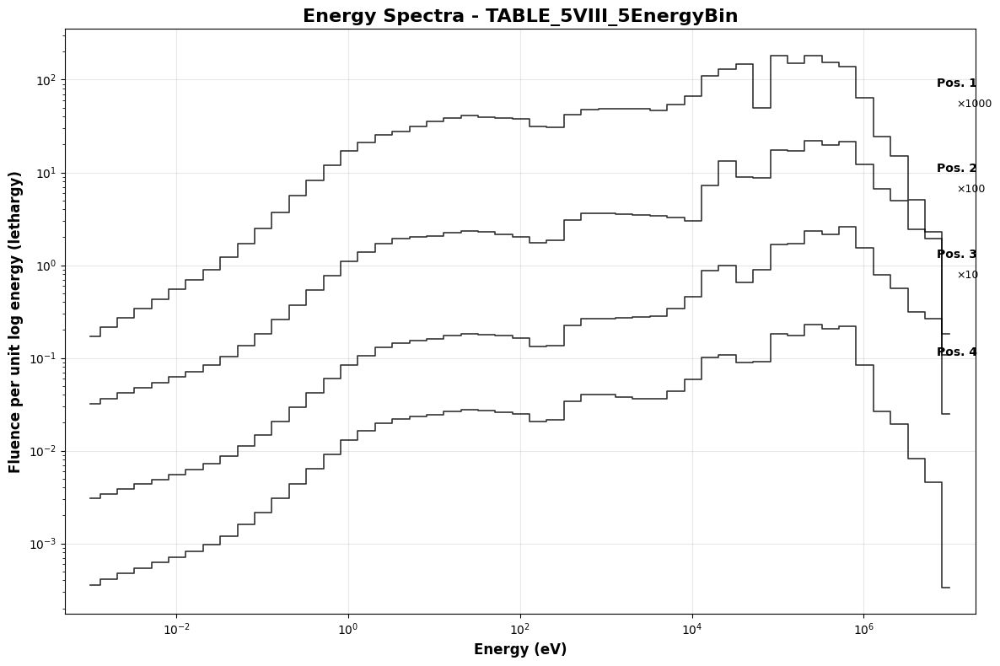


📊 Processing individual plot: TABLE_5XIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XIII_5EnergyBin_SPECTRUM_PLOT.png


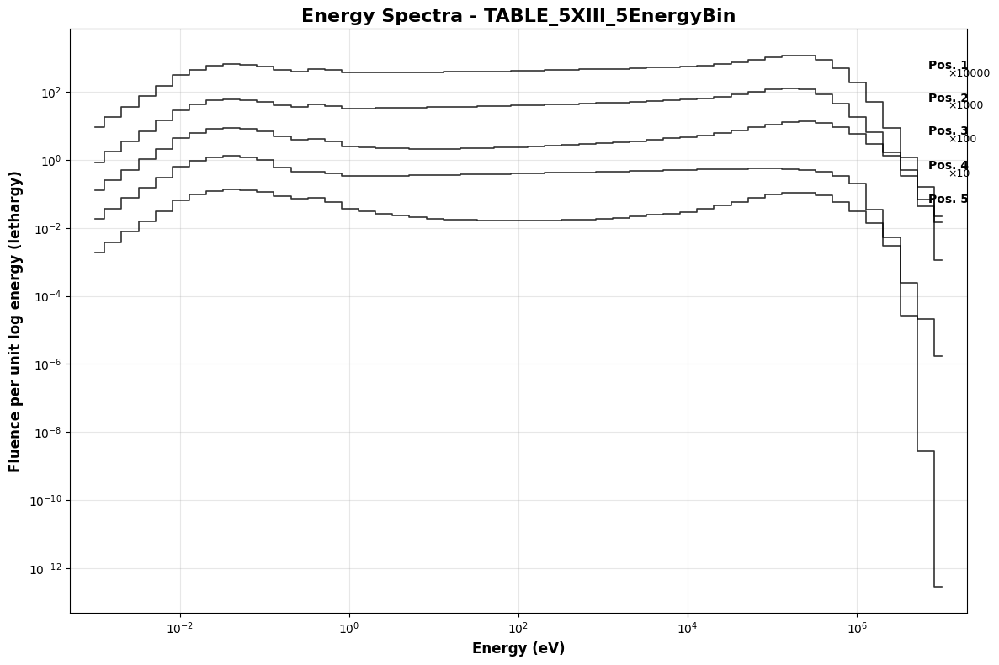


📊 Processing individual plot: TABLE_5XII_5EnergyBin.csv
✅ Saved plot: TABLE_5XII_5EnergyBin_SPECTRUM_PLOT.png


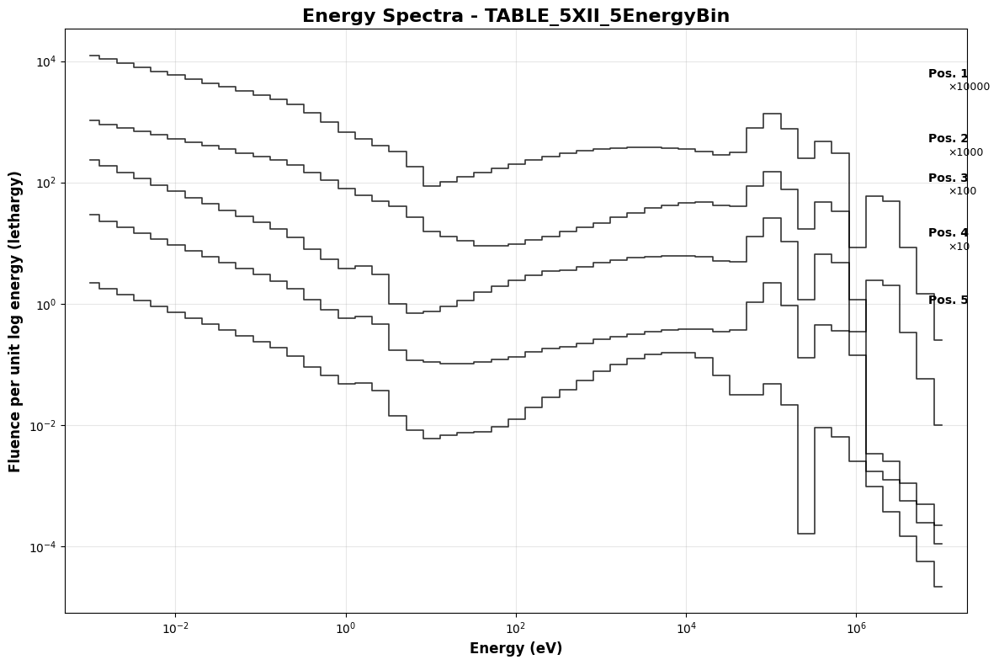


📊 Processing individual plot: TABLE_5XIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XIV_5EnergyBin_SPECTRUM_PLOT.png


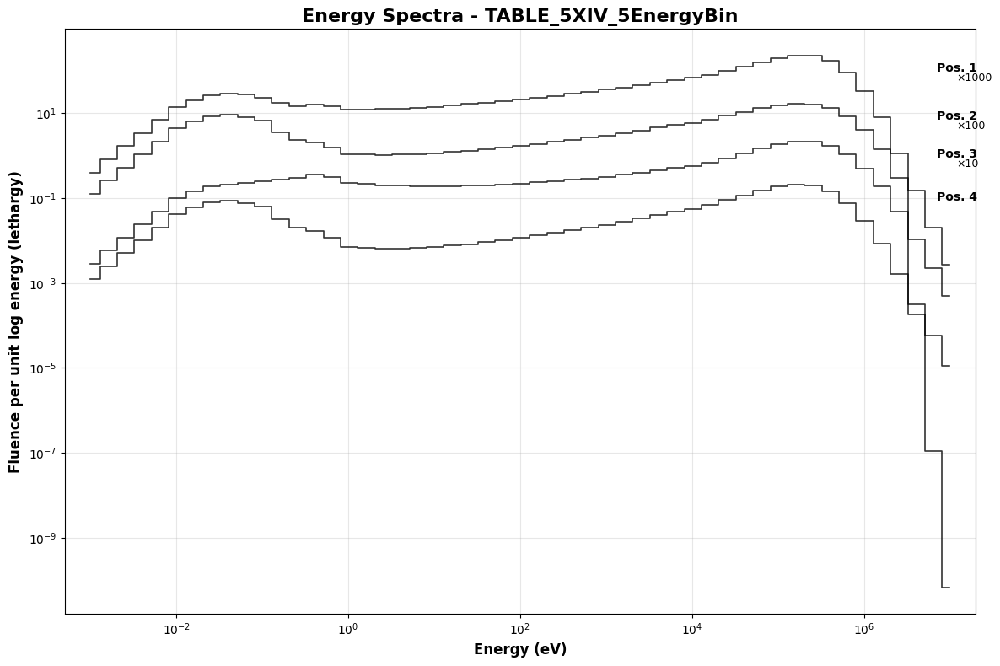


📊 Processing individual plot: TABLE_5XIX_5EnergyBin.csv
✅ Saved plot: TABLE_5XIX_5EnergyBin_SPECTRUM_PLOT.png


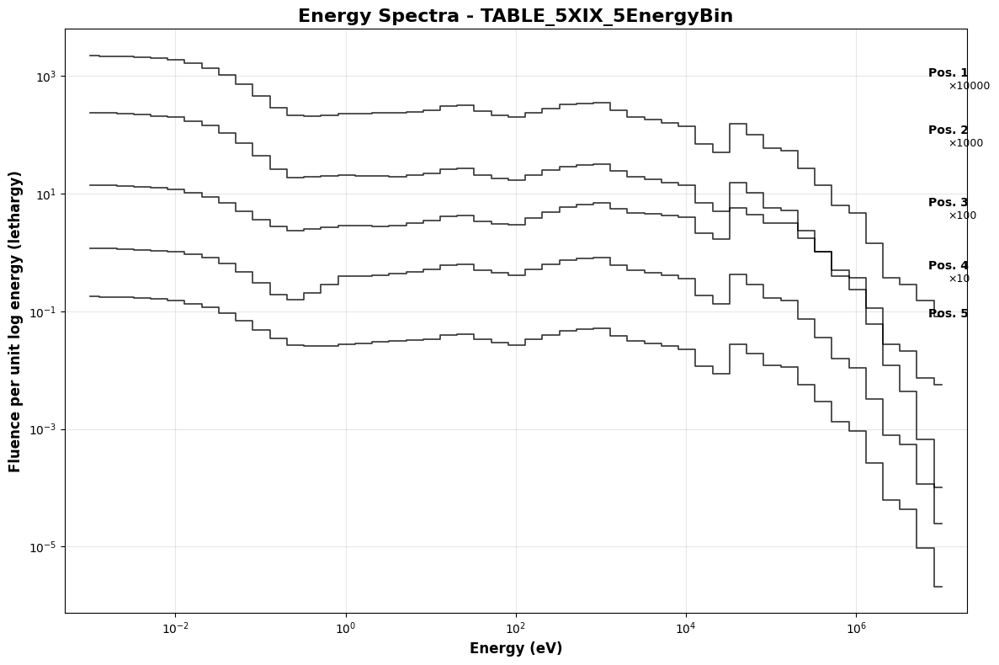


📊 Processing individual plot: TABLE_5XI_5EnergyBin.csv
✅ Saved plot: TABLE_5XI_5EnergyBin_SPECTRUM_PLOT.png


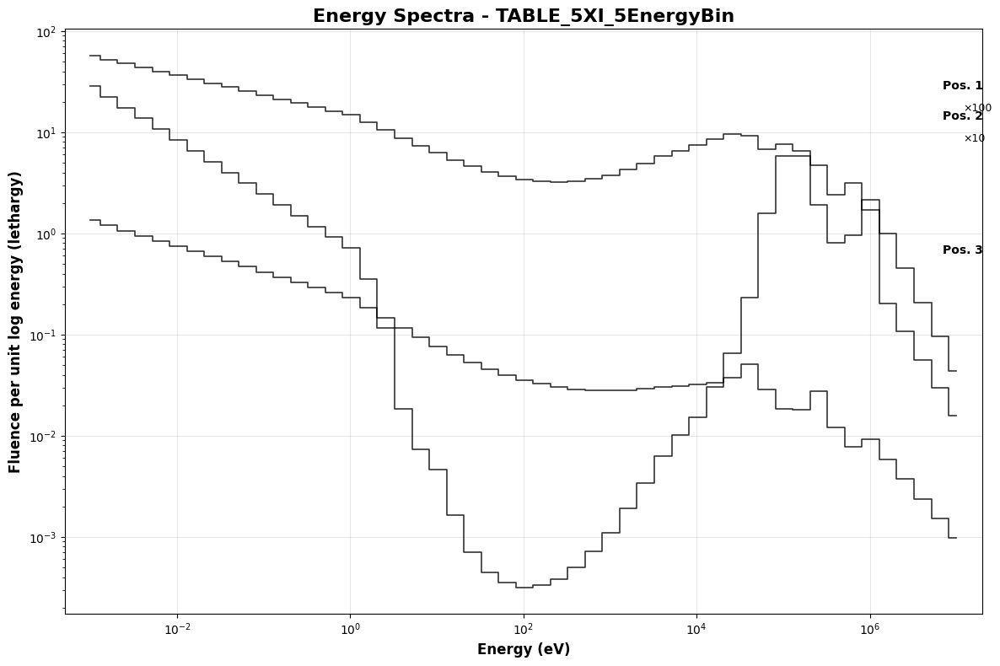


📊 Processing individual plot: TABLE_5XLIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XLIII_5EnergyBin_SPECTRUM_PLOT.png


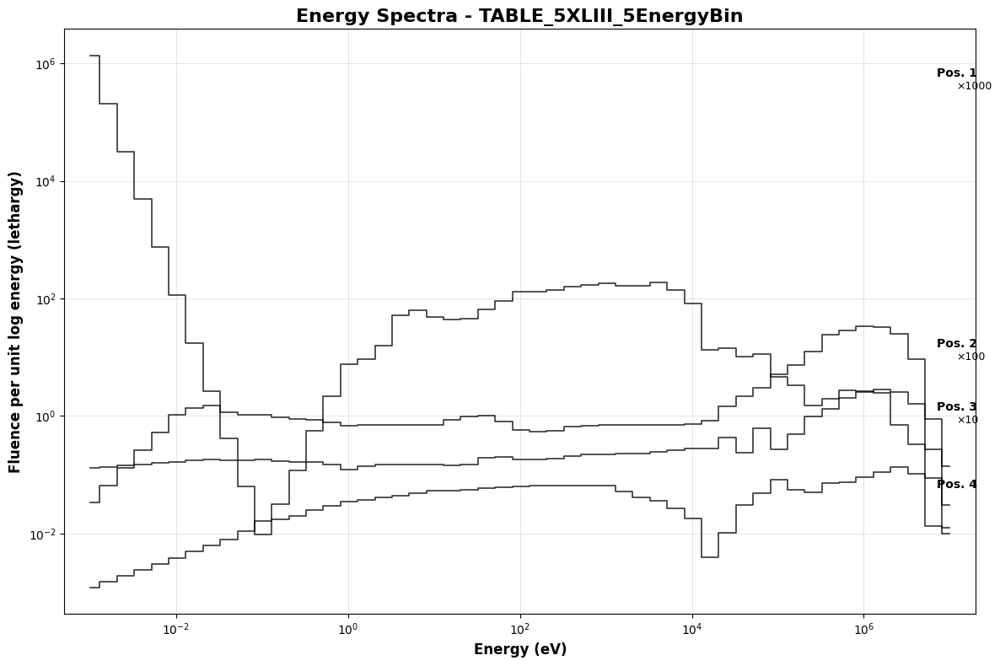


📊 Processing individual plot: TABLE_5XLII_5EnergyBin.csv
✅ Saved plot: TABLE_5XLII_5EnergyBin_SPECTRUM_PLOT.png


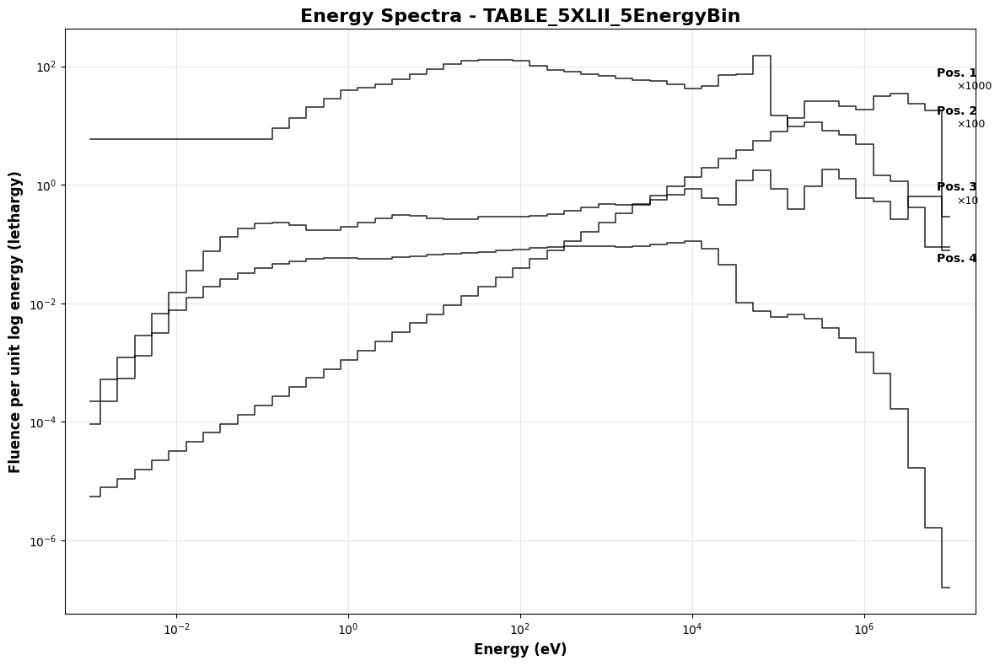


📊 Processing individual plot: TABLE_5XLIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XLIV_5EnergyBin_SPECTRUM_PLOT.png


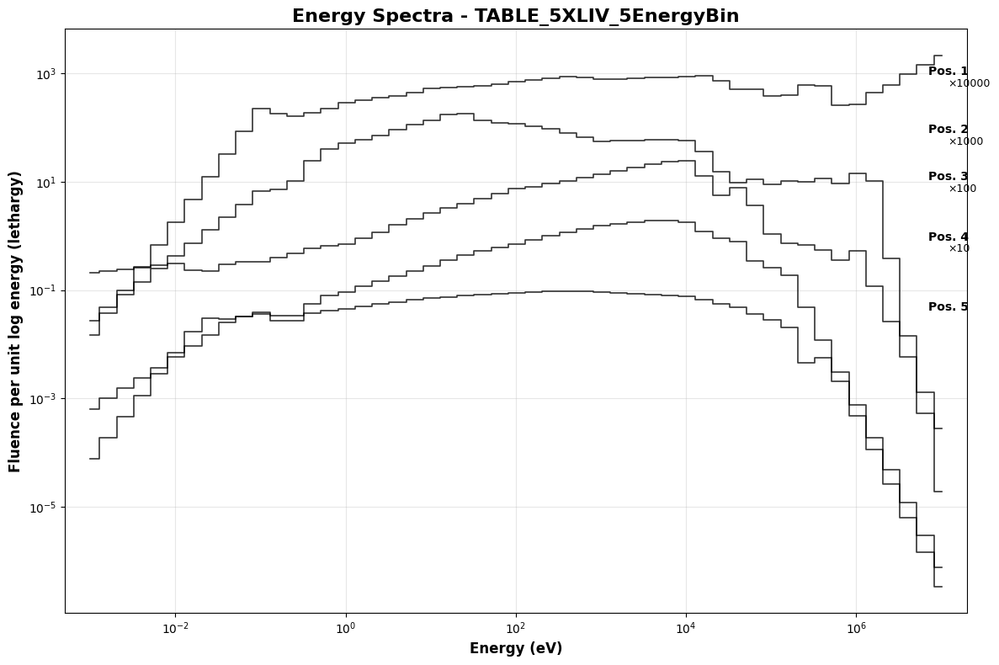


📊 Processing individual plot: TABLE_5XLI_5EnergyBin.csv
✅ Saved plot: TABLE_5XLI_5EnergyBin_SPECTRUM_PLOT.png


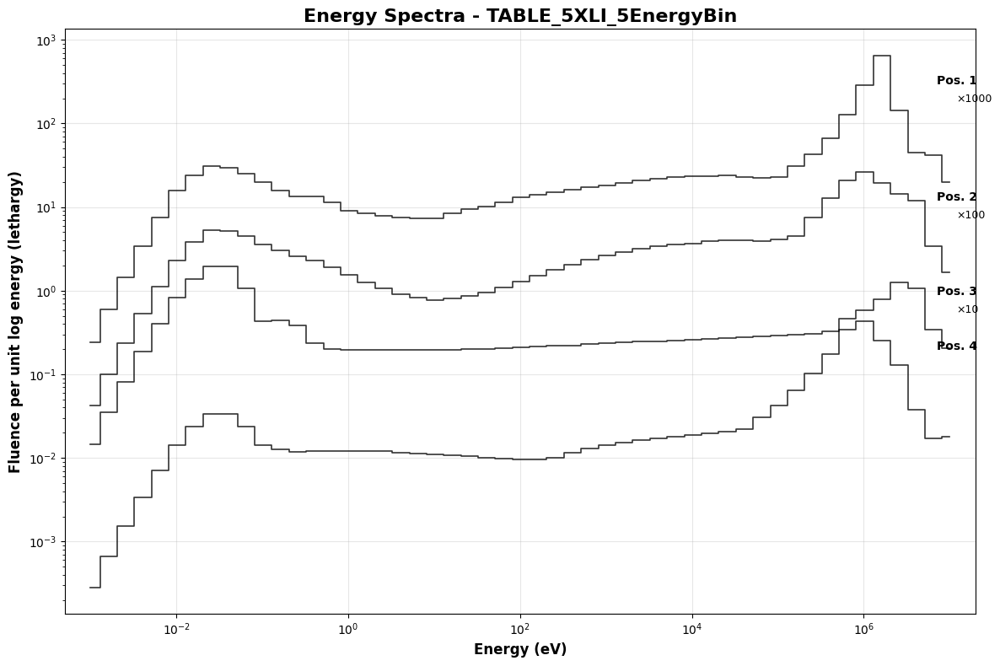


📊 Processing individual plot: TABLE_5XVIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XVIII_5EnergyBin_SPECTRUM_PLOT.png


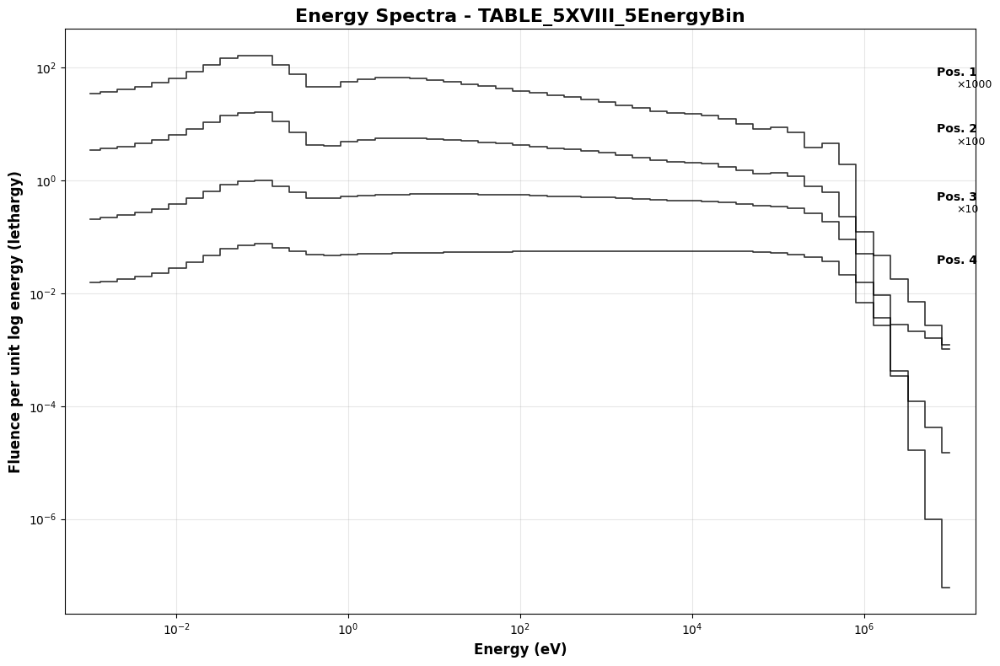


📊 Processing individual plot: TABLE_5XVII_5EnergyBin.csv
✅ Saved plot: TABLE_5XVII_5EnergyBin_SPECTRUM_PLOT.png


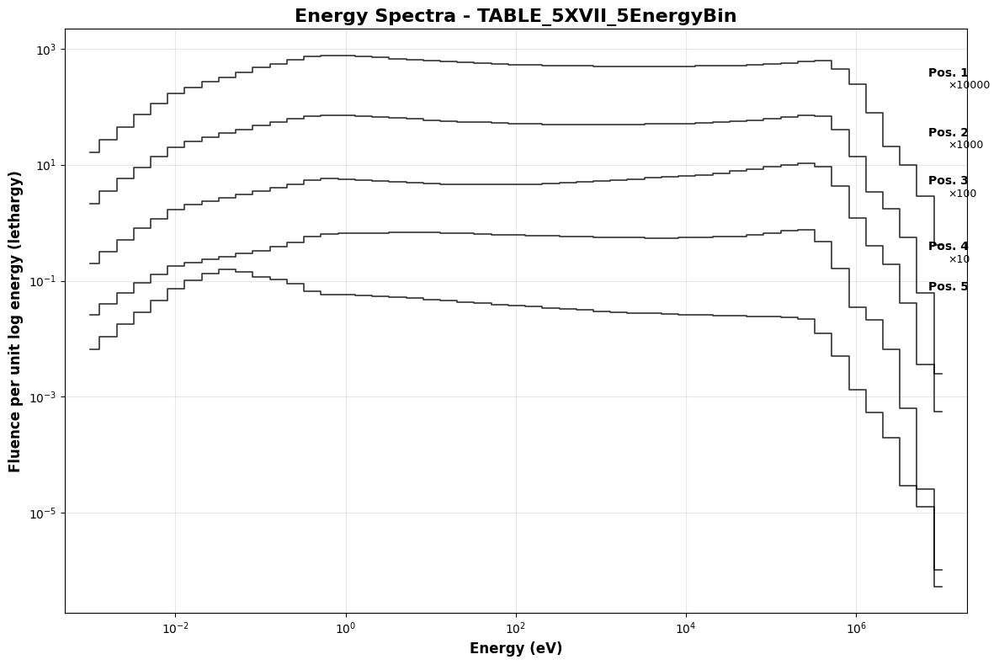


📊 Processing individual plot: TABLE_5XVI_5EnergyBin.csv
✅ Saved plot: TABLE_5XVI_5EnergyBin_SPECTRUM_PLOT.png


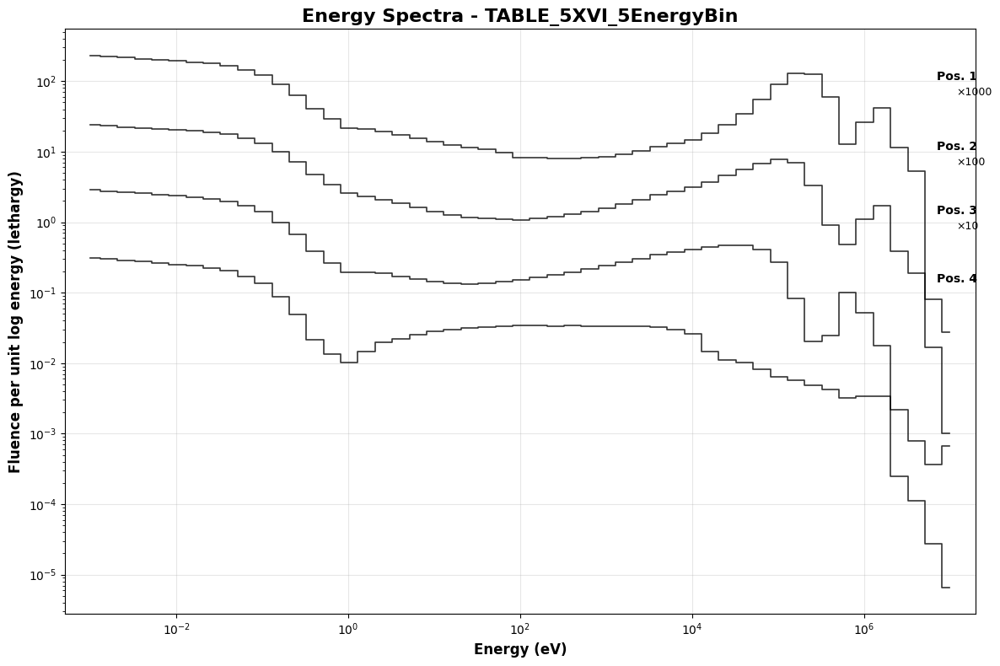


📊 Processing individual plot: TABLE_5XV_5EnergyBin.csv
✅ Saved plot: TABLE_5XV_5EnergyBin_SPECTRUM_PLOT.png


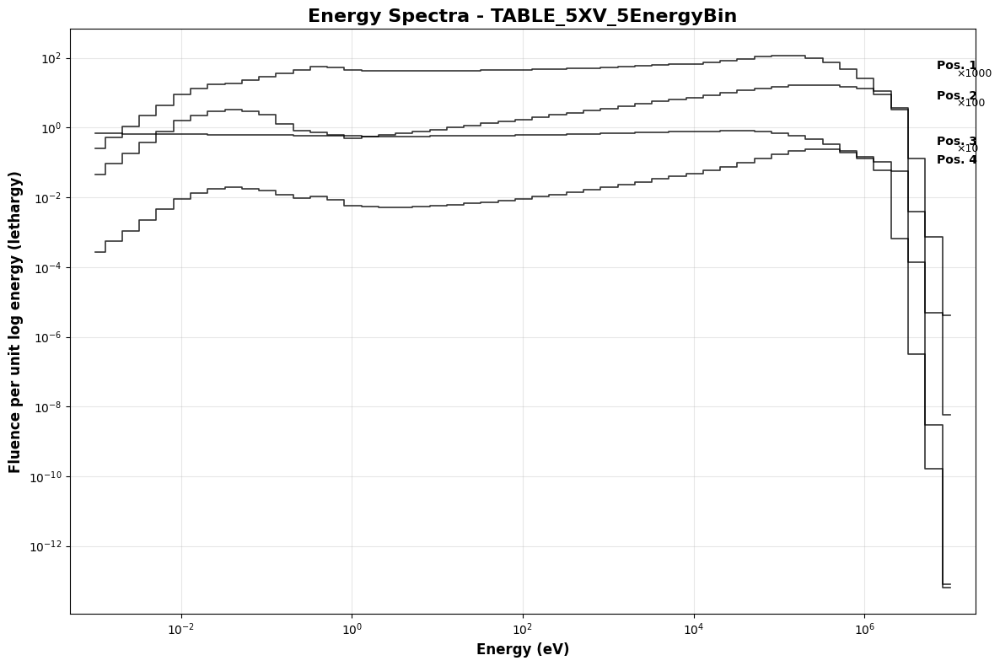


📊 Processing individual plot: TABLE_5XXIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXIII_5EnergyBin_SPECTRUM_PLOT.png


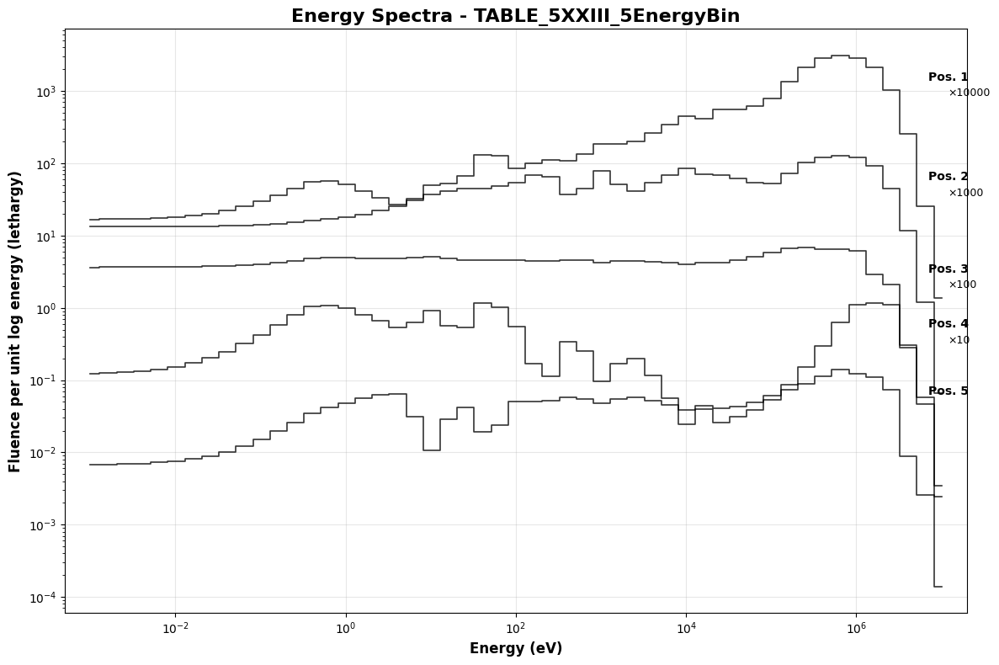


📊 Processing individual plot: TABLE_5XXII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXII_5EnergyBin_SPECTRUM_PLOT.png


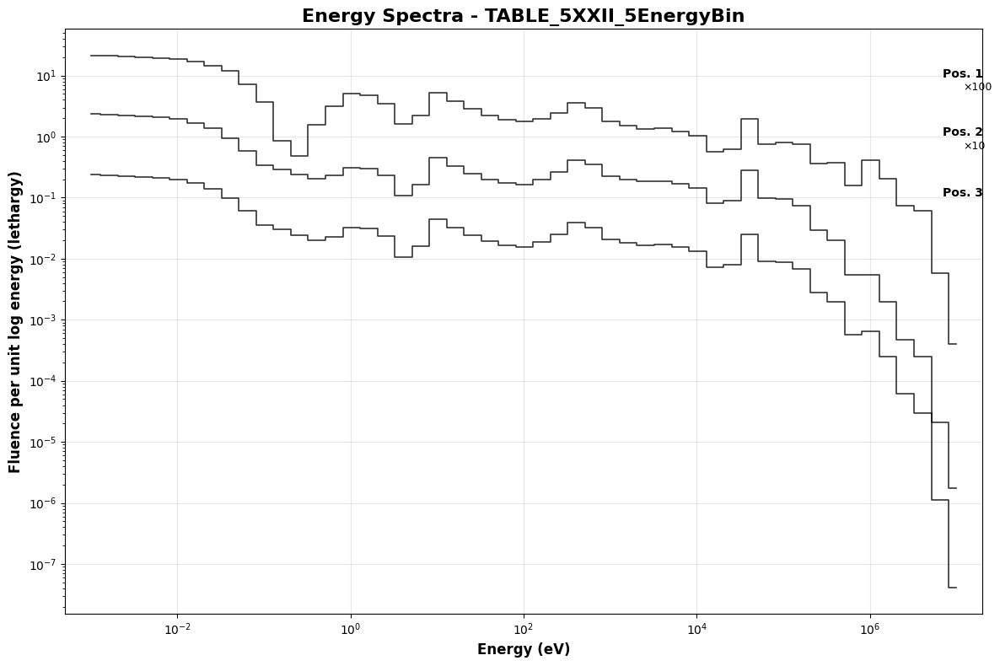


📊 Processing individual plot: TABLE_5XXIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXIV_5EnergyBin_SPECTRUM_PLOT.png


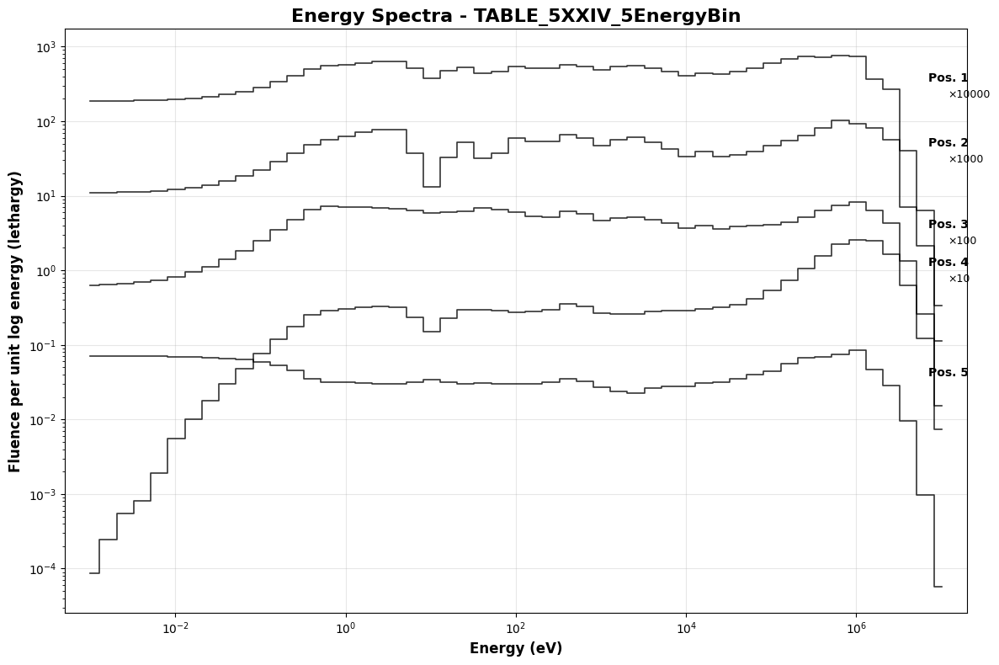


📊 Processing individual plot: TABLE_5XXIX_5EnergyBin.csv
✅ Saved plot: TABLE_5XXIX_5EnergyBin_SPECTRUM_PLOT.png


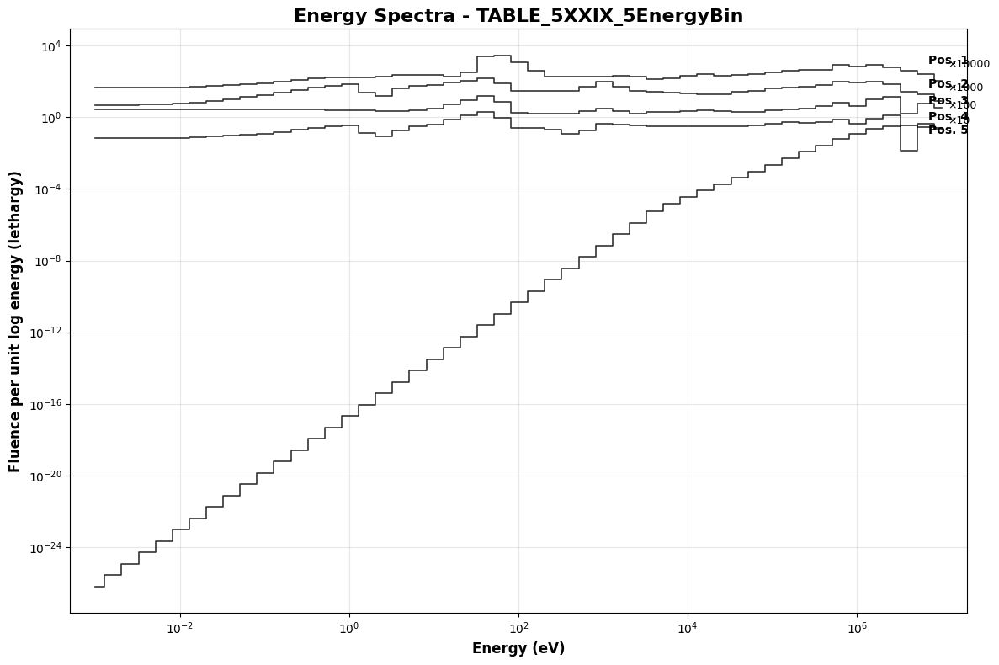


📊 Processing individual plot: TABLE_5XXI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXI_5EnergyBin_SPECTRUM_PLOT.png


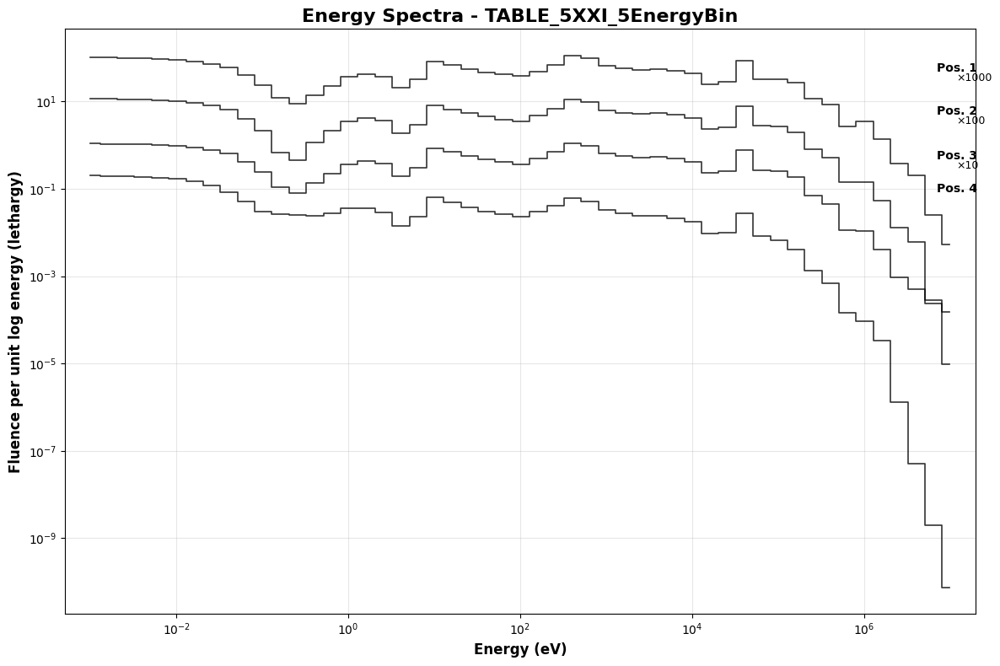


📊 Processing individual plot: TABLE_5XXVIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXVIII_5EnergyBin_SPECTRUM_PLOT.png


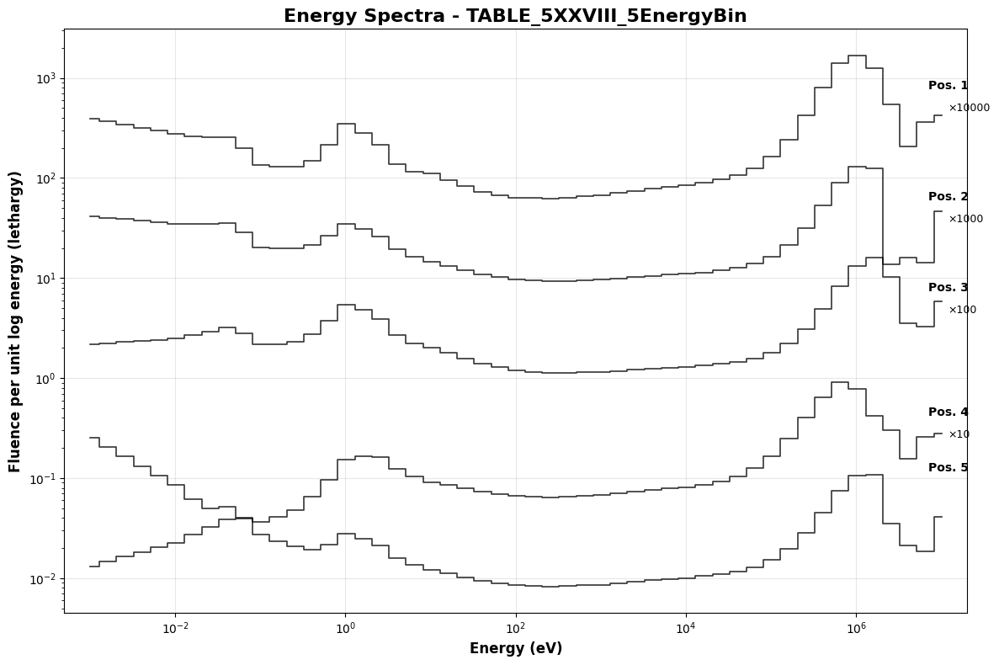


📊 Processing individual plot: TABLE_5XXVII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXVII_5EnergyBin_SPECTRUM_PLOT.png


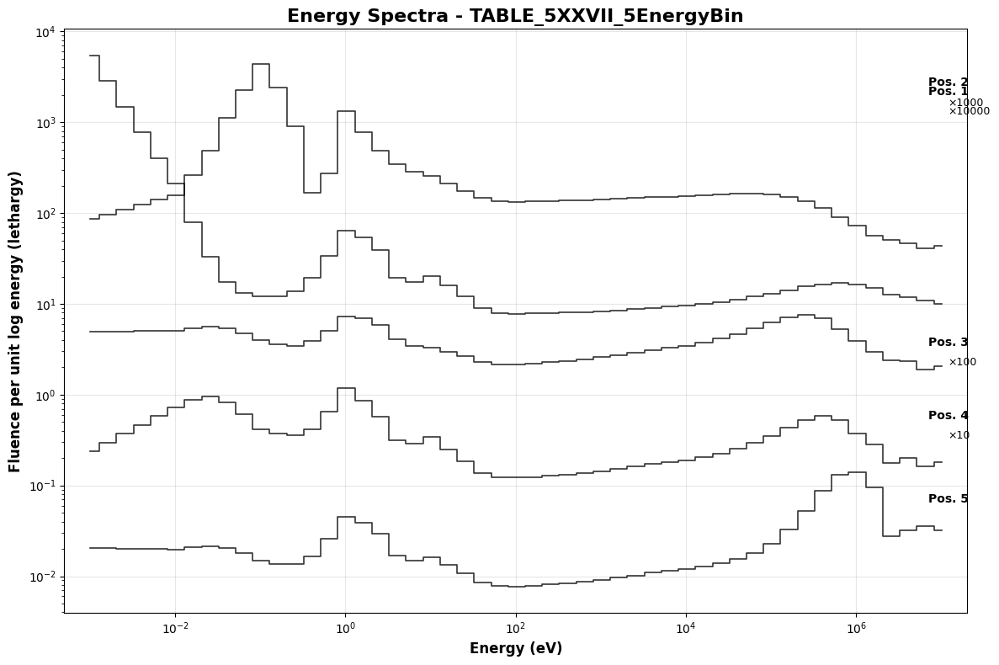


📊 Processing individual plot: TABLE_5XXVI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXVI_5EnergyBin_SPECTRUM_PLOT.png


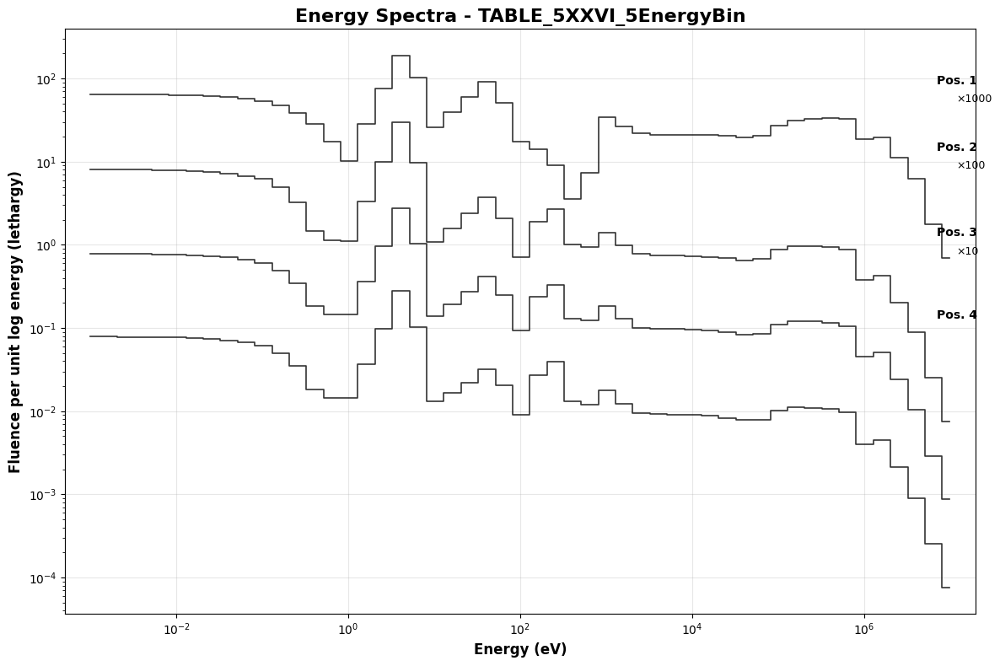


📊 Processing individual plot: TABLE_5XXV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXV_5EnergyBin_SPECTRUM_PLOT.png


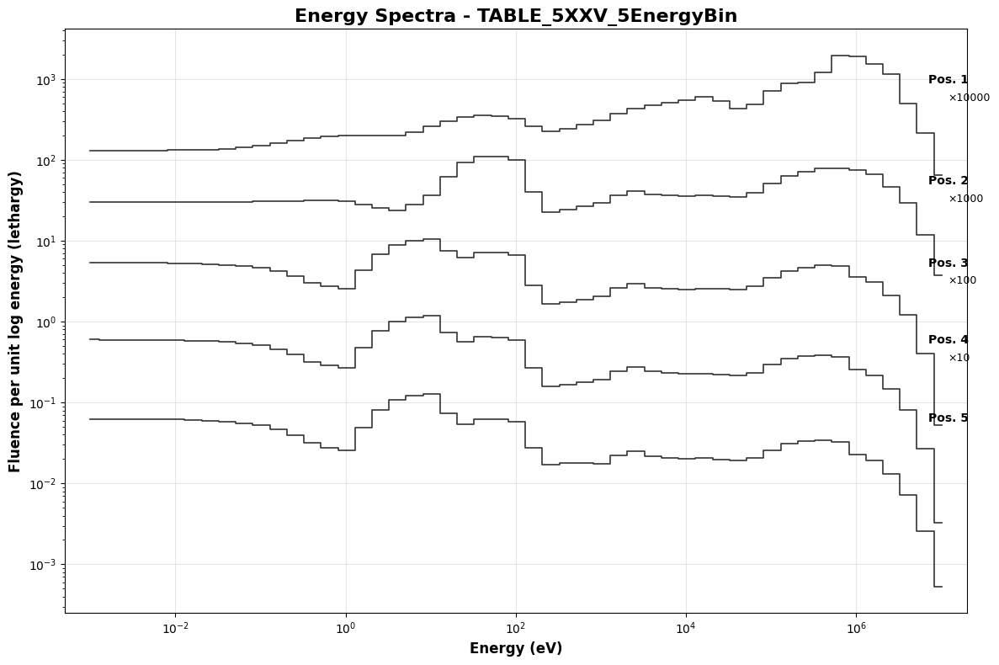


📊 Processing individual plot: TABLE_5XXXIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXIII_5EnergyBin_SPECTRUM_PLOT.png


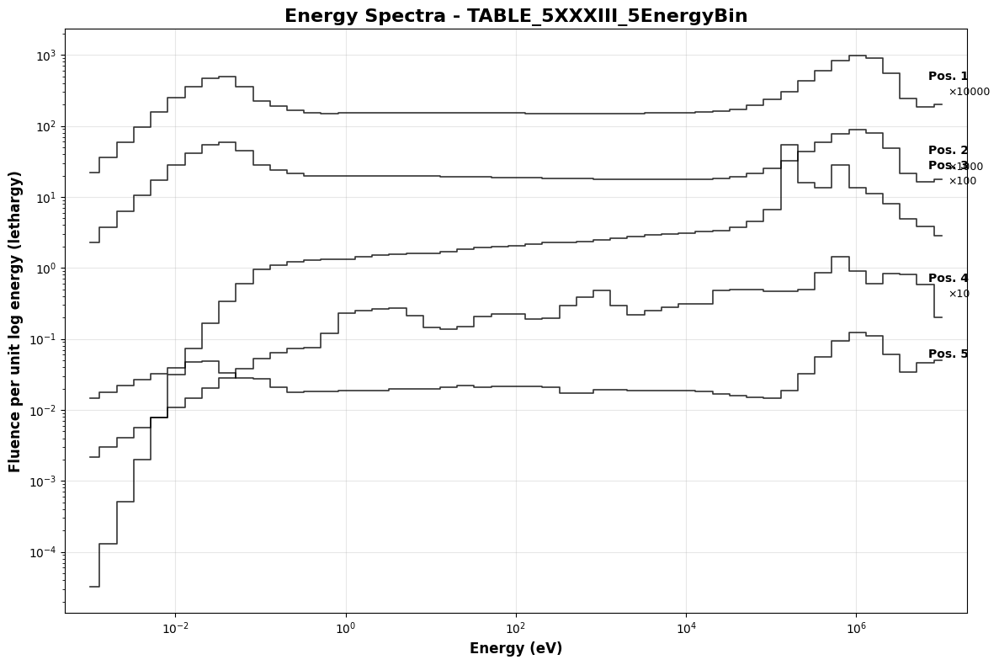


📊 Processing individual plot: TABLE_5XXXII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXII_5EnergyBin_SPECTRUM_PLOT.png


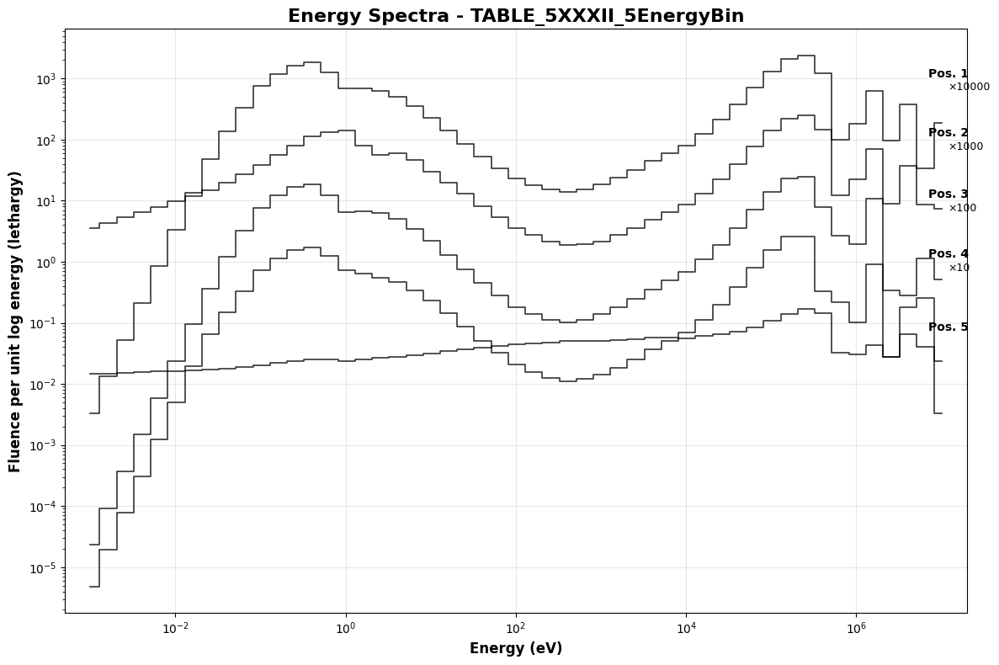


📊 Processing individual plot: TABLE_5XXXIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXIV_5EnergyBin_SPECTRUM_PLOT.png


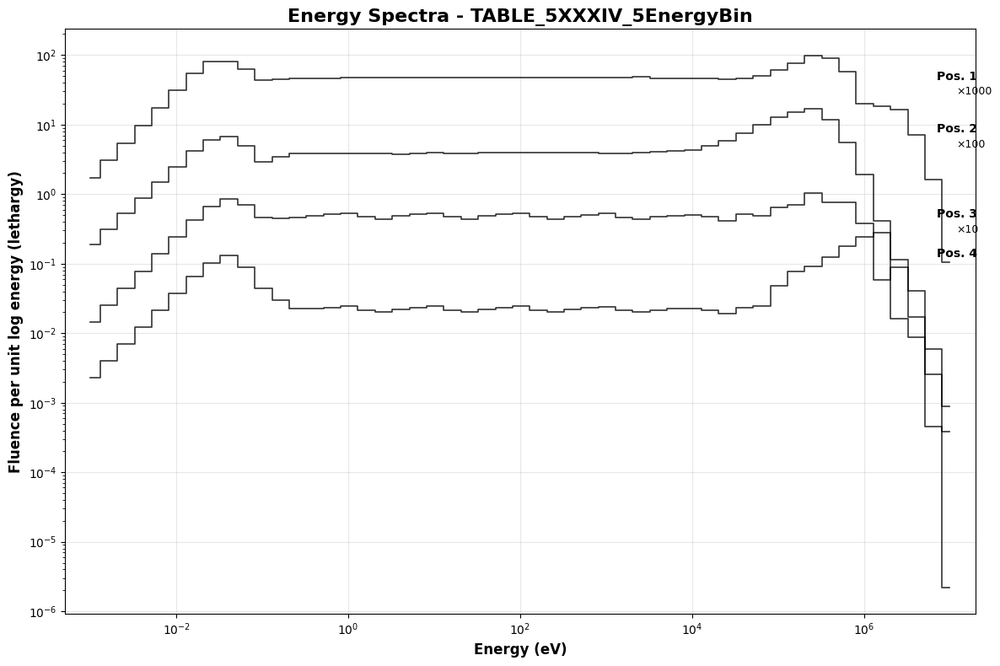


📊 Processing individual plot: TABLE_5XXXIX_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXIX_5EnergyBin_SPECTRUM_PLOT.png


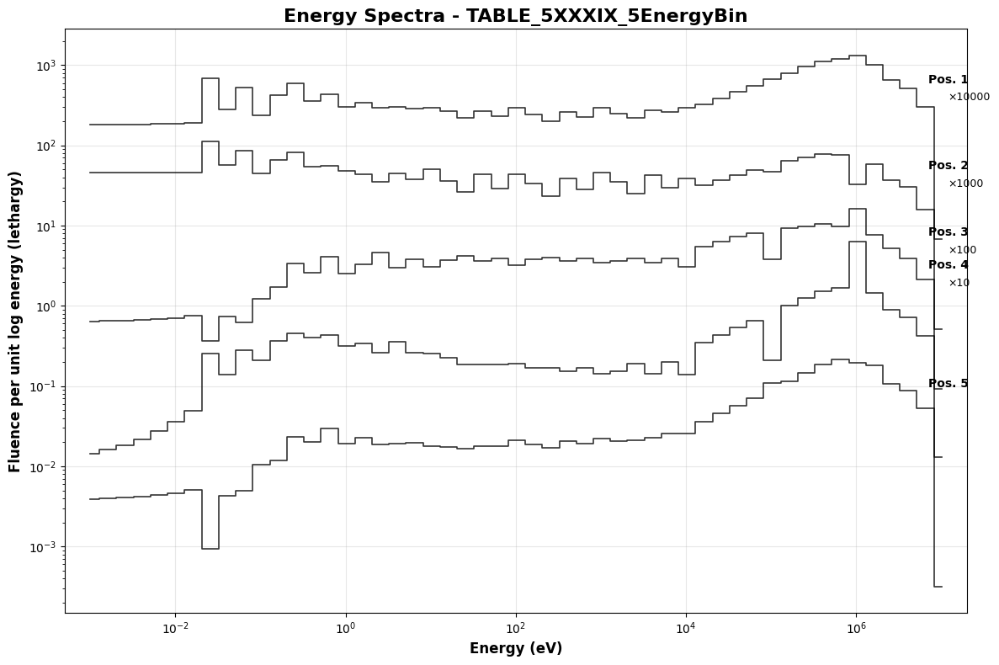


📊 Processing individual plot: TABLE_5XXXI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXI_5EnergyBin_SPECTRUM_PLOT.png


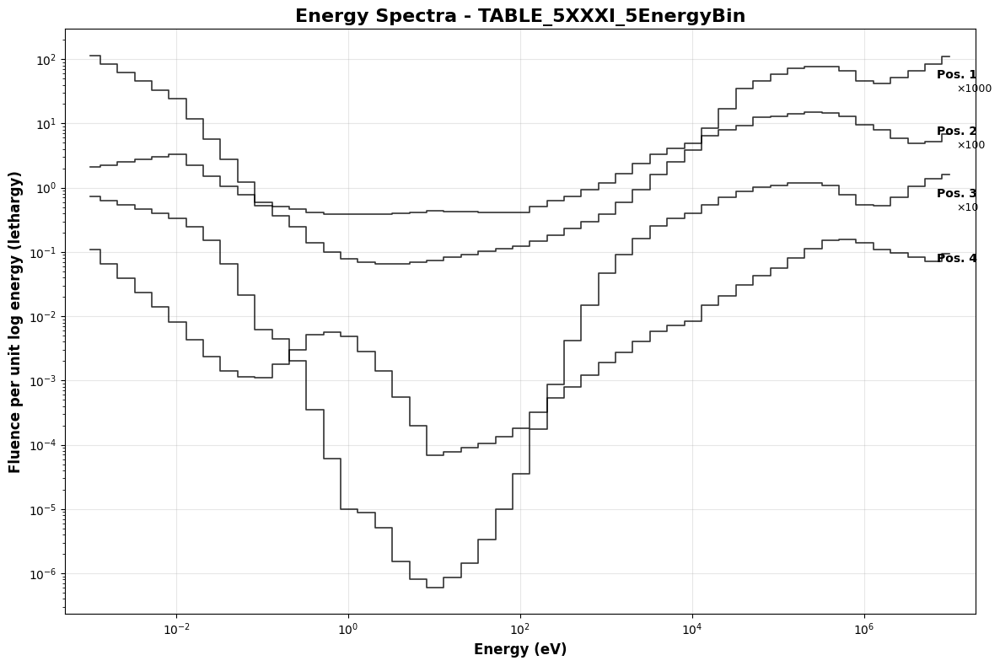


📊 Processing individual plot: TABLE_5XXXVIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXVIII_5EnergyBin_SPECTRUM_PLOT.png


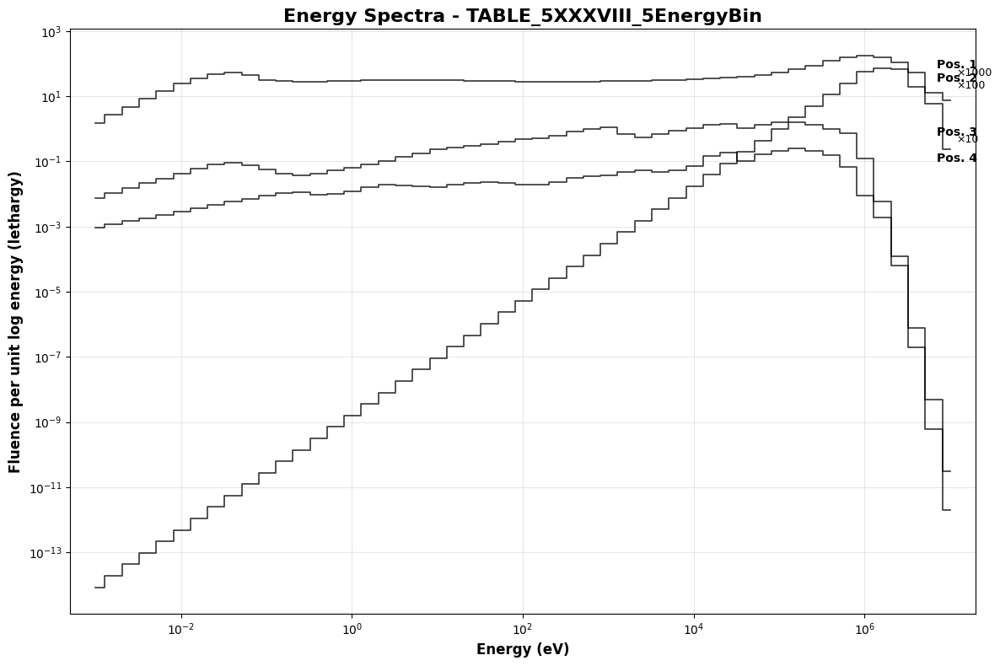


📊 Processing individual plot: TABLE_5XXXVII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXVII_5EnergyBin_SPECTRUM_PLOT.png


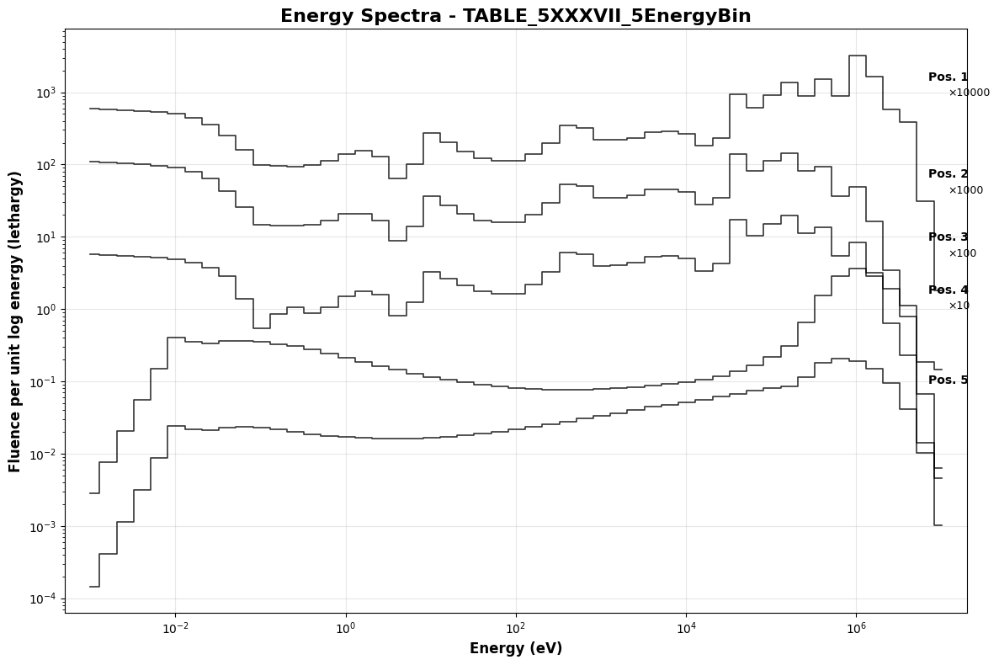


📊 Processing individual plot: TABLE_5XXXVI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXVI_5EnergyBin_SPECTRUM_PLOT.png


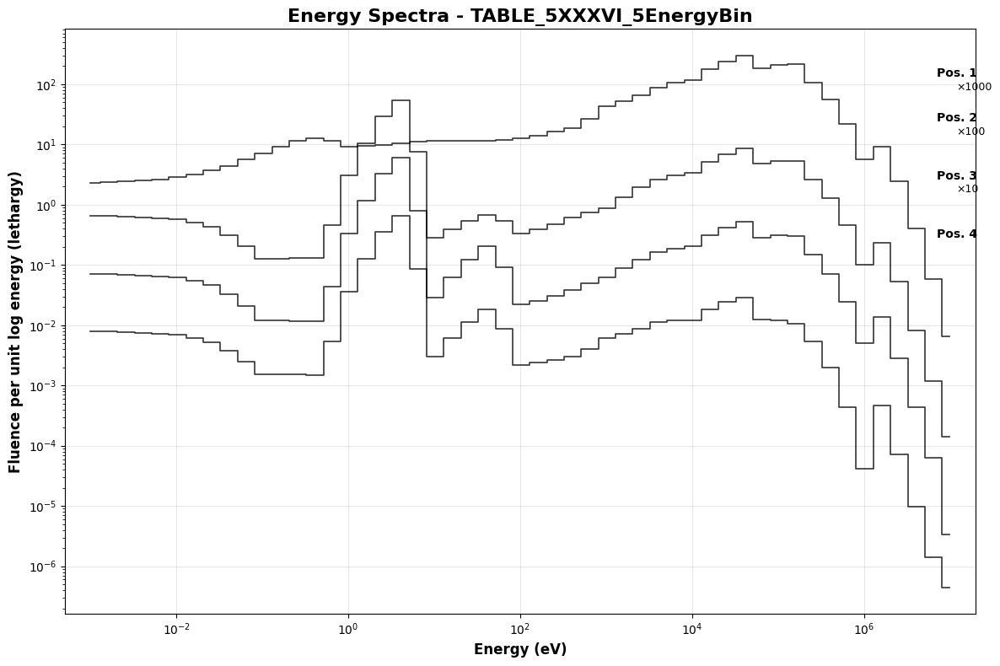


📊 Processing individual plot: TABLE_5XXXV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXV_5EnergyBin_SPECTRUM_PLOT.png


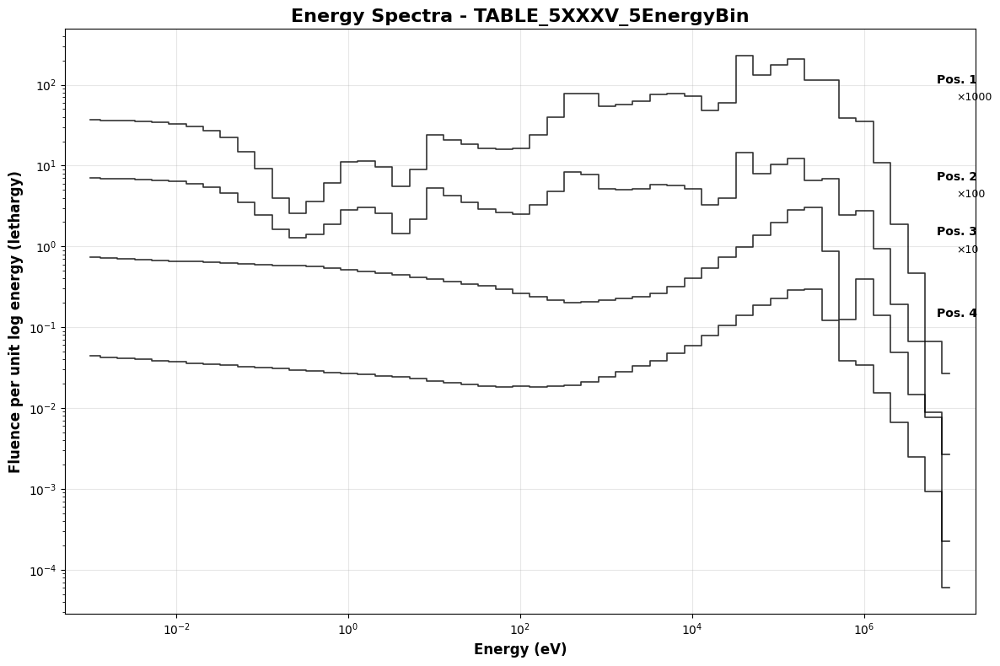


📊 Processing individual plot: TABLE_5XXX_5EnergyBin.csv
✅ Saved plot: TABLE_5XXX_5EnergyBin_SPECTRUM_PLOT.png


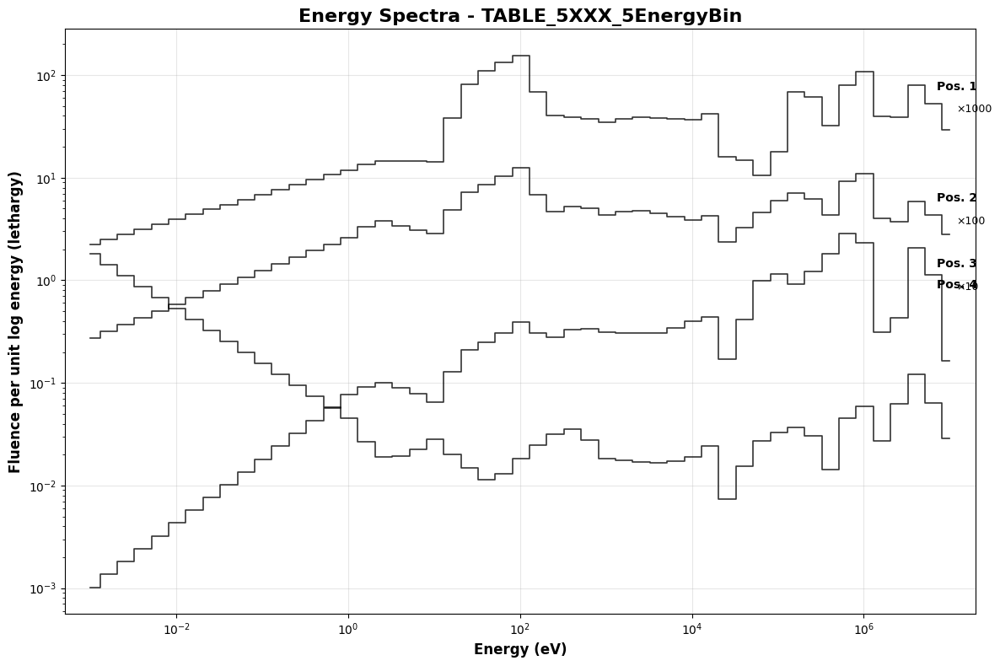


📊 Processing individual plot: TABLE_5XX_5EnergyBin.csv
✅ Saved plot: TABLE_5XX_5EnergyBin_SPECTRUM_PLOT.png


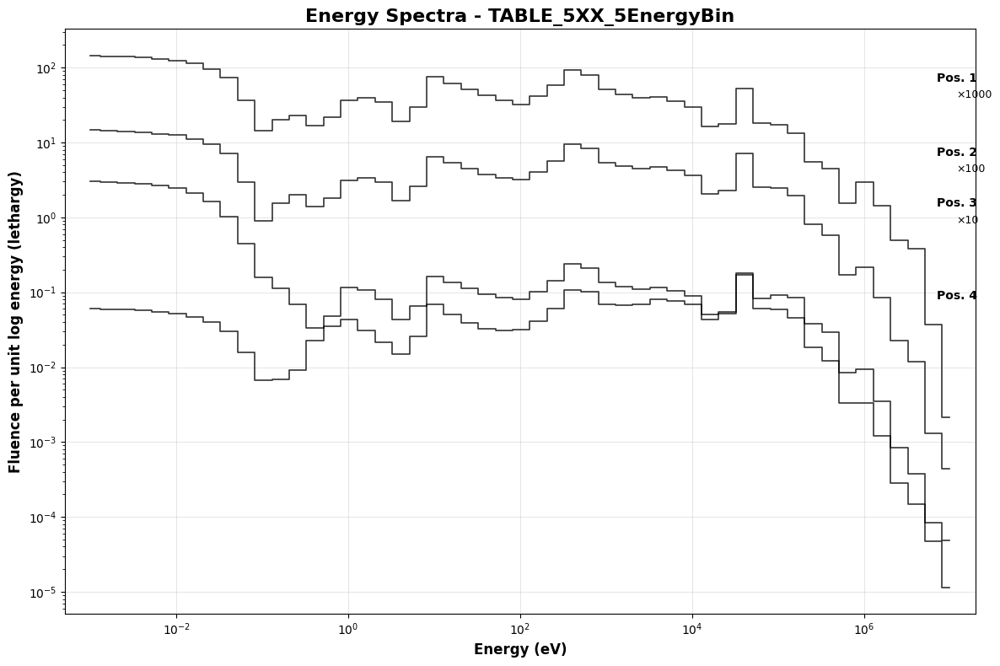


📊 Processing individual plot: TABLE_5X_5EnergyBin.csv
✅ Saved plot: TABLE_5X_5EnergyBin_SPECTRUM_PLOT.png


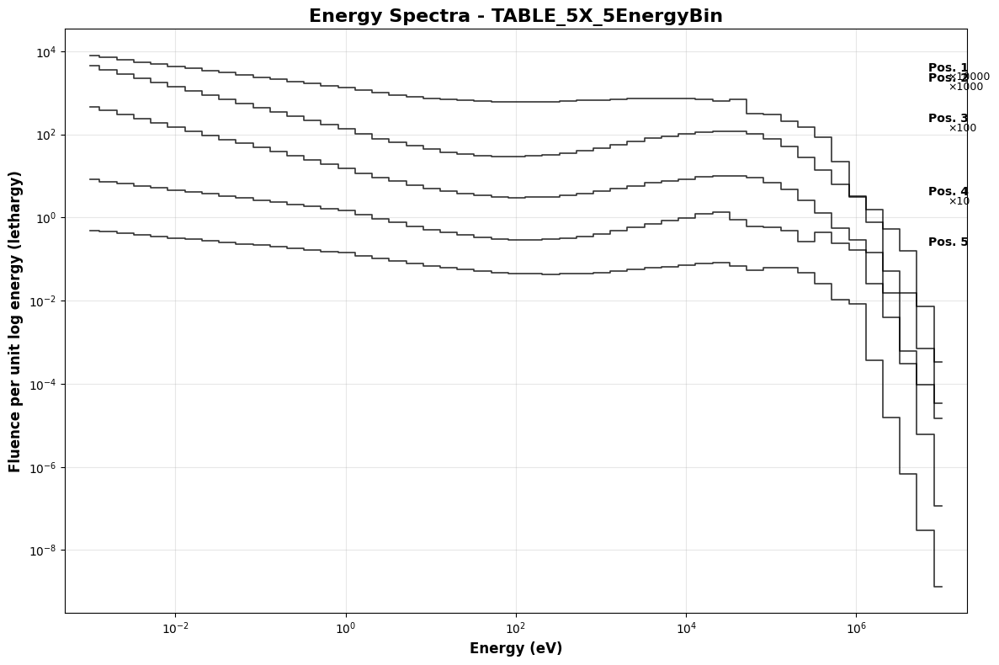


📊 Creating combined ladder plot...
✅ Saved combined ladder plot: CH5_COMBINED_LADDER_PLOT.png


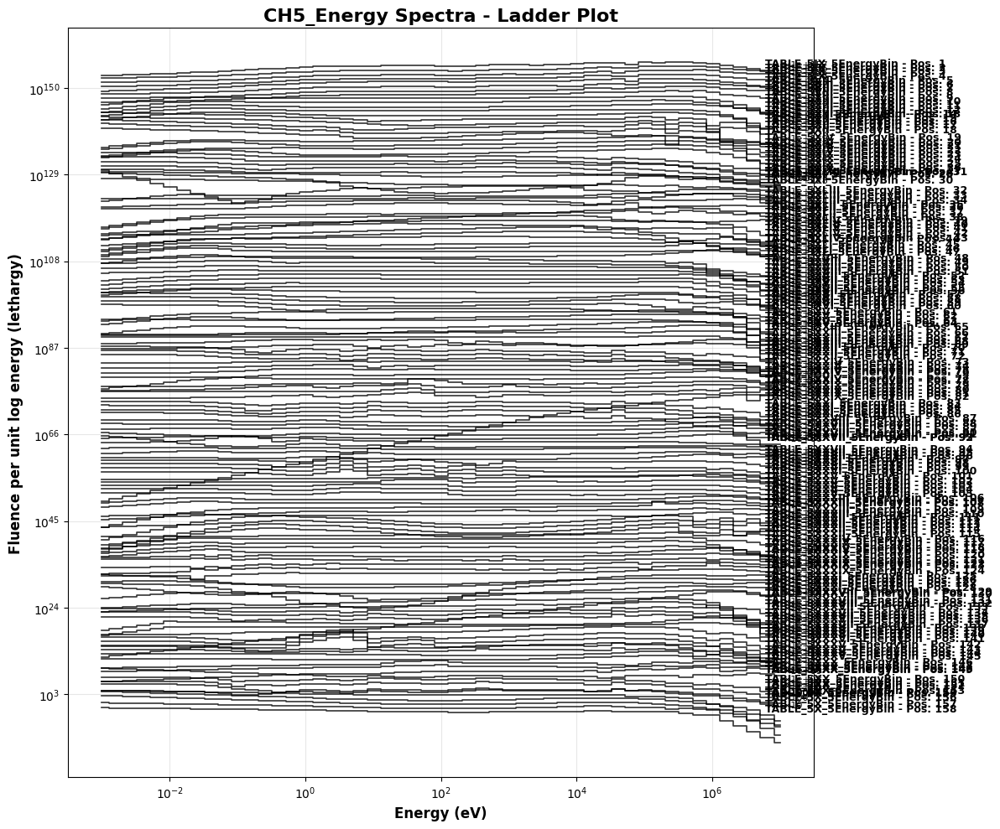


📈 PLOTTING SUMMARY:
   Individual plots: 36/36 files
   Combined ladder plot: 1 file
   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png

🎉 All plots completed!
📁 Check current directory for PNG plot files


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from pathlib import Path

def plot_spectra_from_csv(csv_file):
    """
    Plot spectral data from a single CSV file.
    X-axis: Energy_eV, Y-axis: All other columns
    """
    try:
        # Read the CSV file
        df = pd.read_csv(csv_file)

        # Check if the file has the expected structure
        if 'Energy_eV' not in df.columns:
            print(f"⚠️  Warning: No 'Energy_eV' column found in {csv_file}")
            return

        # Get all columns except Energy_eV
        data_columns = [col for col in df.columns if col != 'Energy_eV']

        if not data_columns:
            print(f"⚠️  Warning: No data columns found in {csv_file}")
            return

        # Convert Energy_eV to numeric, handling scientific notation
        df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')

        # Remove rows with NaN energy values
        df = df.dropna(subset=['Energy_eV'])

        if df.empty:
            print(f"⚠️  Warning: No valid energy data in {csv_file}")
            return

        # Create the plot
        plt.figure(figsize=(12, 8))

        # Plot each data column against energy with ladder offset
        colors = ['black'] * len(data_columns)  # Use black for all curves like the reference

        # Calculate offset multipliers for ladder effect (decreasing from top to bottom)
        offset_multipliers = [10**(i) for i in range(len(data_columns))][::-1]  # Reverse for top-to-bottom

        for i, col in enumerate(data_columns):
            # Convert column data to numeric
            df[col] = pd.to_numeric(df[col], errors='coerce')

            # Remove rows where this column has NaN values
            valid_data = df.dropna(subset=[col])

            if not valid_data.empty:
                # Apply vertical offset for ladder effect
                offset_data = valid_data[col] * offset_multipliers[i]

                plt.loglog(valid_data['Energy_eV'], offset_data,
                          color=colors[i], linewidth=1.2, drawstyle='steps-mid',
                          alpha=0.8)

                # Add position label and multiplier annotation
                pos_label = f"Pos. {i+1}"
                multiplier_label = f"×{offset_multipliers[i]:g}" if offset_multipliers[i] != 1 else ""

                # Position the labels on the right side of the plot
                if not valid_data.empty:
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    # Position label
                    plt.text(max_energy * 0.7, max_flux * 0.5, pos_label,
                            fontsize=10, fontweight='bold', ha='left', va='center')

                    # Multiplier label (if not 1)
                    if multiplier_label:
                        plt.text(max_energy * 1.2, max_flux * 0.3, multiplier_label,
                                fontsize=9, ha='left', va='center')

        # Customize the plot
        table_name = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')
        plt.title(f'Energy Spectra - {table_name}', fontsize=16, fontweight='bold')
        plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
        plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')

        plt.grid(True, alpha=0.3)
        # Remove legend since we're using position labels instead

        # Set axis limits if needed
        if not df['Energy_eV'].empty:
            plt.xlim(df['Energy_eV'].min() * 0.5, df['Energy_eV'].max() * 2)

        plt.tight_layout()

        # Save the plot
        plot_filename = f"{table_name}_SPECTRUM_PLOT.png"
        plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
        print(f"✅ Saved plot: {plot_filename}")

        # Show the plot
        plt.show()

        return True

    except Exception as e:
        print(f"❌ Error plotting {csv_file}: {e}")
        return False


def create_ladder_plot_multiple_files(csv_files, title_prefix=""):
    """
    Create a single ladder plot combining multiple CSV files.
    Each file's data will be offset vertically.
    """
    if not csv_files:
        print("❌ No CSV files provided")
        return

    plt.figure(figsize=(12, 10))

    all_multipliers = []
    position_counter = 1

    # Calculate total number of curves across all files
    total_curves = 0
    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)
            data_columns = [col for col in df.columns if col != 'Energy_eV']
            total_curves += len(data_columns)
        except:
            continue

    # Generate offset multipliers for all curves
    base_multipliers = [10**(i) for i in range(total_curves)][::-1]
    multiplier_idx = 0

    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)

            if 'Energy_eV' not in df.columns:
                continue

            data_columns = [col for col in df.columns if col != 'Energy_eV']
            df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')
            df = df.dropna(subset=['Energy_eV'])

            if df.empty:
                continue

            file_label = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')

            for col in data_columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                valid_data = df.dropna(subset=[col])

                if not valid_data.empty:
                    # Apply vertical offset
                    multiplier = base_multipliers[multiplier_idx]
                    offset_data = valid_data[col] * multiplier

                    plt.loglog(valid_data['Energy_eV'], offset_data,
                              color='black', linewidth=1.2, drawstyle='steps-mid',
                              alpha=0.8)

                    # Add labels
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    pos_label = f"{file_label} - Pos. {position_counter}"
                    multiplier_label = f"×{multiplier:g}" if multiplier != 1 else ""

                    plt.text(max_energy * 0.6, max_flux * 0.5, pos_label,
                            fontsize=9, fontweight='bold', ha='left', va='center')

                    if multiplier_label:
                        plt.text(max_energy * 1.1, max_flux * 0.3, multiplier_label,
                                fontsize=8, ha='left', va='center')

                    position_counter += 1
                    multiplier_idx += 1

        except Exception as e:
            print(f"⚠️  Error processing {csv_file}: {e}")
            continue

    plt.title(f'{title_prefix}Energy Spectra - Ladder Plot', fontsize=16, fontweight='bold')
    plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
    plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    plot_filename = f"{title_prefix}COMBINED_LADDER_PLOT.png"
    plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
    print(f"✅ Saved combined ladder plot: {plot_filename}")
    plt.show()


def plot_all_spectra_files(file_pattern="*EnergyBin*.csv"):
    """
    Find and plot all CSV files - both individual and combined ladder plots.
    """
    csv_files = glob.glob(file_pattern)

    if not csv_files:
        print(f"❌ No CSV files found matching pattern: {file_pattern}")
        print("📂 Current directory contents:")
        for file in os.listdir('.'):
            if file.endswith('.csv'):
                print(f"   📄 {file}")
        return

    print(f"🎯 Found {len(csv_files)} spectral CSV files to plot:")
    for file in sorted(csv_files):
        print(f"   📄 {file}")

    print("\n🚀 Starting plotting process...")
    print("=" * 50)

    # Individual plots with ladder style
    successful_plots = 0
    for csv_file in sorted(csv_files):
        print(f"\n📊 Processing individual plot: {csv_file}")
        if plot_spectra_from_csv(csv_file):
            successful_plots += 1

    # Combined ladder plot
    print(f"\n📊 Creating combined ladder plot...")
    create_ladder_plot_multiple_files(sorted(csv_files), "CH5_")

    print(f"\n📈 PLOTTING SUMMARY:")
    print(f"   Individual plots: {successful_plots}/{len(csv_files)} files")
    print(f"   Combined ladder plot: 1 file")
    print(f"   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png")


def plot_specific_table(table_name):
    """
    Plot a specific table by name (e.g., "TABLE_5I")
    """
    # Look for files matching the table name
    patterns = [
        f"{table_name}*.csv",
        f"*{table_name}*.csv"
    ]

    csv_files = []
    for pattern in patterns:
        csv_files.extend(glob.glob(pattern))

    if not csv_files:
        print(f"❌ No CSV files found for table: {table_name}")
        return

    for csv_file in csv_files:
        print(f"📊 Plotting: {csv_file}")
        plot_spectra_from_csv(csv_file)


def create_summary_info():
    """
    Create a summary of all available spectral data files
    """
    csv_files = glob.glob("*SPECTRA*.csv")

    if not csv_files:
        print("❌ No spectral CSV files found")
        return

    print("📋 SPECTRAL DATA SUMMARY:")
    print("=" * 60)

    for csv_file in sorted(csv_files):
        try:
            df = pd.read_csv(csv_file)
            table_name = Path(csv_file).stem

            if 'Energy_eV' in df.columns:
                data_cols = [col for col in df.columns if col != 'Energy_eV']
                energy_range = f"{df['Energy_eV'].min():.1E} - {df['Energy_eV'].max():.1E} eV"

                print(f"📄 {table_name}:")
                print(f"   📊 Data columns: {len(data_cols)} ({', '.join(data_cols)})")
                print(f"   ⚡ Energy range: {energy_range}")
                print(f"   📈 Data points: {len(df)} rows")
                print()
        except Exception as e:
            print(f"⚠️  Error reading {csv_file}: {e}")


# Main execution options
if __name__ == "__main__":
    # Option 1: Plot all spectral files
    print("🎯 SPECTRAL DATA PLOTTING TOOL")
    print("=" * 40)

    # Show summary first
    create_summary_info()

    # Plot all files
    plot_all_spectra_files()

    # Example of plotting specific table:
    # plot_specific_table("TABLE_5I")

    print("\n🎉 All plots completed!")
    print("📁 Check current directory for PNG plot files")

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os
import zipfile

# --- Paths ---
original_zip = "/content/chapter5_tables.zip"
interp_zip   = "/content/chapter5_5EnergyBin.zip"
work_dir     = "/content"

original_folder = os.path.join(work_dir, "original_data")
interp_folder   = os.path.join(work_dir, "chapter5_5EnergyBin")

# --- Extract zips ---
with zipfile.ZipFile(original_zip, "r") as zip_ref:
    zip_ref.extractall(original_folder)

with zipfile.ZipFile(interp_zip, "r") as zip_ref:
    zip_ref.extractall(interp_folder)

print("✅ Both folders extracted")

# --- Comparison results ---
results = []

for interp_file in glob.glob(os.path.join(interp_folder, "*.csv")):
    filename = os.path.basename(interp_file)
    orig_file = os.path.join(original_folder, filename.replace("_5EnergyBin", "_SPECTRA_SECTIONS"))

    if not os.path.exists(orig_file):
        print(f"⚠️ No matching original for {filename}")
        continue

    # Load both
    df_orig = pd.read_csv(orig_file)
    df_interp = pd.read_csv(interp_file)

    energies_orig = df_orig["Energy_eV"].values
    energies_new = df_interp["Energy_eV"].values

    # Loop over columns
    for col in df_orig.columns[1:]:
        orig_col = df_orig[col].values
        interp_col = df_interp[col].values

        # interpolate original onto rebinned energies
        mask = orig_col > 0
        if np.sum(mask) < 2:
            continue
        f = interp1d(np.log10(energies_orig[mask]),
                     np.log10(orig_col[mask]),
                     kind="linear", fill_value="extrapolate")
        orig_on_new = 10**f(np.log10(energies_new))

        # errors
        diff = interp_col - orig_on_new
        mae = np.mean(np.abs(diff))
        mse = np.mean(diff**2)
        mape = np.mean(np.abs(diff / np.maximum(orig_on_new, 1e-30))) * 100

        # R²
        ss_res = np.sum(diff**2)
        ss_tot = np.sum((orig_on_new - np.mean(orig_on_new))**2)
        r2 = 1 - ss_res/ss_tot if ss_tot > 0 else np.nan

        results.append({
            "File": filename,
            "Column": col,
            "MAE": mae,
            "MSE": mse,
            "MAPE (%)": mape,
            "R2": r2
        })


✅ Both folders extracted


In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os

# --- Paths ---
original_folder = "/content/original_data"
interpolated_folder = "/content/chapter5_5EnergyBin"

# --- Comparison results ---
results = []

for interp_file in glob.glob(os.path.join(interpolated_folder, "*.csv")):
    filename = os.path.basename(interp_file)
    orig_file = os.path.join(original_folder, filename.replace("_5EnergyBin", "_SPECTRA_SECTIONS"))

    if not os.path.exists(orig_file):
        print(f"⚠️ No matching original for {filename}")
        continue

    # Load both
    df_orig = pd.read_csv(orig_file)
    df_interp = pd.read_csv(interp_file)

    energies_orig = df_orig["Energy_eV"].values
    energies_new = df_interp["Energy_eV"].values

    # Loop over columns
    for col in df_orig.columns[1:]:
        orig_col = df_orig[col].values
        interp_col = df_interp[col].values

        # interpolate original onto rebinned energies
        mask = orig_col > 0
        if np.sum(mask) < 2:
            continue
        f = interp1d(np.log10(energies_orig[mask]),
                     np.log10(orig_col[mask]),
                     kind="linear", fill_value="extrapolate")
        orig_on_new = 10**f(np.log10(energies_new))

        # errors
        diff = interp_col - orig_on_new
        mae = np.mean(np.abs(diff))
        mse = np.mean(diff**2)
        mape = np.mean(np.abs(diff / np.maximum(orig_on_new, 1e-30))) * 100

        # R²
        ss_res = np.sum(diff**2)
        ss_tot = np.sum((orig_on_new - np.mean(orig_on_new))**2)
        r2 = 1 - ss_res/ss_tot if ss_tot > 0 else np.nan

        results.append({
            "File": filename,
            "Column": col,
            "MAE": mae,
            "MSE": mse,
            "MAPE (%)": mape,
            "R2": r2
        })

# Save comparison results
df_results = pd.DataFrame(results)
df_results.to_csv("/content/interpolation_precision.csv", index=False)
print("✅ Comparison saved to /content/interpolation_precision.csv")


✅ Comparison saved to /content/interpolation_precision.csv


#5 Bins Per Decade

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os
import zipfile

# --- Settings ---
emin, emax = 1e-3, 1e7   # 10 decades
points_per_decade = 5
n_points = points_per_decade * 10 + 1
new_energies = np.logspace(np.log10(emin), np.log10(emax), n_points)

# input pattern: adjust if needed
input_pattern = "/content/TABLE_*_SPECTRA_SECTIONS.csv"
output_dir = "/content/chapter5_5EnergyBin"
os.makedirs(output_dir, exist_ok=True)

generated_files = []

# --- Process each matching file ---
for filepath in glob.glob(input_pattern):
    filename = os.path.basename(filepath)
    base_name = filename.replace("_SPECTRA_SECTIONS.csv", "_5EnergyBin.csv")
    output_path = os.path.join(output_dir, base_name)

    # --- Load data ---
    df = pd.read_csv(filepath)
    energies = df["Energy_eV"].values
    responses = df.drop(columns=["Energy_eV"]).values

    # --- Interpolate in log-log (mask zeros) ---
    new_responses = []
    for i in range(responses.shape[1]):
        col = responses[:, i]

        # mask only positive values
        mask = col > 0
        if np.sum(mask) < 2:
            # not enough points to interpolate safely → return all zeros
            new_col = np.zeros_like(new_energies)
        else:
            x = np.log10(energies[mask])
            y = np.log10(col[mask])

            # --- Remove duplicate energies (keep first only) ---
            df_xy = pd.DataFrame({"x": x, "y": y})
            df_xy = df_xy.drop_duplicates(subset="x", keep="first")

            unique_x = df_xy["x"].values
            unique_y = df_xy["y"].values

            if len(unique_x) < 2:
                new_col = np.zeros_like(new_energies)
            else:
                f = interp1d(unique_x, unique_y,
                             kind="linear",
                             fill_value="extrapolate")
                new_col = 10**f(np.log10(new_energies))

        new_responses.append(new_col)

    new_responses = np.array(new_responses).T

    # --- Save rebinned ---
    rebinned = pd.DataFrame(new_responses, columns=df.columns[1:])
    rebinned.insert(0, "Energy_eV", new_energies)
    rebinned.to_csv(output_path, index=False, float_format="%.2E")

    print(f"✅ Saved: {output_path}")
    generated_files.append(output_path)

# --- Zip all results ---
zip_path = "/content/chapter5_5EnergyBin.zip"
with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for f in generated_files:
        zipf.write(f, os.path.basename(f))

print(f"📦 All rebinned CSVs compressed into: {zip_path}")


✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XLI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXIII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XVII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XVIII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XLIV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXVI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXVI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XVI_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XIV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXXII_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XIX_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XXIV_5EnergyBin.csv
✅ Saved: /content/chapter5_5EnergyBin/TABLE_5XV_5EnergyBin.csv
✅ Saved: /content/chapter5_

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os
import zipfile

# --- Paths ---
original_zip = "/content/chapter5_tables.zip"
interp_zip   = "/content/chapter5_5EnergyBin.zip"
work_dir     = "/content"

original_folder = os.path.join(work_dir, "original_data")
interp_folder   = os.path.join(work_dir, "chapter5_5EnergyBin")

# --- Extract zips ---
with zipfile.ZipFile(original_zip, "r") as zip_ref:
    zip_ref.extractall(original_folder)

with zipfile.ZipFile(interp_zip, "r") as zip_ref:
    zip_ref.extractall(interp_folder)

print("✅ Both folders extracted")

# --- Comparison results ---
results = []

for interp_file in glob.glob(os.path.join(interp_folder, "*.csv")):
    filename = os.path.basename(interp_file)
    orig_file = os.path.join(original_folder, filename.replace("_5EnergyBin", "_SPECTRA_SECTIONS"))

    if not os.path.exists(orig_file):
        print(f"⚠️ No matching original for {filename}")
        continue

    # Load both
    df_orig = pd.read_csv(orig_file)
    df_interp = pd.read_csv(interp_file)

    energies_orig = df_orig["Energy_eV"].values
    energies_new = df_interp["Energy_eV"].values

    # Loop over columns (skip Energy_eV)
    for col in df_orig.columns[1:]:
        orig_col = df_orig[col].values
        interp_col = df_interp[col].values

        # filter positive values
        mask = orig_col > 0
        if np.sum(mask) < 2:
            continue

        # log10 transform
        x = np.log10(energies_orig[mask])
        y = np.log10(orig_col[mask])

        # ✅ Remove duplicate x values, keep first
        x_unique, idx = np.unique(x, return_index=True)
        y_unique = y[idx]

        if len(x_unique) < 2:
            continue  # skip if not enough unique points

        # interpolation (choose kind: linear/quadratic/cubic)
        f = interp1d(x_unique, y_unique, kind="linear", fill_value="extrapolate")

        # interpolate original onto new energy grid
        orig_on_new = 10**f(np.log10(energies_new))

        # errors
        diff = interp_col - orig_on_new
        mae = np.mean(np.abs(diff))
        mse = np.mean(diff**2)
        mape = np.mean(np.abs(diff / np.maximum(orig_on_new, 1e-30))) * 100

        # R²
        ss_res = np.sum(diff**2)
        ss_tot = np.sum((orig_on_new - np.mean(orig_on_new))**2)
        r2 = 1 - ss_res/ss_tot if ss_tot > 0 else np.nan

        results.append({
            "File": filename,
            "Column": col,
            "MAE": mae,
            "MSE": mse,
            "MAPE (%)": mape,
            "R2": r2
        })

# --- Save and display results ---
df_results = pd.DataFrame(results)
output_csv = "/content/interpolation_precision_final.csv"
df_results.to_csv(output_csv, index=False)

print(f"✅ Comparison saved to {output_csv}")
print("\n🔎 Preview of results:")
display(df_results)


✅ Both folders extracted
✅ Comparison saved to /content/interpolation_precision_final.csv

🔎 Preview of results:


,File,Column,MAE,MSE,MAPE (%),R2
0,TABLE_5X_5EnergyBin.csv,Column_1,0.000098,3.734677e-08,0.129663,0.999999
1,TABLE_5X_5EnergyBin.csv,Column_2,0.000621,3.275352e-06,0.124825,0.999996
2,TABLE_5X_5EnergyBin.csv,Column_3,0.000435,1.184451e-06,0.123870,0.999999
3,TABLE_5X_5EnergyBin.csv,Column_4,0.000095,3.089801e-08,0.087537,0.999999
4,TABLE_5X_5EnergyBin.csv,Column_5,0.000118,4.552625e-08,0.131118,0.999997
...,...,...,...,...,...,...
153,TABLE_5XVI_5EnergyBin.csv,Column_4,0.000061,1.738565e-08,0.075874,0.999998
154,TABLE_5XX_5EnergyBin.csv,Column_1,0.000038,6.063818e-09,0.172783,0.999997
155,TABLE_5XX_5EnergyBin.csv,Column_2,0.000044,9.519296e-09,0.175392,0.999995
156,TABLE_5XX_5EnergyBin.csv,Column_3,0.000053,1.550640e-08,0.167117,0.999998


🎯 SPECTRAL DATA PLOTTING TOOL
❌ No spectral CSV files found
🎯 Found 36 spectral CSV files to plot:
   📄 TABLE_5IX_5EnergyBin.csv
   📄 TABLE_5VIII_5EnergyBin.csv
   📄 TABLE_5XIII_5EnergyBin.csv
   📄 TABLE_5XII_5EnergyBin.csv
   📄 TABLE_5XIV_5EnergyBin.csv
   📄 TABLE_5XIX_5EnergyBin.csv
   📄 TABLE_5XI_5EnergyBin.csv
   📄 TABLE_5XLIII_5EnergyBin.csv
   📄 TABLE_5XLII_5EnergyBin.csv
   📄 TABLE_5XLIV_5EnergyBin.csv
   📄 TABLE_5XLI_5EnergyBin.csv
   📄 TABLE_5XVIII_5EnergyBin.csv
   📄 TABLE_5XVII_5EnergyBin.csv
   📄 TABLE_5XVI_5EnergyBin.csv
   📄 TABLE_5XV_5EnergyBin.csv
   📄 TABLE_5XXIII_5EnergyBin.csv
   📄 TABLE_5XXII_5EnergyBin.csv
   📄 TABLE_5XXIV_5EnergyBin.csv
   📄 TABLE_5XXIX_5EnergyBin.csv
   📄 TABLE_5XXI_5EnergyBin.csv
   📄 TABLE_5XXVIII_5EnergyBin.csv
   📄 TABLE_5XXVII_5EnergyBin.csv
   📄 TABLE_5XXVI_5EnergyBin.csv
   📄 TABLE_5XXV_5EnergyBin.csv
   📄 TABLE_5XXXIII_5EnergyBin.csv
   📄 TABLE_5XXXII_5EnergyBin.csv
   📄 TABLE_5XXXIV_5EnergyBin.csv
   📄 TABLE_5XXXIX_5EnergyBin.csv
   📄 TA

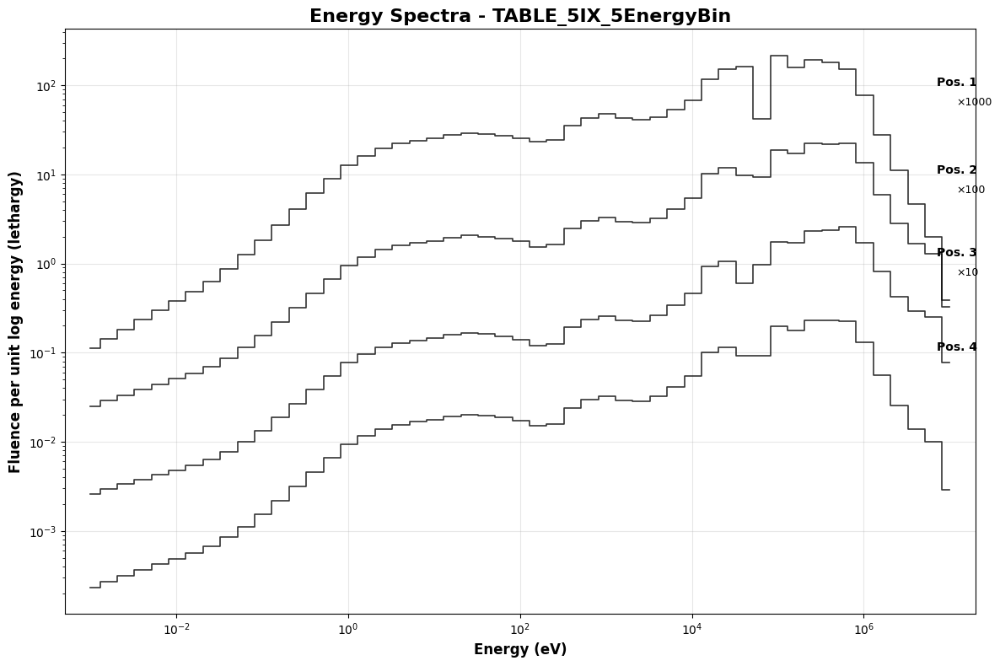


📊 Processing individual plot: TABLE_5VIII_5EnergyBin.csv
✅ Saved plot: TABLE_5VIII_5EnergyBin_SPECTRUM_PLOT.png


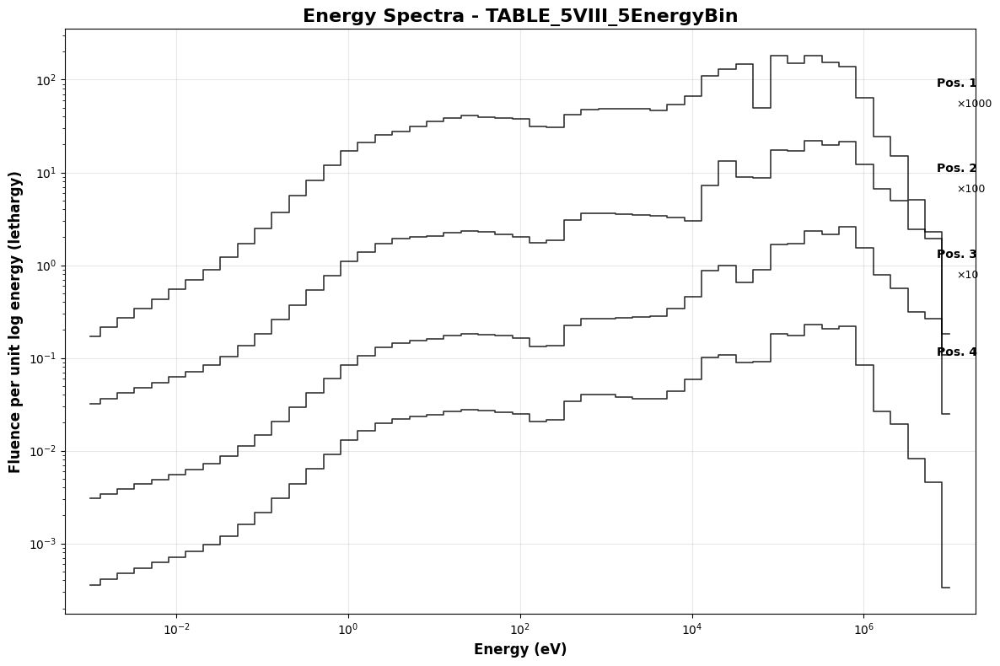


📊 Processing individual plot: TABLE_5XIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XIII_5EnergyBin_SPECTRUM_PLOT.png


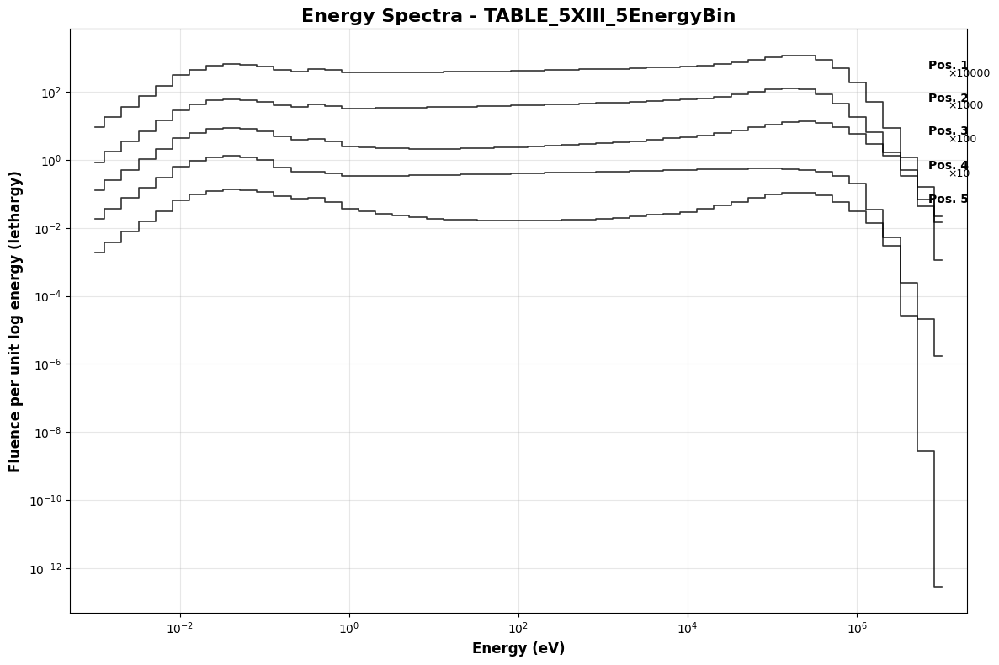


📊 Processing individual plot: TABLE_5XII_5EnergyBin.csv
✅ Saved plot: TABLE_5XII_5EnergyBin_SPECTRUM_PLOT.png


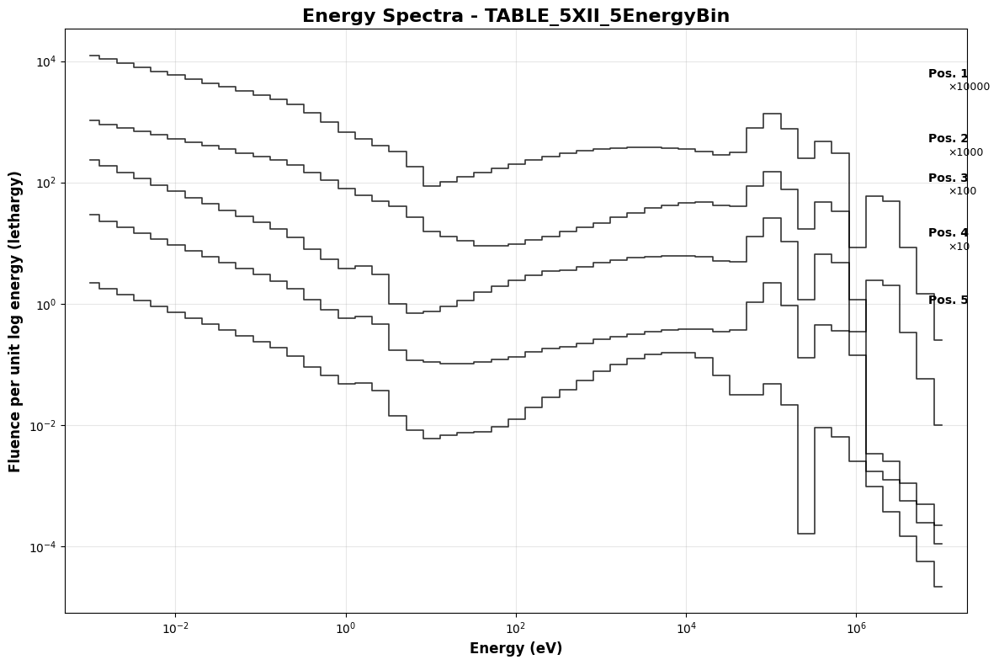


📊 Processing individual plot: TABLE_5XIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XIV_5EnergyBin_SPECTRUM_PLOT.png


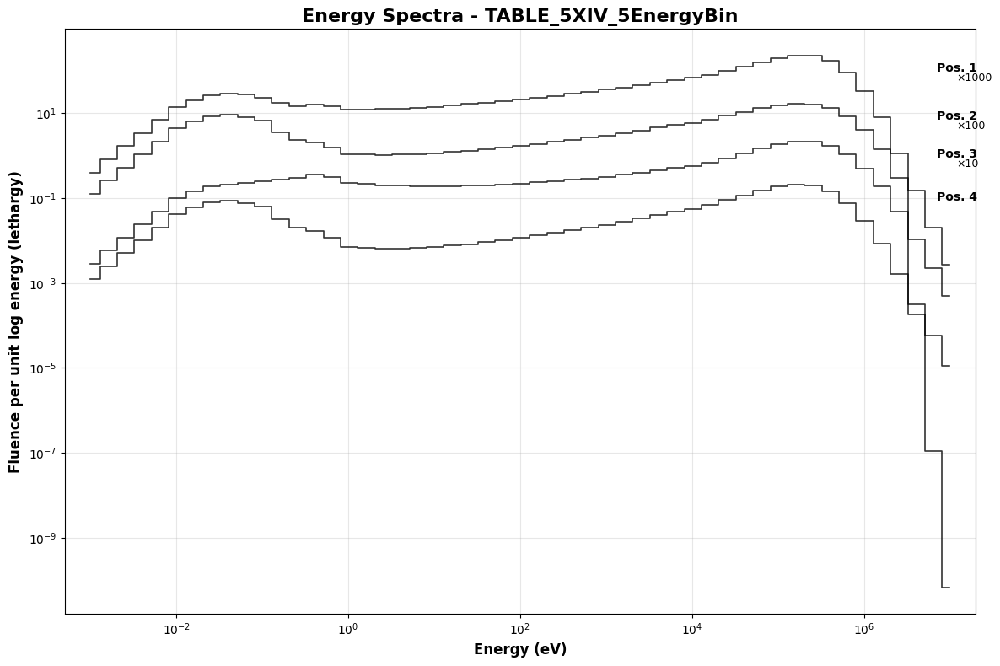


📊 Processing individual plot: TABLE_5XIX_5EnergyBin.csv
✅ Saved plot: TABLE_5XIX_5EnergyBin_SPECTRUM_PLOT.png


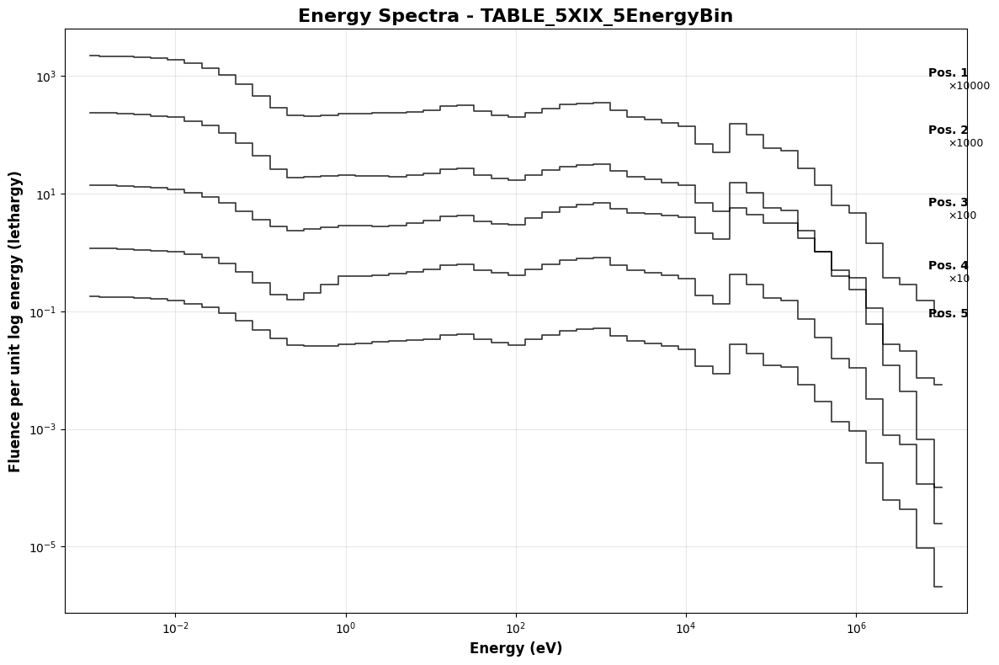


📊 Processing individual plot: TABLE_5XI_5EnergyBin.csv
✅ Saved plot: TABLE_5XI_5EnergyBin_SPECTRUM_PLOT.png


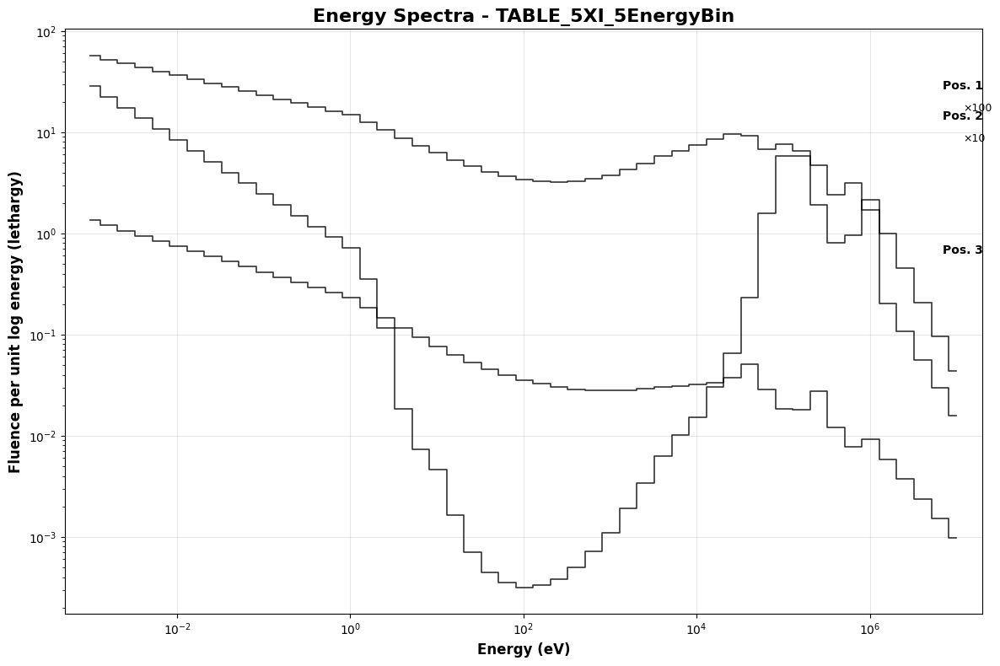


📊 Processing individual plot: TABLE_5XLIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XLIII_5EnergyBin_SPECTRUM_PLOT.png


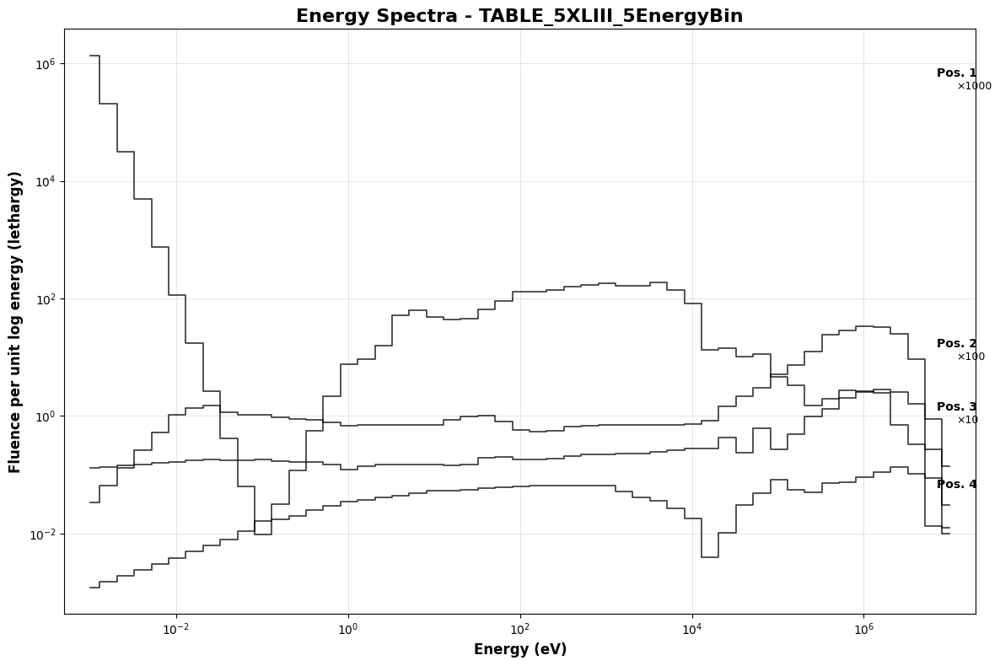


📊 Processing individual plot: TABLE_5XLII_5EnergyBin.csv
✅ Saved plot: TABLE_5XLII_5EnergyBin_SPECTRUM_PLOT.png


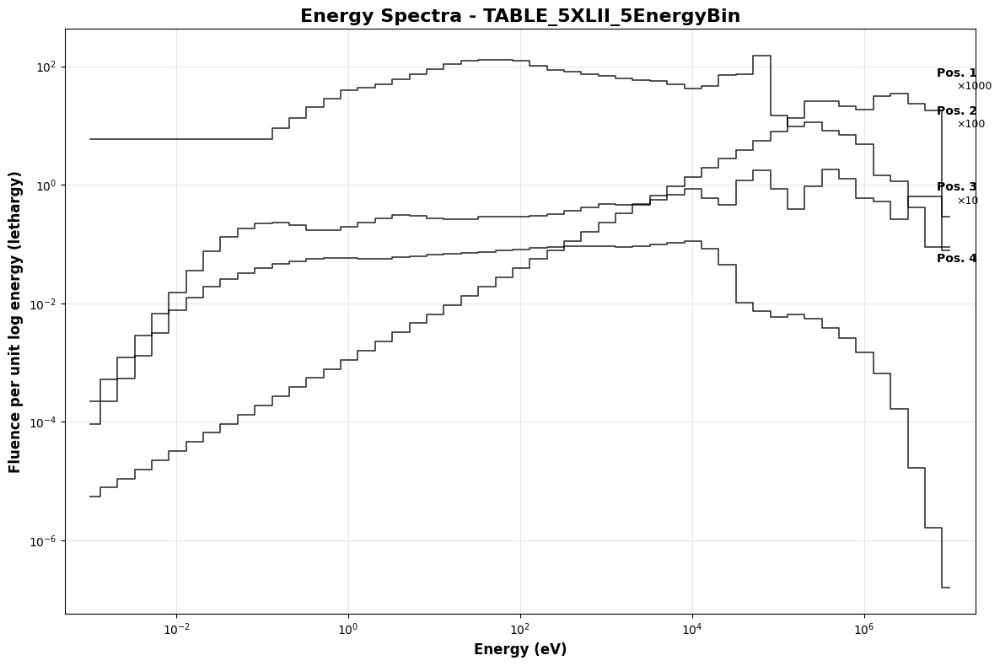


📊 Processing individual plot: TABLE_5XLIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XLIV_5EnergyBin_SPECTRUM_PLOT.png


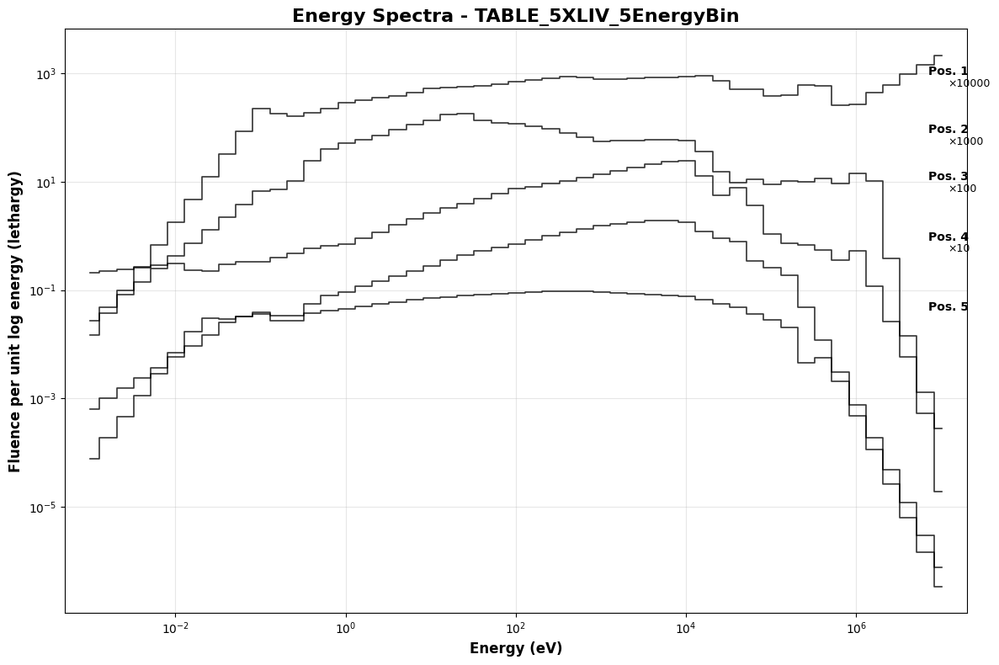


📊 Processing individual plot: TABLE_5XLI_5EnergyBin.csv
✅ Saved plot: TABLE_5XLI_5EnergyBin_SPECTRUM_PLOT.png


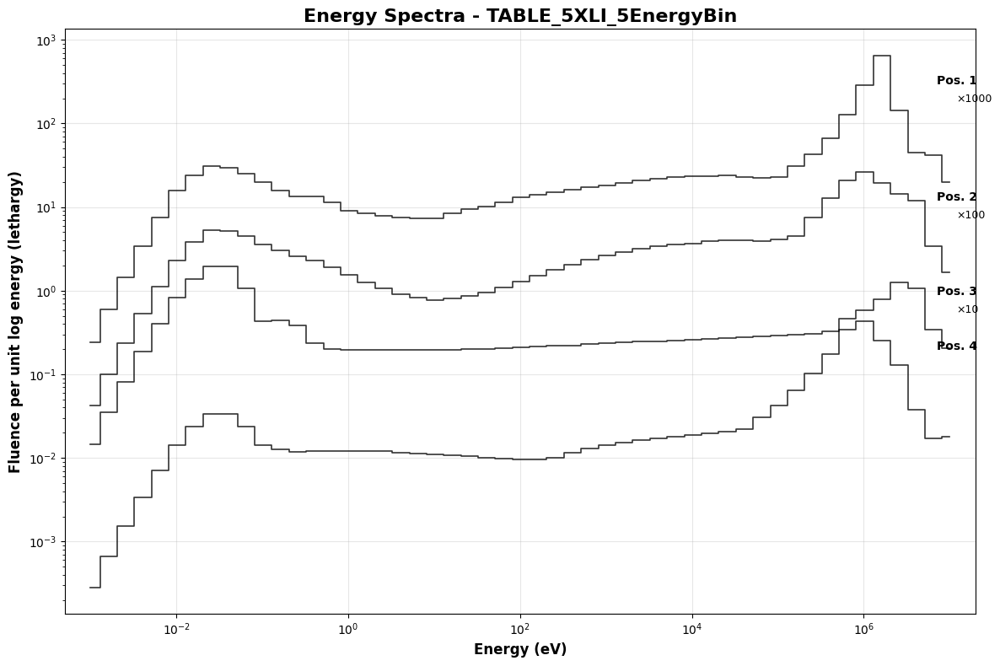


📊 Processing individual plot: TABLE_5XVIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XVIII_5EnergyBin_SPECTRUM_PLOT.png


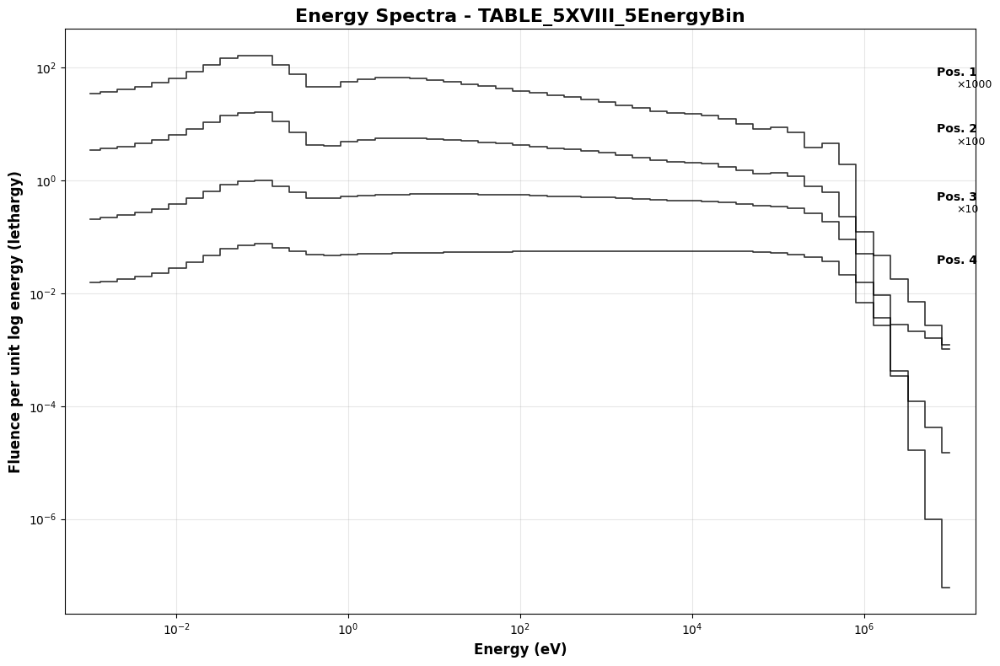


📊 Processing individual plot: TABLE_5XVII_5EnergyBin.csv
✅ Saved plot: TABLE_5XVII_5EnergyBin_SPECTRUM_PLOT.png


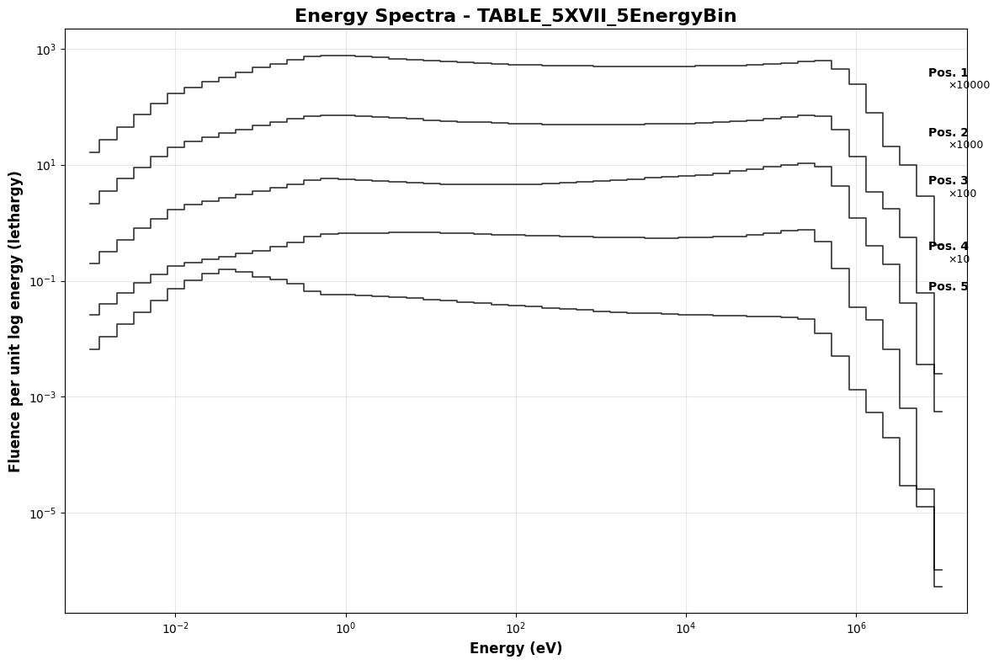


📊 Processing individual plot: TABLE_5XVI_5EnergyBin.csv
✅ Saved plot: TABLE_5XVI_5EnergyBin_SPECTRUM_PLOT.png


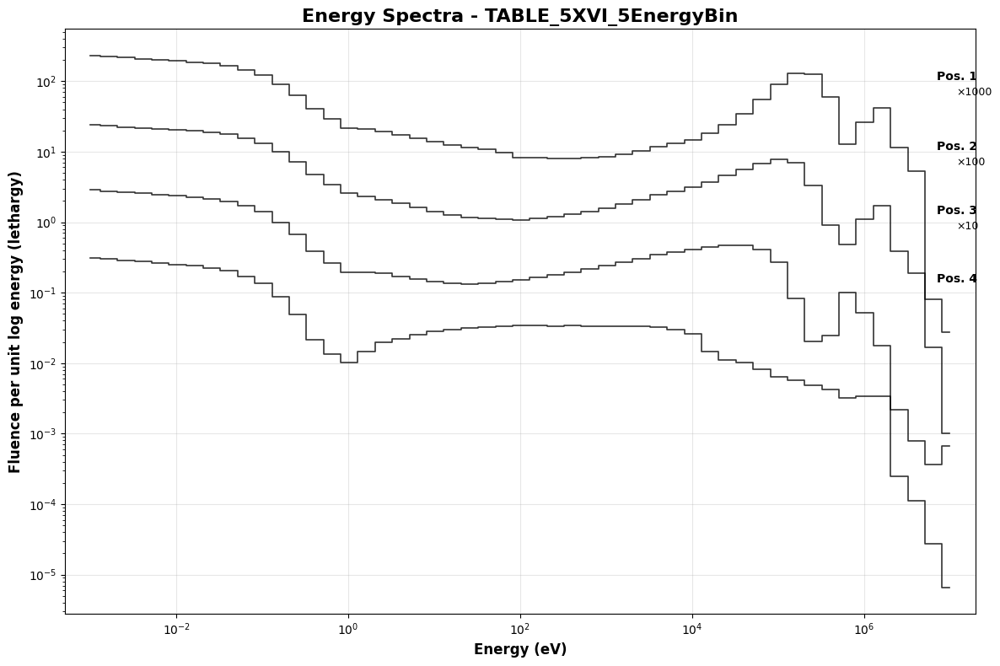


📊 Processing individual plot: TABLE_5XV_5EnergyBin.csv
✅ Saved plot: TABLE_5XV_5EnergyBin_SPECTRUM_PLOT.png


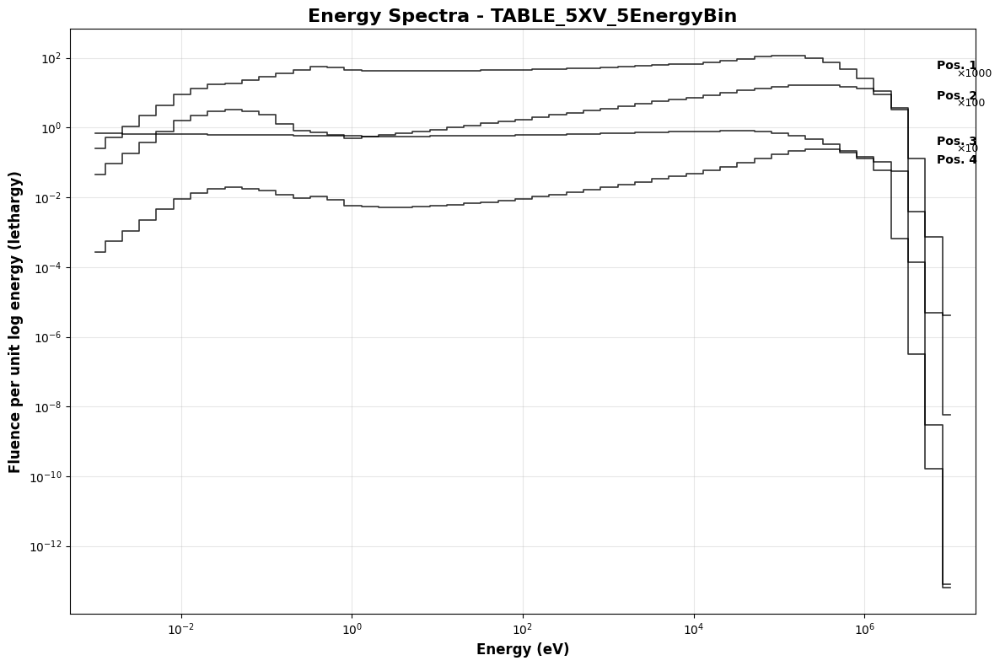


📊 Processing individual plot: TABLE_5XXIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXIII_5EnergyBin_SPECTRUM_PLOT.png


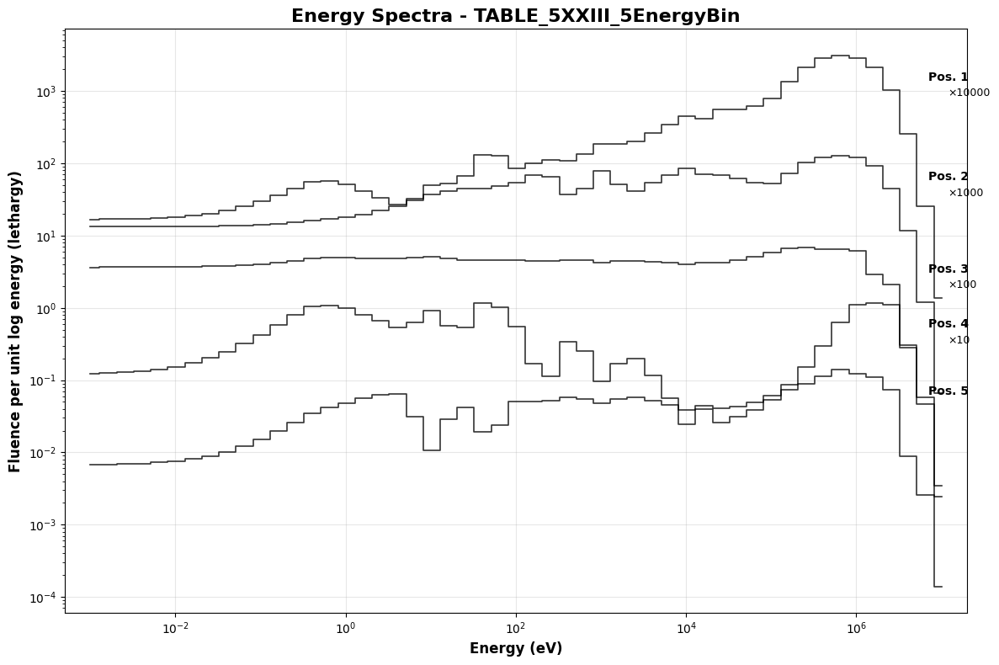


📊 Processing individual plot: TABLE_5XXII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXII_5EnergyBin_SPECTRUM_PLOT.png


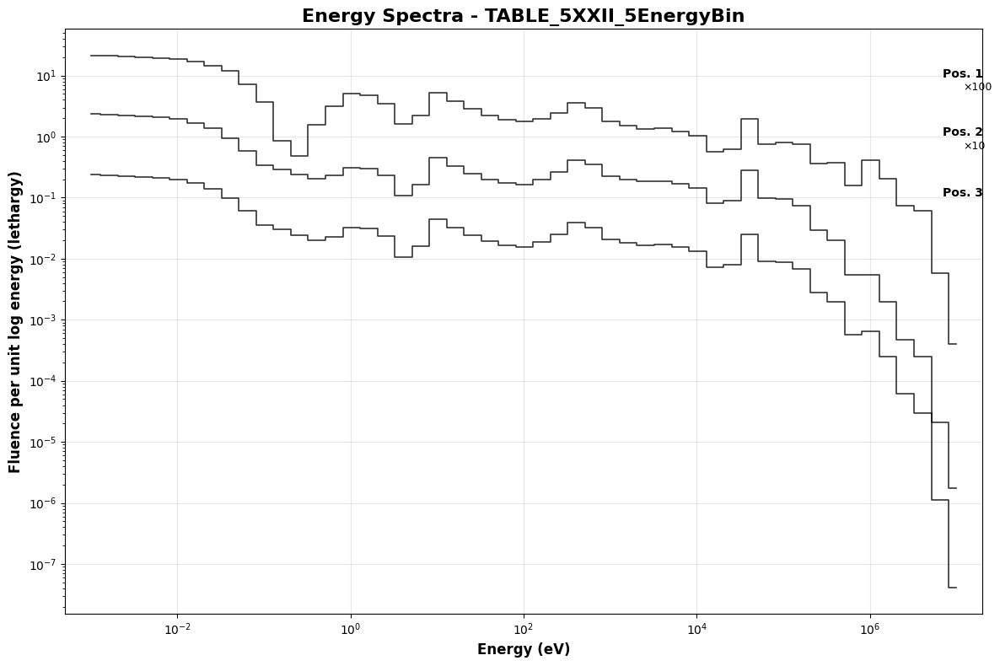


📊 Processing individual plot: TABLE_5XXIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXIV_5EnergyBin_SPECTRUM_PLOT.png


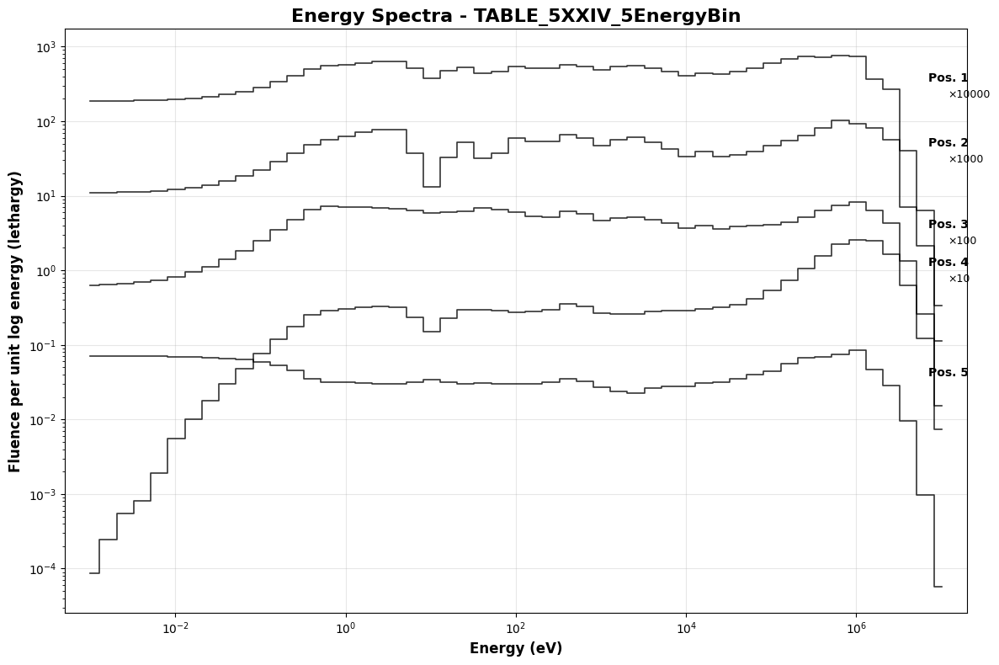


📊 Processing individual plot: TABLE_5XXIX_5EnergyBin.csv
✅ Saved plot: TABLE_5XXIX_5EnergyBin_SPECTRUM_PLOT.png


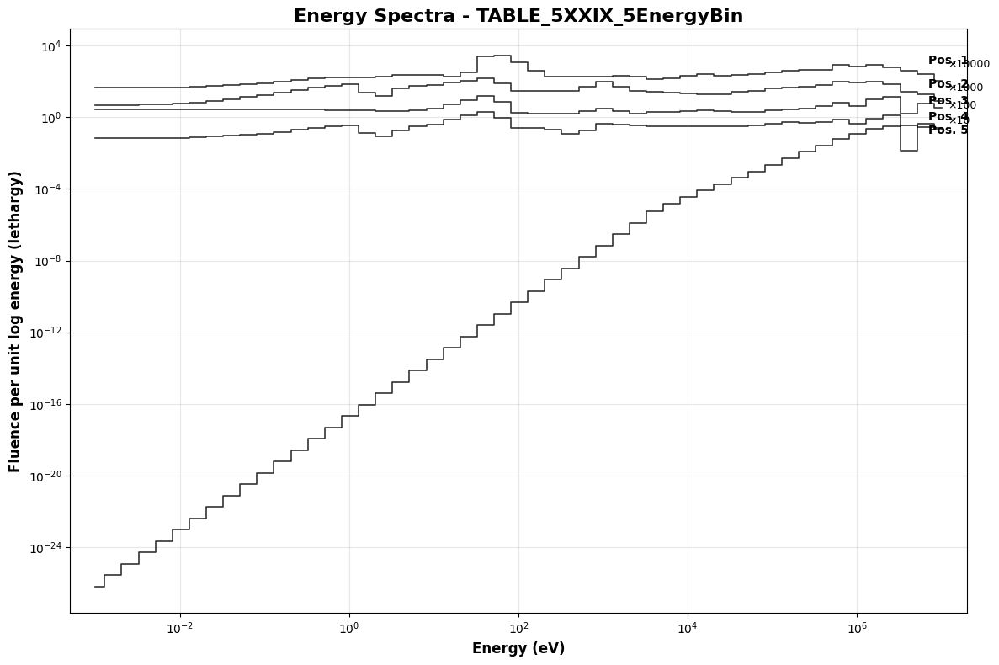


📊 Processing individual plot: TABLE_5XXI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXI_5EnergyBin_SPECTRUM_PLOT.png


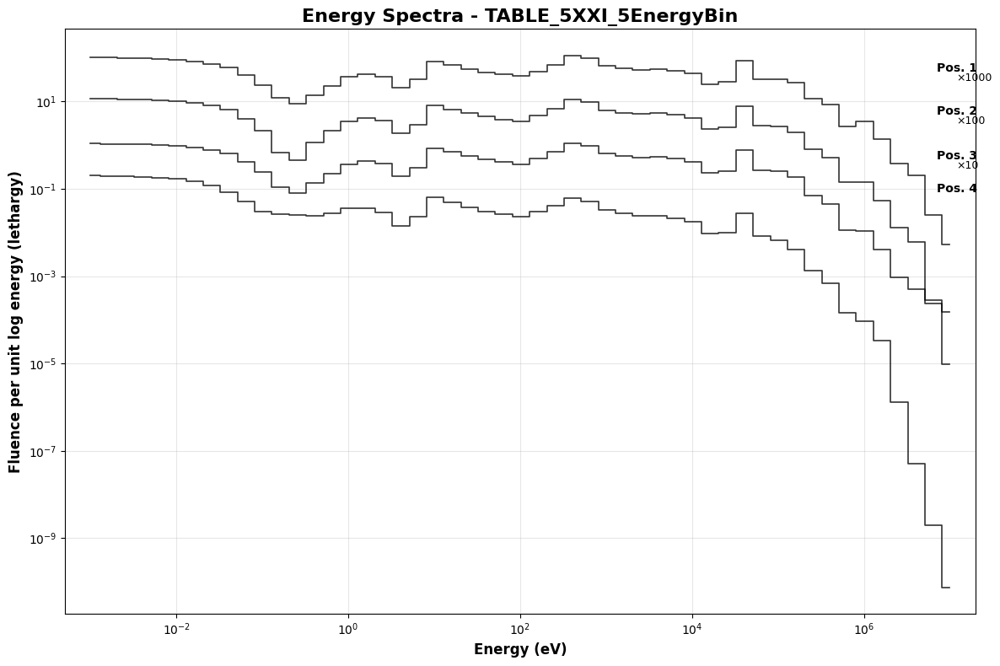


📊 Processing individual plot: TABLE_5XXVIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXVIII_5EnergyBin_SPECTRUM_PLOT.png


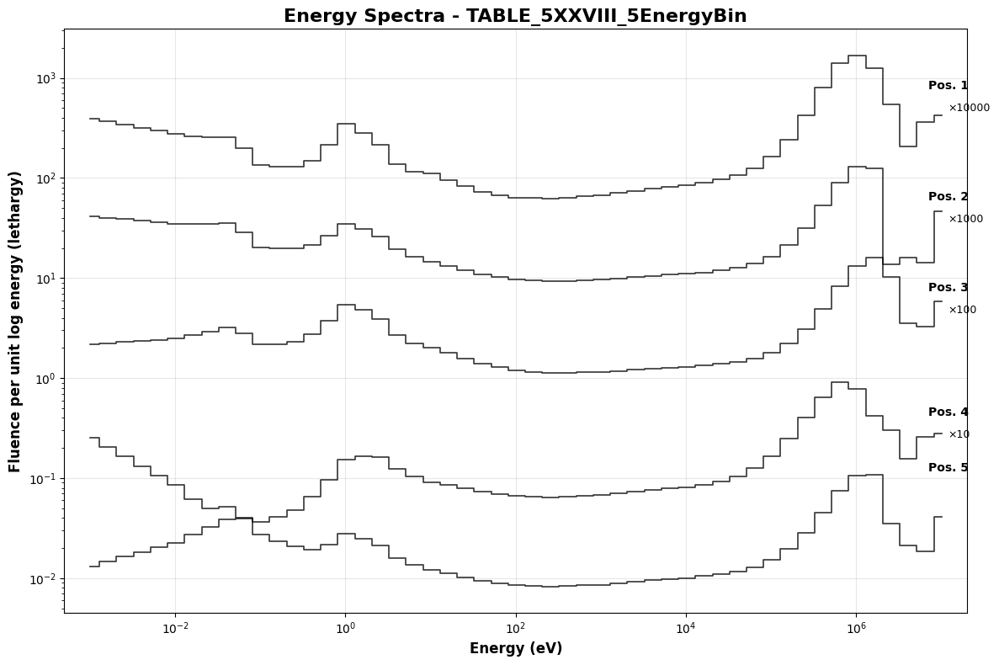


📊 Processing individual plot: TABLE_5XXVII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXVII_5EnergyBin_SPECTRUM_PLOT.png


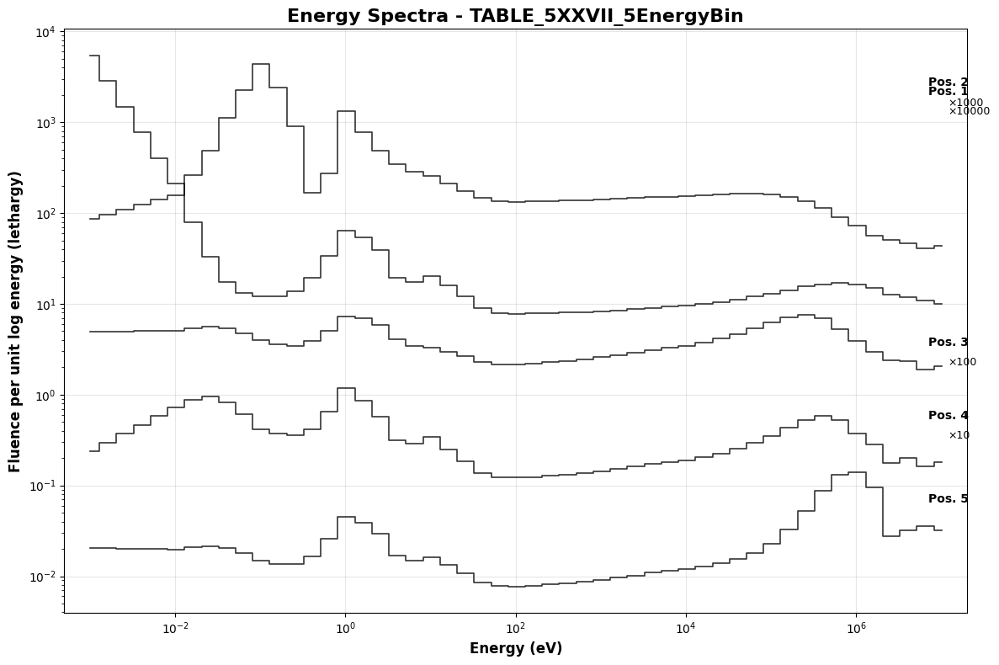


📊 Processing individual plot: TABLE_5XXVI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXVI_5EnergyBin_SPECTRUM_PLOT.png


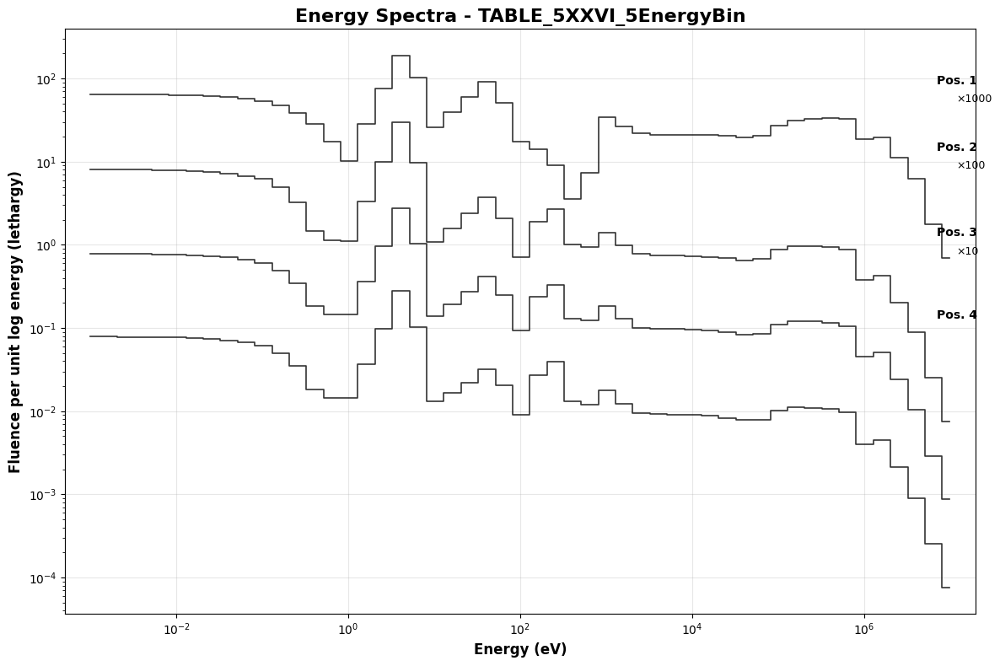


📊 Processing individual plot: TABLE_5XXV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXV_5EnergyBin_SPECTRUM_PLOT.png


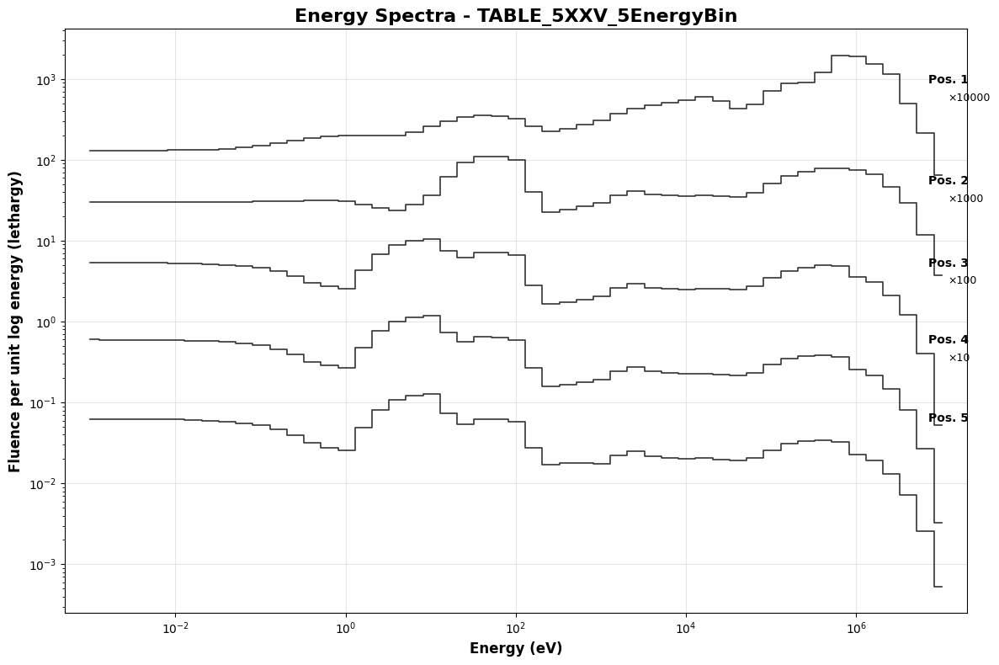


📊 Processing individual plot: TABLE_5XXXIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXIII_5EnergyBin_SPECTRUM_PLOT.png


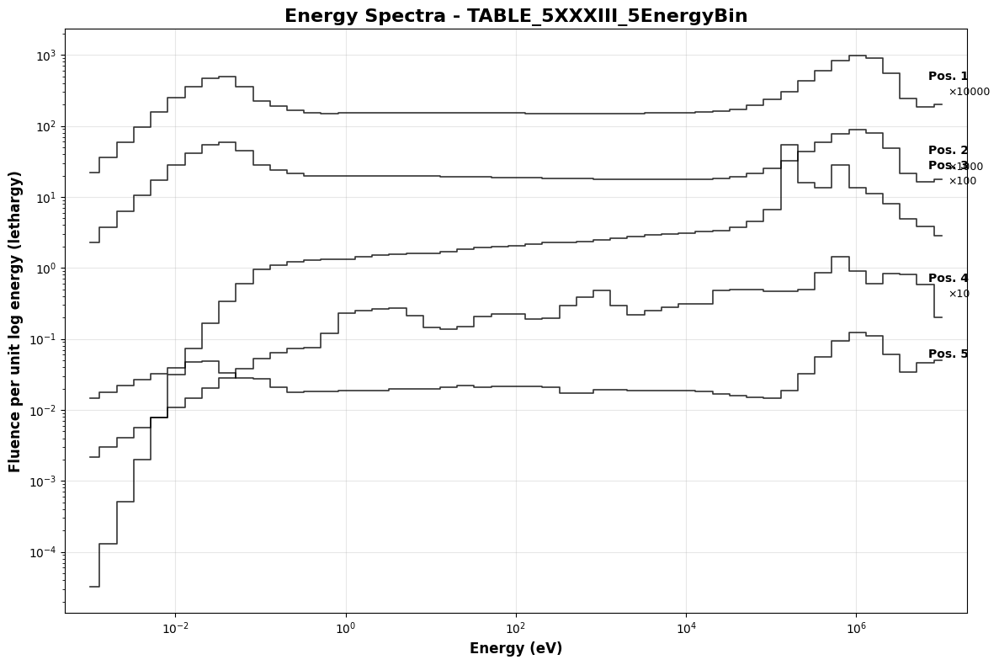


📊 Processing individual plot: TABLE_5XXXII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXII_5EnergyBin_SPECTRUM_PLOT.png


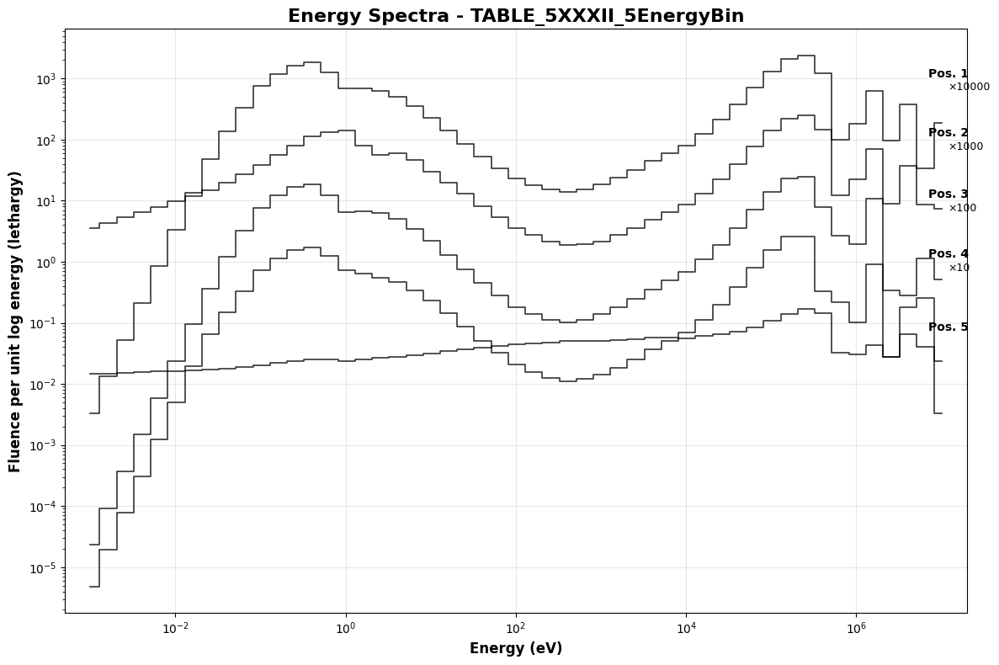


📊 Processing individual plot: TABLE_5XXXIV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXIV_5EnergyBin_SPECTRUM_PLOT.png


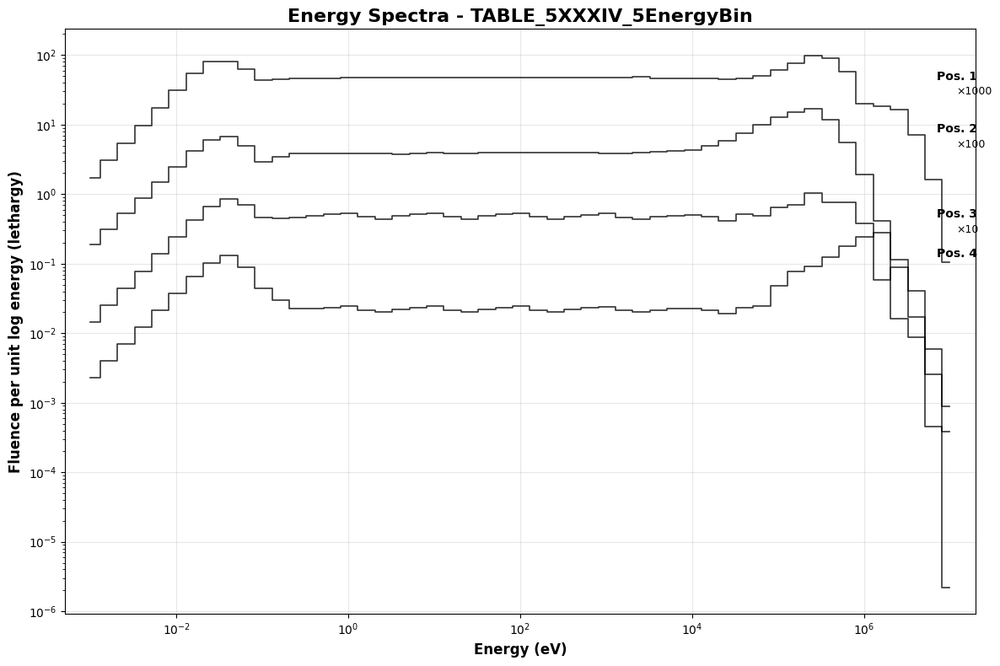


📊 Processing individual plot: TABLE_5XXXIX_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXIX_5EnergyBin_SPECTRUM_PLOT.png


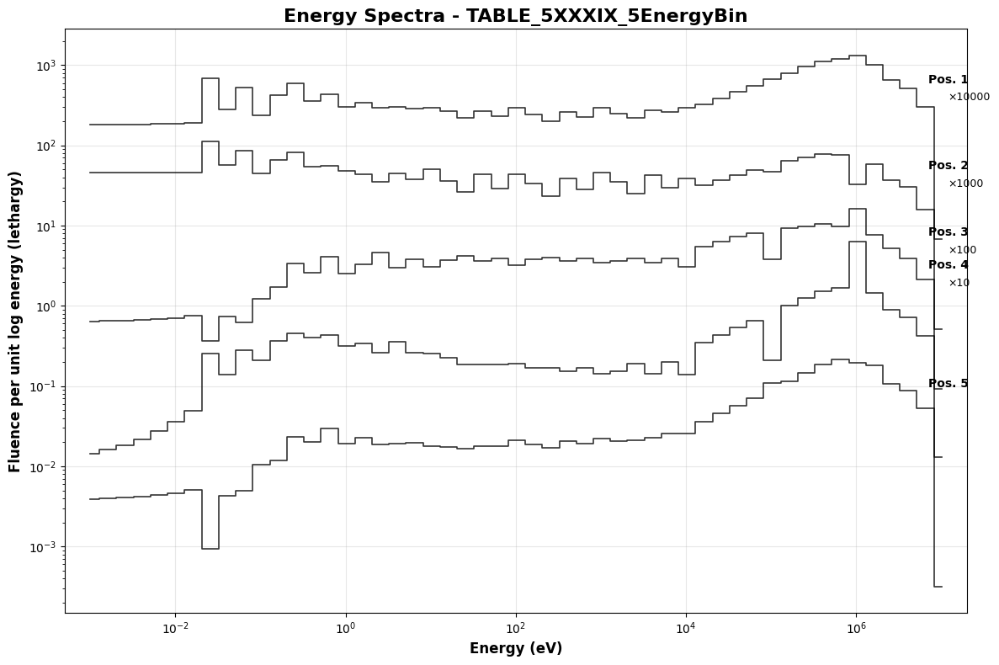


📊 Processing individual plot: TABLE_5XXXI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXI_5EnergyBin_SPECTRUM_PLOT.png


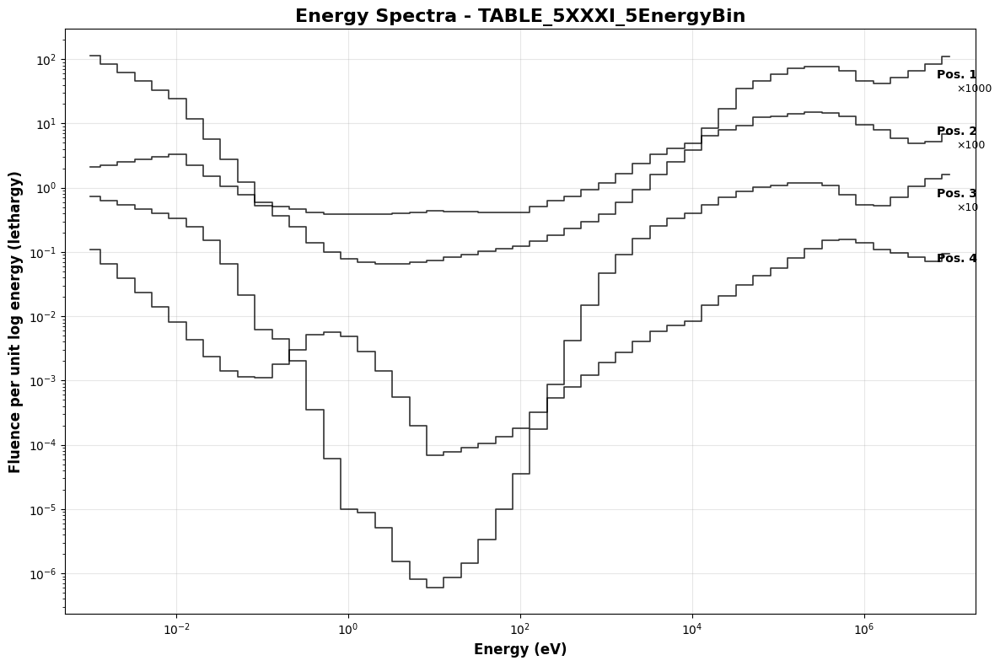


📊 Processing individual plot: TABLE_5XXXVIII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXVIII_5EnergyBin_SPECTRUM_PLOT.png


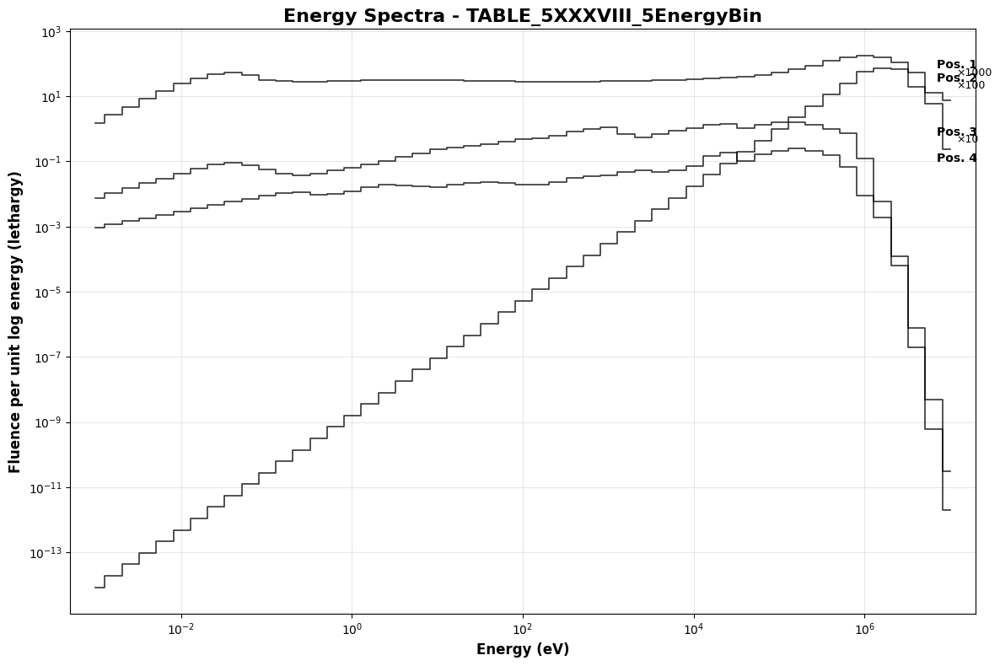


📊 Processing individual plot: TABLE_5XXXVII_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXVII_5EnergyBin_SPECTRUM_PLOT.png


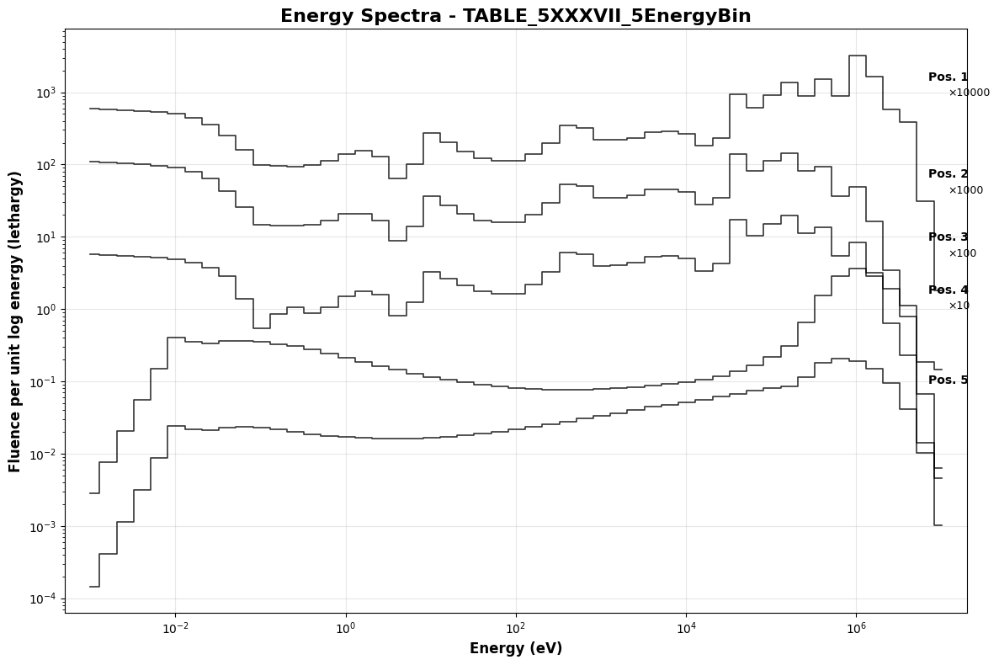


📊 Processing individual plot: TABLE_5XXXVI_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXVI_5EnergyBin_SPECTRUM_PLOT.png


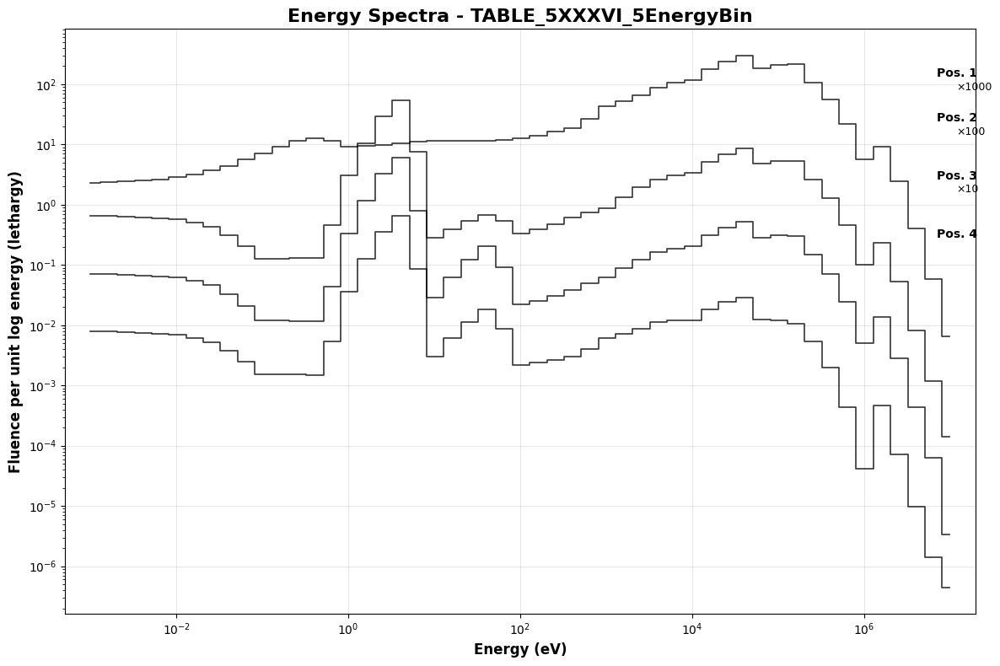


📊 Processing individual plot: TABLE_5XXXV_5EnergyBin.csv
✅ Saved plot: TABLE_5XXXV_5EnergyBin_SPECTRUM_PLOT.png


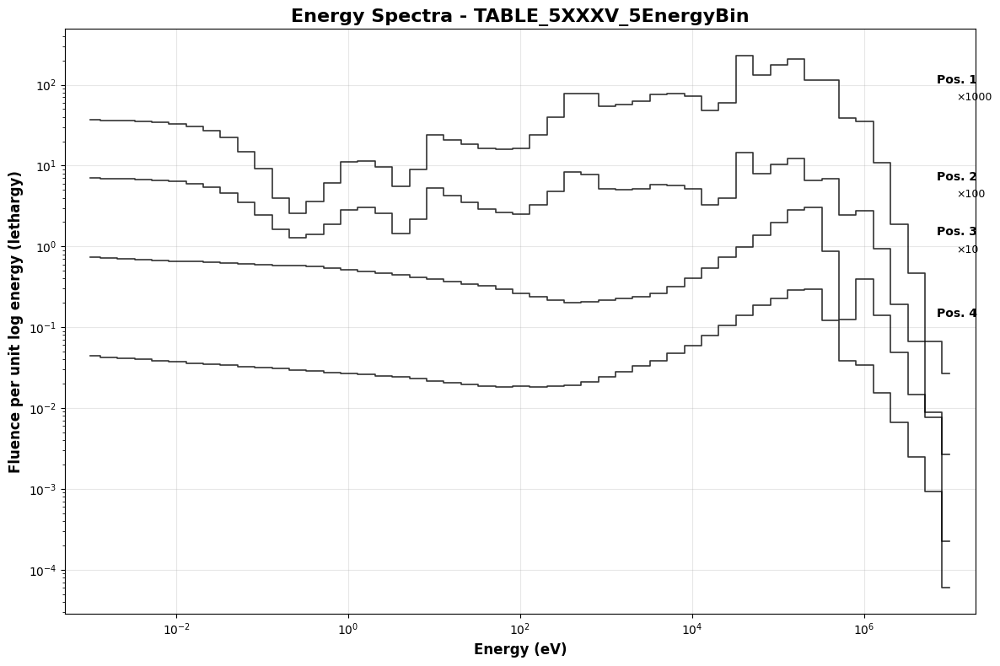


📊 Processing individual plot: TABLE_5XXX_5EnergyBin.csv
✅ Saved plot: TABLE_5XXX_5EnergyBin_SPECTRUM_PLOT.png


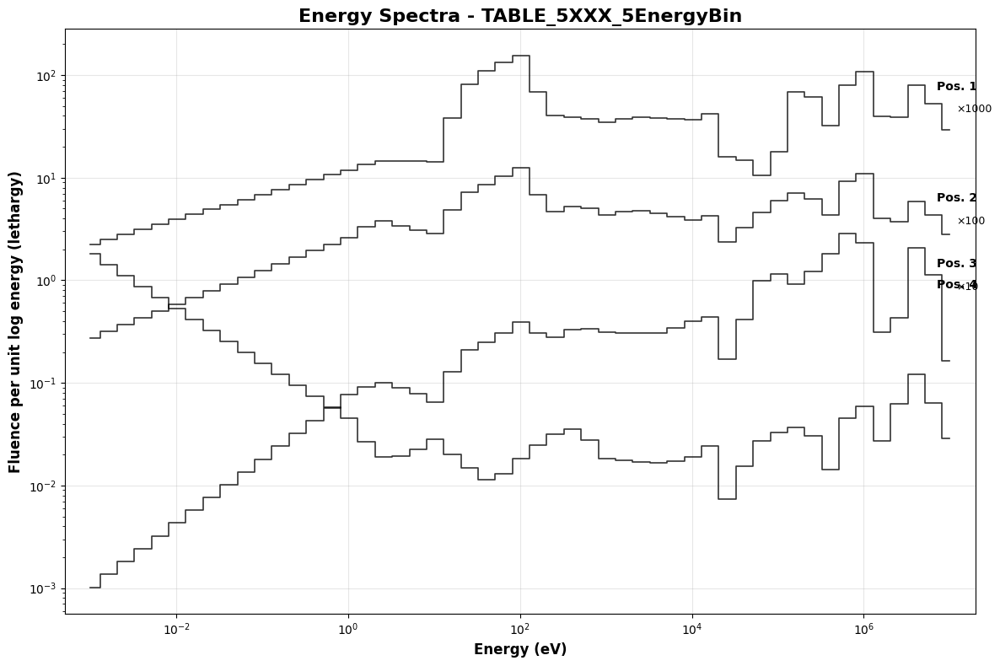


📊 Processing individual plot: TABLE_5XX_5EnergyBin.csv
✅ Saved plot: TABLE_5XX_5EnergyBin_SPECTRUM_PLOT.png


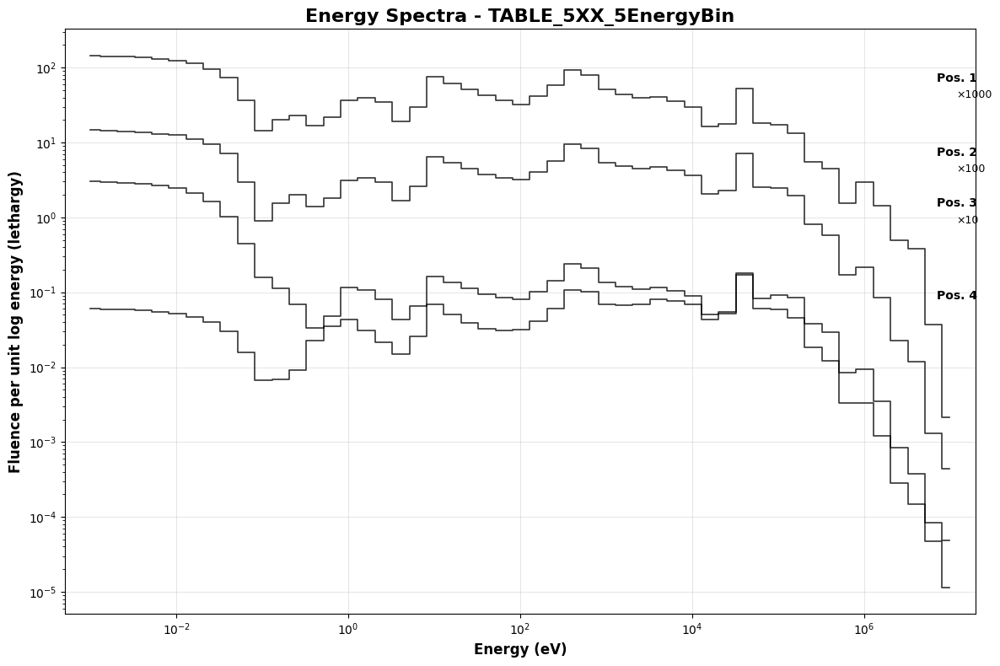


📊 Processing individual plot: TABLE_5X_5EnergyBin.csv
✅ Saved plot: TABLE_5X_5EnergyBin_SPECTRUM_PLOT.png


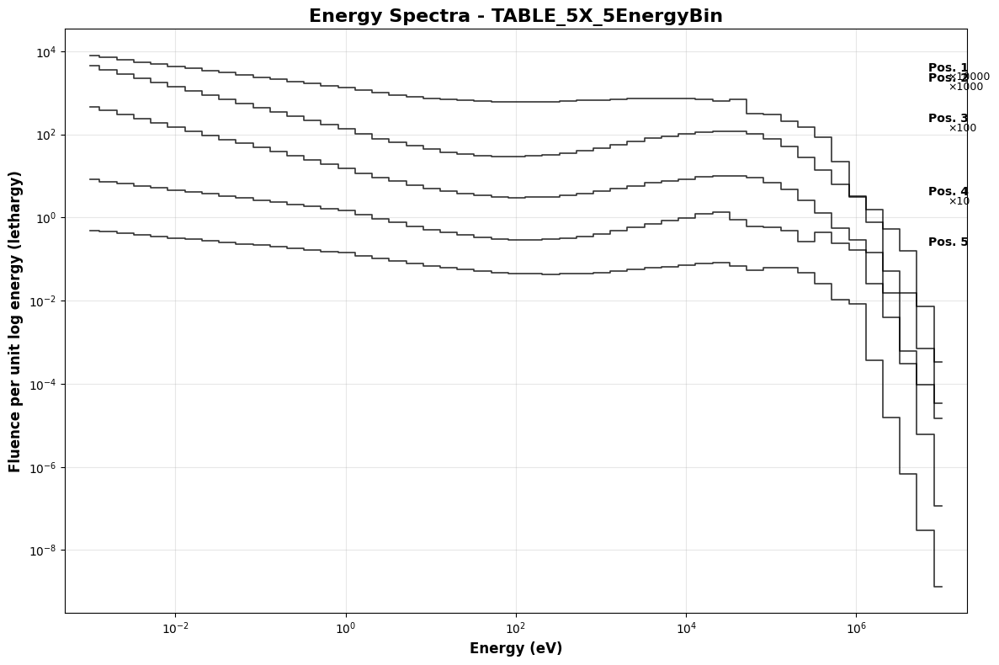


📊 Creating combined ladder plot...
✅ Saved combined ladder plot: CH5_COMBINED_LADDER_PLOT.png


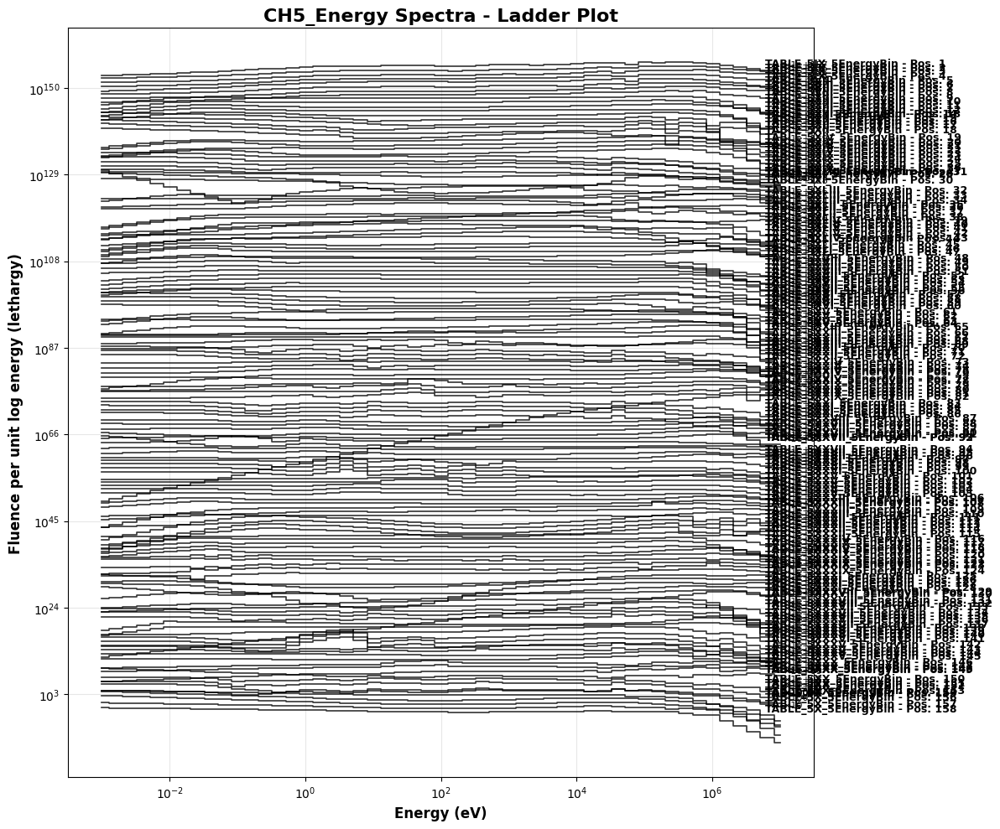


📈 PLOTTING SUMMARY:
   Individual plots: 36/36 files
   Combined ladder plot: 1 file
   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png

🎉 All plots completed!
📁 Check current directory for PNG plot files


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from pathlib import Path

def plot_spectra_from_csv(csv_file):
    """
    Plot spectral data from a single CSV file.
    X-axis: Energy_eV, Y-axis: All other columns
    """
    try:
        # Read the CSV file
        df = pd.read_csv(csv_file)

        # Check if the file has the expected structure
        if 'Energy_eV' not in df.columns:
            print(f"⚠️  Warning: No 'Energy_eV' column found in {csv_file}")
            return

        # Get all columns except Energy_eV
        data_columns = [col for col in df.columns if col != 'Energy_eV']

        if not data_columns:
            print(f"⚠️  Warning: No data columns found in {csv_file}")
            return

        # Convert Energy_eV to numeric, handling scientific notation
        df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')

        # Remove rows with NaN energy values
        df = df.dropna(subset=['Energy_eV'])

        if df.empty:
            print(f"⚠️  Warning: No valid energy data in {csv_file}")
            return

        # Create the plot
        plt.figure(figsize=(12, 8))

        # Plot each data column against energy with ladder offset
        colors = ['black'] * len(data_columns)  # Use black for all curves like the reference

        # Calculate offset multipliers for ladder effect (decreasing from top to bottom)
        offset_multipliers = [10**(i) for i in range(len(data_columns))][::-1]  # Reverse for top-to-bottom

        for i, col in enumerate(data_columns):
            # Convert column data to numeric
            df[col] = pd.to_numeric(df[col], errors='coerce')

            # Remove rows where this column has NaN values
            valid_data = df.dropna(subset=[col])

            if not valid_data.empty:
                # Apply vertical offset for ladder effect
                offset_data = valid_data[col] * offset_multipliers[i]

                plt.loglog(valid_data['Energy_eV'], offset_data,
                          color=colors[i], linewidth=1.2, drawstyle='steps-mid',
                          alpha=0.8)

                # Add position label and multiplier annotation
                pos_label = f"Pos. {i+1}"
                multiplier_label = f"×{offset_multipliers[i]:g}" if offset_multipliers[i] != 1 else ""

                # Position the labels on the right side of the plot
                if not valid_data.empty:
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    # Position label
                    plt.text(max_energy * 0.7, max_flux * 0.5, pos_label,
                            fontsize=10, fontweight='bold', ha='left', va='center')

                    # Multiplier label (if not 1)
                    if multiplier_label:
                        plt.text(max_energy * 1.2, max_flux * 0.3, multiplier_label,
                                fontsize=9, ha='left', va='center')

        # Customize the plot
        table_name = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')
        plt.title(f'Energy Spectra - {table_name}', fontsize=16, fontweight='bold')
        plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
        plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')

        plt.grid(True, alpha=0.3)
        # Remove legend since we're using position labels instead

        # Set axis limits if needed
        if not df['Energy_eV'].empty:
            plt.xlim(df['Energy_eV'].min() * 0.5, df['Energy_eV'].max() * 2)

        plt.tight_layout()

        # Save the plot
        plot_filename = f"{table_name}_SPECTRUM_PLOT.png"
        plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
        print(f"✅ Saved plot: {plot_filename}")

        # Show the plot
        plt.show()

        return True

    except Exception as e:
        print(f"❌ Error plotting {csv_file}: {e}")
        return False


def create_ladder_plot_multiple_files(csv_files, title_prefix=""):
    """
    Create a single ladder plot combining multiple CSV files.
    Each file's data will be offset vertically.
    """
    if not csv_files:
        print("❌ No CSV files provided")
        return

    plt.figure(figsize=(12, 10))

    all_multipliers = []
    position_counter = 1

    # Calculate total number of curves across all files
    total_curves = 0
    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)
            data_columns = [col for col in df.columns if col != 'Energy_eV']
            total_curves += len(data_columns)
        except:
            continue

    # Generate offset multipliers for all curves
    base_multipliers = [10**(i) for i in range(total_curves)][::-1]
    multiplier_idx = 0

    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)

            if 'Energy_eV' not in df.columns:
                continue

            data_columns = [col for col in df.columns if col != 'Energy_eV']
            df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')
            df = df.dropna(subset=['Energy_eV'])

            if df.empty:
                continue

            file_label = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')

            for col in data_columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                valid_data = df.dropna(subset=[col])

                if not valid_data.empty:
                    # Apply vertical offset
                    multiplier = base_multipliers[multiplier_idx]
                    offset_data = valid_data[col] * multiplier

                    plt.loglog(valid_data['Energy_eV'], offset_data,
                              color='black', linewidth=1.2, drawstyle='steps-mid',
                              alpha=0.8)

                    # Add labels
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    pos_label = f"{file_label} - Pos. {position_counter}"
                    multiplier_label = f"×{multiplier:g}" if multiplier != 1 else ""

                    plt.text(max_energy * 0.6, max_flux * 0.5, pos_label,
                            fontsize=9, fontweight='bold', ha='left', va='center')

                    if multiplier_label:
                        plt.text(max_energy * 1.1, max_flux * 0.3, multiplier_label,
                                fontsize=8, ha='left', va='center')

                    position_counter += 1
                    multiplier_idx += 1

        except Exception as e:
            print(f"⚠️  Error processing {csv_file}: {e}")
            continue

    plt.title(f'{title_prefix}Energy Spectra - Ladder Plot', fontsize=16, fontweight='bold')
    plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
    plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    plot_filename = f"{title_prefix}COMBINED_LADDER_PLOT.png"
    plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
    print(f"✅ Saved combined ladder plot: {plot_filename}")
    plt.show()


def plot_all_spectra_files(file_pattern="*5EnergyBin*.csv"):
    """
    Find and plot all CSV files - both individual and combined ladder plots.
    """
    csv_files = glob.glob(file_pattern)

    if not csv_files:
        print(f"❌ No CSV files found matching pattern: {file_pattern}")
        print("📂 Current directory contents:")
        for file in os.listdir('.'):
            if file.endswith('.csv'):
                print(f"   📄 {file}")
        return

    print(f"🎯 Found {len(csv_files)} spectral CSV files to plot:")
    for file in sorted(csv_files):
        print(f"   📄 {file}")

    print("\n🚀 Starting plotting process...")
    print("=" * 50)

    # Individual plots with ladder style
    successful_plots = 0
    for csv_file in sorted(csv_files):
        print(f"\n📊 Processing individual plot: {csv_file}")
        if plot_spectra_from_csv(csv_file):
            successful_plots += 1

    # Combined ladder plot
    print(f"\n📊 Creating combined ladder plot...")
    create_ladder_plot_multiple_files(sorted(csv_files), "CH5_")

    print(f"\n📈 PLOTTING SUMMARY:")
    print(f"   Individual plots: {successful_plots}/{len(csv_files)} files")
    print(f"   Combined ladder plot: 1 file")
    print(f"   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png")


def plot_specific_table(table_name):
    """
    Plot a specific table by name (e.g., "TABLE_5I")
    """
    # Look for files matching the table name
    patterns = [
        f"{table_name}*.csv",
        f"*{table_name}*.csv"
    ]

    csv_files = []
    for pattern in patterns:
        csv_files.extend(glob.glob(pattern))

    if not csv_files:
        print(f"❌ No CSV files found for table: {table_name}")
        return

    for csv_file in csv_files:
        print(f"📊 Plotting: {csv_file}")
        plot_spectra_from_csv(csv_file)


def create_summary_info():
    """
    Create a summary of all available spectral data files
    """
    csv_files = glob.glob("*SPECTRA*.csv")

    if not csv_files:
        print("❌ No spectral CSV files found")
        return

    print("📋 SPECTRAL DATA SUMMARY:")
    print("=" * 60)

    for csv_file in sorted(csv_files):
        try:
            df = pd.read_csv(csv_file)
            table_name = Path(csv_file).stem

            if 'Energy_eV' in df.columns:
                data_cols = [col for col in df.columns if col != 'Energy_eV']
                energy_range = f"{df['Energy_eV'].min():.1E} - {df['Energy_eV'].max():.1E} eV"

                print(f"📄 {table_name}:")
                print(f"   📊 Data columns: {len(data_cols)} ({', '.join(data_cols)})")
                print(f"   ⚡ Energy range: {energy_range}")
                print(f"   📈 Data points: {len(df)} rows")
                print()
        except Exception as e:
            print(f"⚠️  Error reading {csv_file}: {e}")


# Main execution options
if __name__ == "__main__":
    # Option 1: Plot all spectral files
    print("🎯 SPECTRAL DATA PLOTTING TOOL")
    print("=" * 40)

    # Show summary first
    create_summary_info()

    # Plot all files
    plot_all_spectra_files()

    # Example of plotting specific table:
    # plot_specific_table("TABLE_5I")

    print("\n🎉 All plots completed!")
    print("📁 Check current directory for PNG plot files")

#10 Bins Per Deacade

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os
import zipfile

# --- Settings ---
emin, emax = 1e-3, 1e8   # 10 decades
points_per_decade = 10
n_points = points_per_decade * 11 + 1
new_energies = np.logspace(np.log10(emin), np.log10(emax), n_points)

# input pattern: adjust if needed
input_pattern = "/content/TABLE_*_SPECTRA_SECTIONS.csv"
output_dir = "/content/chapter4_10EnergyBin"
os.makedirs(output_dir, exist_ok=True)

generated_files = []

# --- Process each matching file ---
for filepath in glob.glob(input_pattern):
    filename = os.path.basename(filepath)
    base_name = filename.replace("_SPECTRA_SECTIONS.csv", "_10EnergyBin.csv")
    output_path = os.path.join(output_dir, base_name)

    # --- Load data ---
    df = pd.read_csv(filepath)
    energies = df["Energy_eV"].values
    responses = df.drop(columns=["Energy_eV"]).values

    # --- Interpolate in log-log (mask zeros) ---
    new_responses = []
    for i in range(responses.shape[1]):
        col = responses[:, i]

        # mask only positive values
        mask = col > 0
        if np.sum(mask) < 2:
            # not enough points to interpolate safely → return all zeros
            new_col = np.zeros_like(new_energies)
        else:
            x = np.log10(energies[mask])
            y = np.log10(col[mask])

            # --- Remove duplicate energies (keep first only) ---
            df_xy = pd.DataFrame({"x": x, "y": y})
            df_xy = df_xy.drop_duplicates(subset="x", keep="first")

            unique_x = df_xy["x"].values
            unique_y = df_xy["y"].values

            if len(unique_x) < 2:
                new_col = np.zeros_like(new_energies)
            else:
                f = interp1d(unique_x, unique_y,
                             kind="linear",
                             fill_value="extrapolate")
                new_col = 10**f(np.log10(new_energies))

        new_responses.append(new_col)

    new_responses = np.array(new_responses).T

    # --- Save rebinned (only first 105 rows) ---  # <<< CHANGED >>>
    rebinned = pd.DataFrame(new_responses, columns=df.columns[1:])
    rebinned.insert(0, "Energy_eV", new_energies)
    rebinned = rebinned.iloc[:104]   # <<< keep only first 105 rows
    rebinned.to_csv(output_path, index=False, float_format="%.2E")

    print(f"✅ Saved: {output_path}")
    generated_files.append(output_path)

# --- Zip all results ---
zip_path = "/content/chapter4_10EnergyBin.zip"
with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for f in generated_files:
        zipf.write(f, os.path.basename(f))

print(f"📦 All rebinned CSVs compressed into: {zip_path}")


✅ Saved: /content/chapter4_10EnergyBin/TABLE_4IX_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XV_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XX_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XXI_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4VII_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XIV_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XVII_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4VI_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XVI_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XIX_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XVIII_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XXIV_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XIII_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4XI_10EnergyBin.csv
✅ Saved: /content/chapter4_10EnergyBin/TABLE_4X_10EnergyBin.csv
✅ Saved: /co

In [ ]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
import glob
import os
import zipfile

# --- Paths ---
original_zip = "/content/chapter5_tables.zip"
interp_zip   = "/content/chapter5_10EnergyBin.zip"
work_dir     = "/content"

original_folder = os.path.join(work_dir, "original_data")
interp_folder   = os.path.join(work_dir, "chapter5_5EnergyBin")

# --- Extract zips ---
with zipfile.ZipFile(original_zip, "r") as zip_ref:
    zip_ref.extractall(original_folder)

with zipfile.ZipFile(interp_zip, "r") as zip_ref:
    zip_ref.extractall(interp_folder)

print("✅ Both folders extracted")

# --- Comparison results ---
results = []

for interp_file in glob.glob(os.path.join(interp_folder, "*.csv")):
    filename = os.path.basename(interp_file)
    orig_file = os.path.join(original_folder, filename.replace("_10EnergyBin", "_SPECTRA_SECTIONS"))

    if not os.path.exists(orig_file):
        print(f"⚠️ No matching original for {filename}")
        continue

    # Load both
    df_orig = pd.read_csv(orig_file)
    df_interp = pd.read_csv(interp_file)

    energies_orig = df_orig["Energy_eV"].values
    energies_new = df_interp["Energy_eV"].values

    # Loop over columns (skip Energy_eV)
    for col in df_orig.columns[1:]:
        orig_col = df_orig[col].values
        interp_col = df_interp[col].values

        # filter positive values
        mask = orig_col > 0
        if np.sum(mask) < 2:
            continue

        # log10 transform
        x = np.log10(energies_orig[mask])
        y = np.log10(orig_col[mask])

        # ✅ Remove duplicate x values, keep first
        x_unique, idx = np.unique(x, return_index=True)
        y_unique = y[idx]

        if len(x_unique) < 2:
            continue  # skip if not enough unique points

        # interpolation (choose kind: linear/quadratic/cubic)
        f = interp1d(x_unique, y_unique, kind="linear", fill_value="extrapolate")

        # interpolate original onto new energy grid
        orig_on_new = 10**f(np.log10(energies_new))

        # errors
        diff = interp_col - orig_on_new
        mae = np.mean(np.abs(diff))
        mse = np.mean(diff**2)
        mape = np.mean(np.abs(diff / np.maximum(orig_on_new, 1e-30))) * 100

        # R²
        ss_res = np.sum(diff**2)
        ss_tot = np.sum((orig_on_new - np.mean(orig_on_new))**2)
        r2 = 1 - ss_res/ss_tot if ss_tot > 0 else np.nan

        results.append({
            "File": filename,
            "Column": col,
            "MAE": mae,
            "MSE": mse,
            "MAPE (%)": mape,
            "R2": r2
        })

# --- Save and display results ---
df_results = pd.DataFrame(results)
output_csv = "/content/interpolation_precision_final_10.csv"
df_results.to_csv(output_csv, index=False)

print(f"✅ Comparison saved to {output_csv}")
print("\n🔎 Preview of results:")
display(df_results)


✅ Both folders extracted
✅ Comparison saved to /content/interpolation_precision_final_10.csv

🔎 Preview of results:


,File,Column,MAE,MSE,MAPE (%),R2
0,TABLE_5XXXVI_10EnergyBin.csv,Column_1,0.000050,2.583089e-08,0.244133,0.999995
1,TABLE_5XXXVI_10EnergyBin.csv,Column_2,0.000053,3.020448e-08,0.160271,0.999996
2,TABLE_5XXXVI_10EnergyBin.csv,Column_3,0.000053,4.380451e-08,0.148149,0.999995
3,TABLE_5XXXVI_10EnergyBin.csv,Column_4,0.000069,7.965971e-08,0.187133,0.999992
4,TABLE_5XIX_10EnergyBin.csv,Column_1,0.000054,1.244087e-08,0.111927,0.999997
...,...,...,...,...,...,...
153,TABLE_5XXIV_10EnergyBin.csv,Column_1,0.000022,1.759376e-09,0.074824,0.999995
154,TABLE_5XXIV_10EnergyBin.csv,Column_2,0.000032,2.949276e-09,0.104714,0.999995
155,TABLE_5XXIV_10EnergyBin.csv,Column_3,0.000023,1.430370e-09,0.064852,0.999997
156,TABLE_5XXIV_10EnergyBin.csv,Column_4,0.000026,3.069033e-09,0.098678,0.999999


🎯 SPECTRAL DATA PLOTTING TOOL
📋 SPECTRAL DATA SUMMARY:
📄 TABLE_5IX_SPECTRA_SECTIONS:
   📊 Data columns: 4 (Column_1, Column_2, Column_3, Column_4)
   ⚡ Energy range: 1.0E-03 - 7.9E+06 eV
   📈 Data points: 51 rows

📄 TABLE_5VIII_SPECTRA_SECTIONS:
   📊 Data columns: 4 (Column_1, Column_2, Column_3, Column_4)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XIII_SPECTRA_SECTIONS:
   📊 Data columns: 5 (Column_1, Column_2, Column_3, Column_4, Column_5)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XII_SPECTRA_SECTIONS:
   📊 Data columns: 5 (Column_1, Column_2, Column_3, Column_4, Column_5)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XIV_SPECTRA_SECTIONS:
   📊 Data columns: 4 (Column_1, Column_2, Column_3, Column_4)
   ⚡ Energy range: 1.0E-03 - 6.3E+08 eV
   📈 Data points: 63 rows

📄 TABLE_5XIX_SPECTRA_SECTIONS:
   📊 Data columns: 5 (Column_1, Column_2, Column_3, Column_4, Column_5)
   ⚡ Energy range: 1.

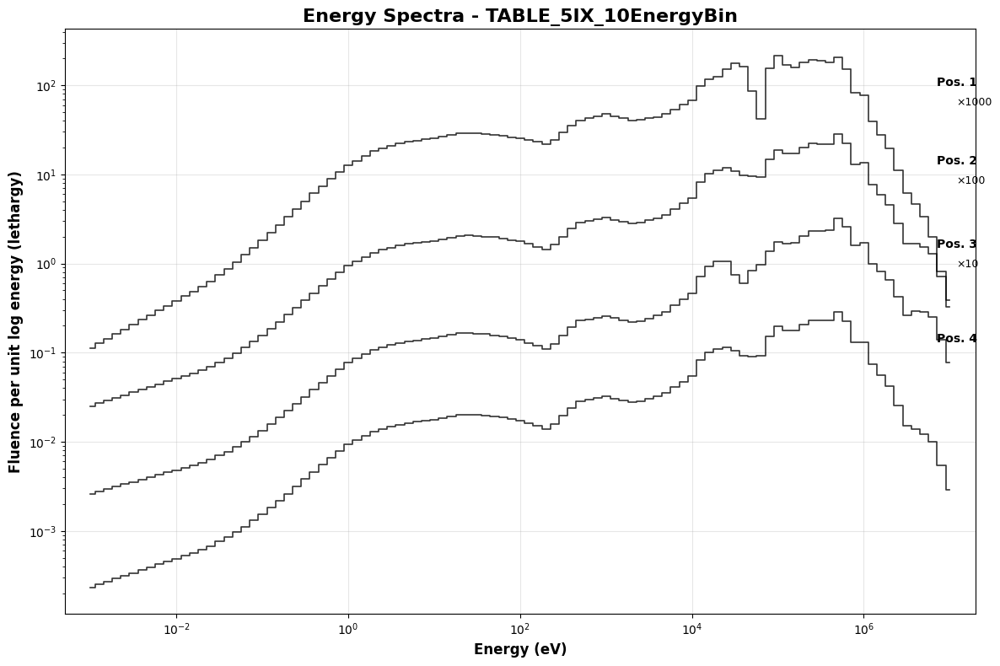


📊 Processing individual plot: TABLE_5VIII_10EnergyBin.csv
✅ Saved plot: TABLE_5VIII_10EnergyBin_SPECTRUM_PLOT.png


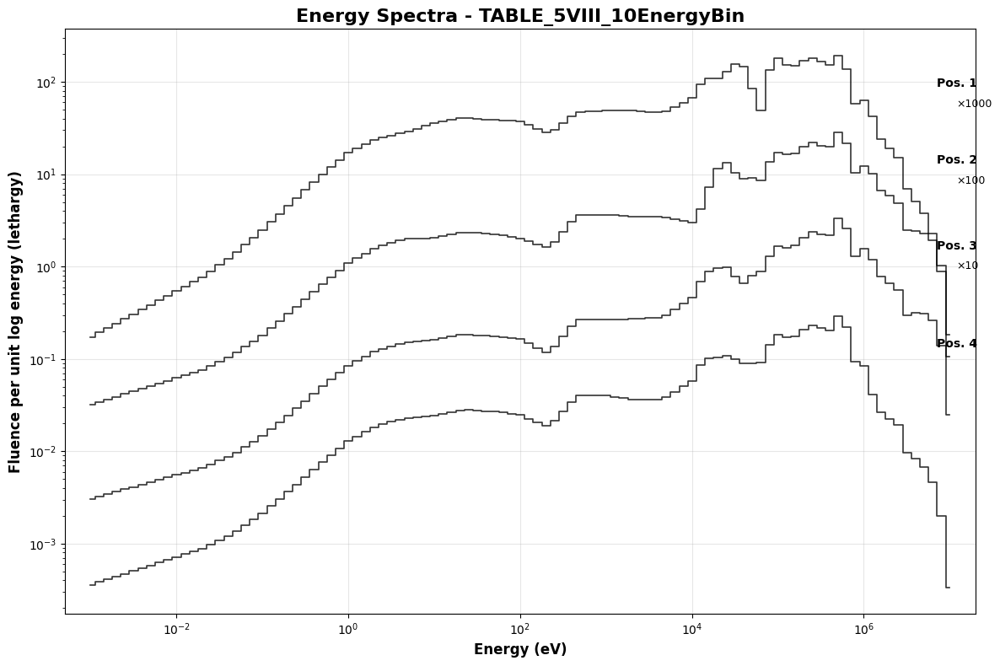


📊 Processing individual plot: TABLE_5XIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XIII_10EnergyBin_SPECTRUM_PLOT.png


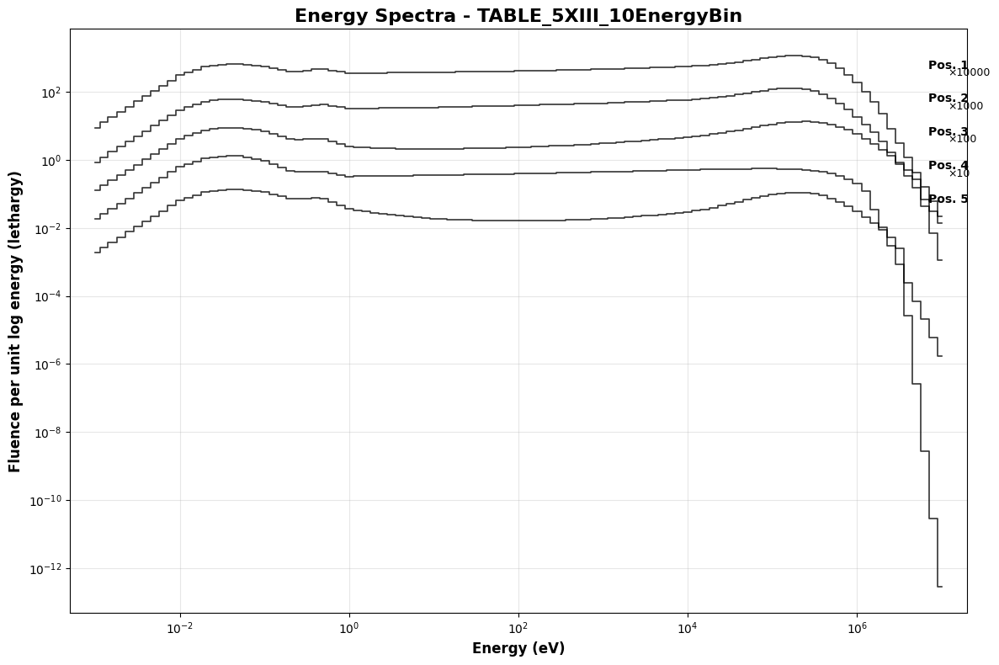


📊 Processing individual plot: TABLE_5XII_10EnergyBin.csv
✅ Saved plot: TABLE_5XII_10EnergyBin_SPECTRUM_PLOT.png


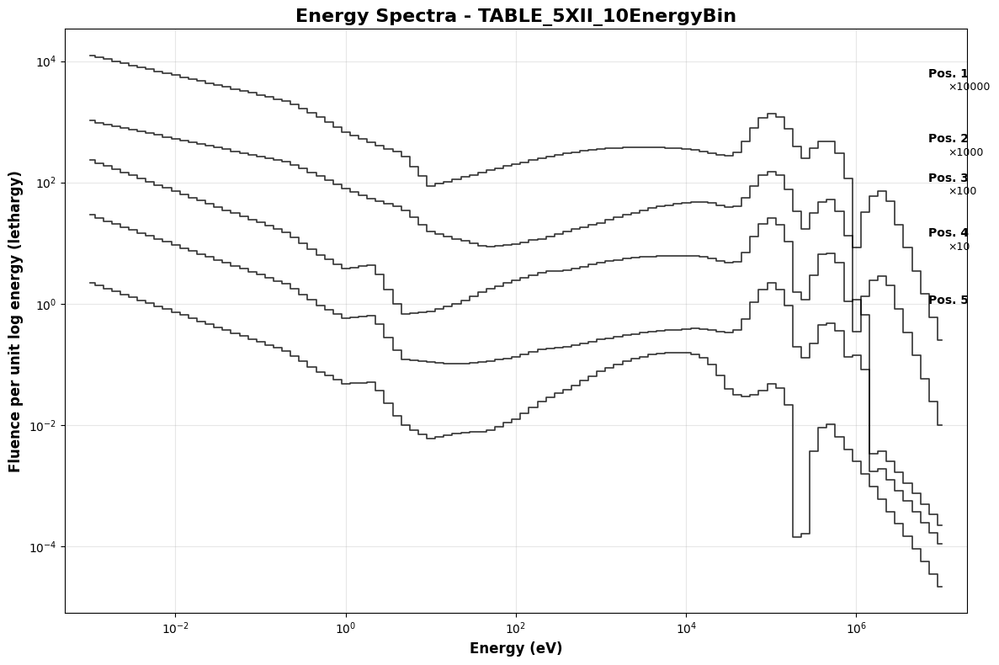


📊 Processing individual plot: TABLE_5XIV_10EnergyBin.csv
✅ Saved plot: TABLE_5XIV_10EnergyBin_SPECTRUM_PLOT.png


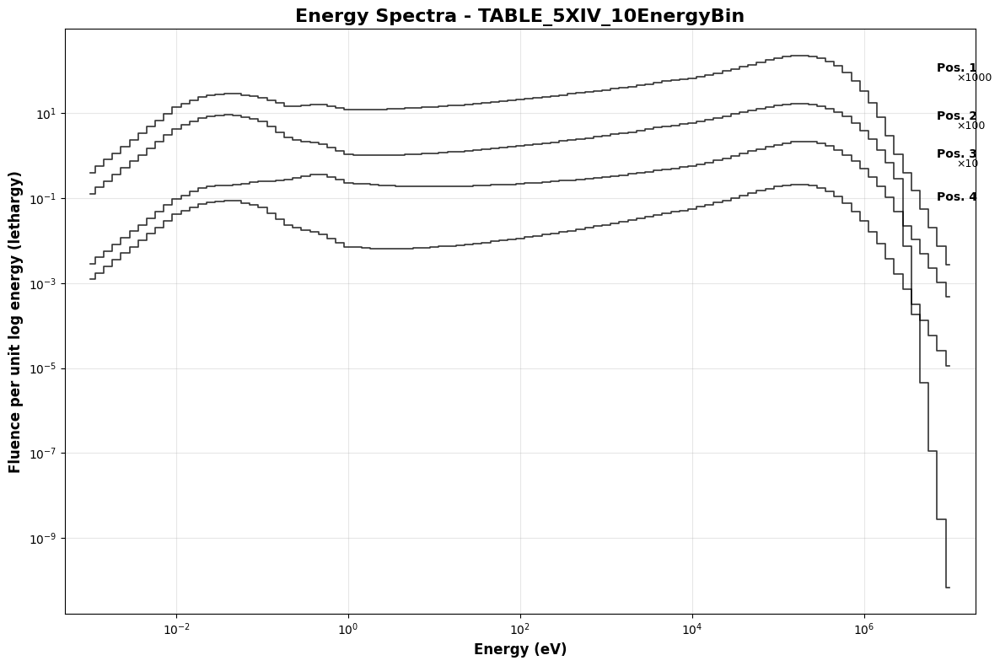


📊 Processing individual plot: TABLE_5XIX_10EnergyBin.csv
✅ Saved plot: TABLE_5XIX_10EnergyBin_SPECTRUM_PLOT.png


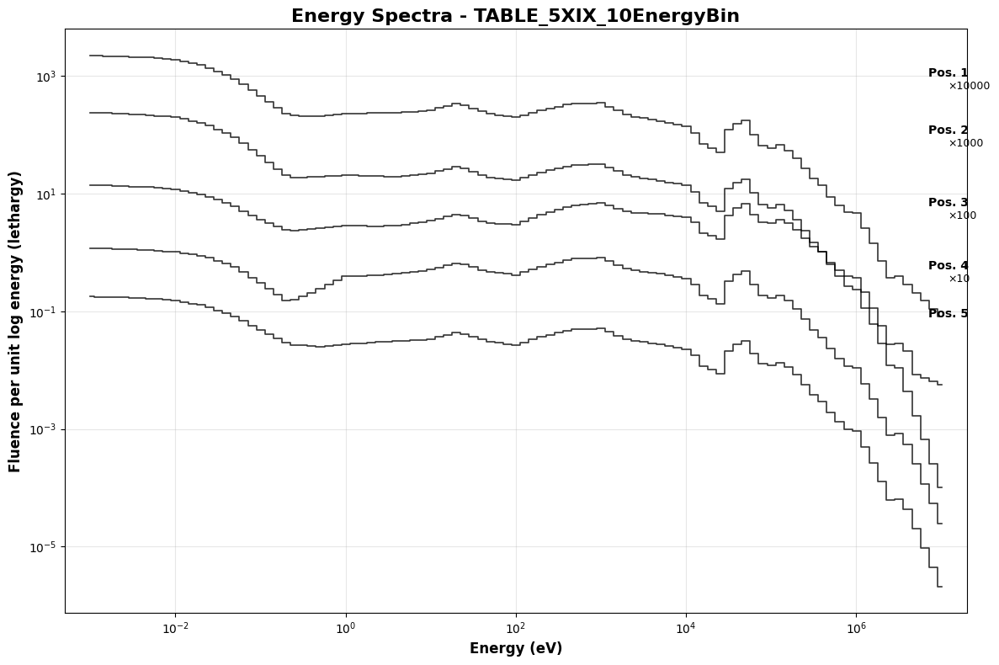


📊 Processing individual plot: TABLE_5XI_10EnergyBin.csv
✅ Saved plot: TABLE_5XI_10EnergyBin_SPECTRUM_PLOT.png


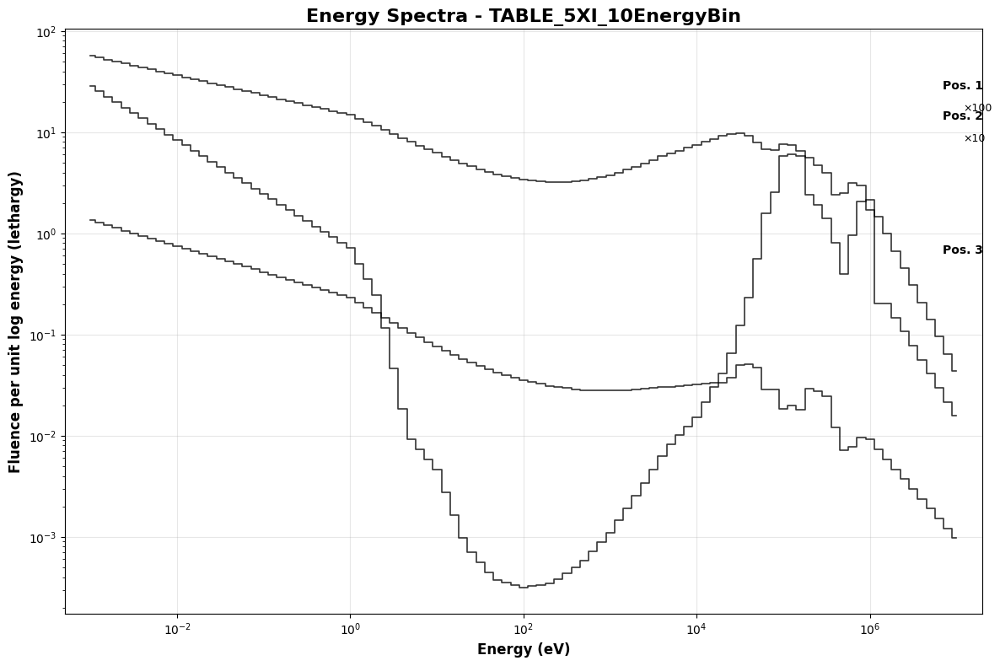


📊 Processing individual plot: TABLE_5XLIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XLIII_10EnergyBin_SPECTRUM_PLOT.png


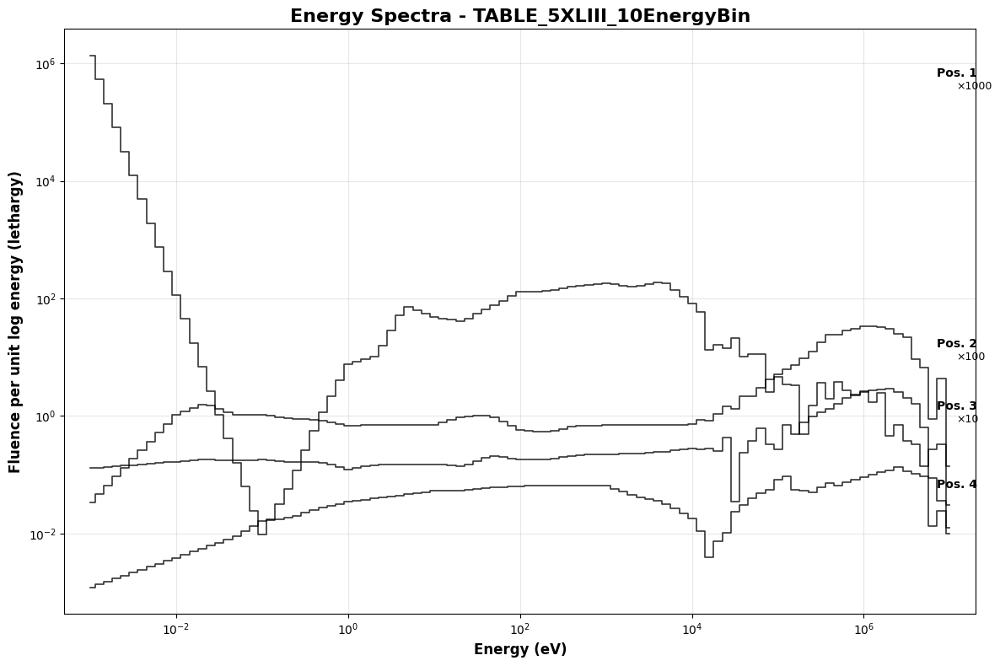


📊 Processing individual plot: TABLE_5XLII_10EnergyBin.csv
✅ Saved plot: TABLE_5XLII_10EnergyBin_SPECTRUM_PLOT.png


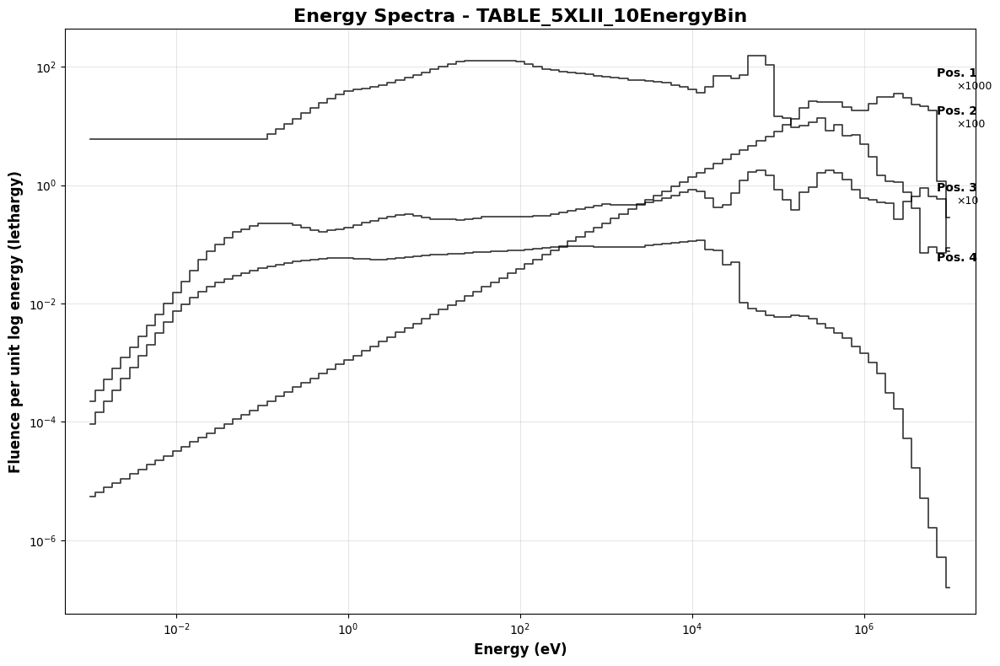


📊 Processing individual plot: TABLE_5XLIV_10EnergyBin.csv
✅ Saved plot: TABLE_5XLIV_10EnergyBin_SPECTRUM_PLOT.png


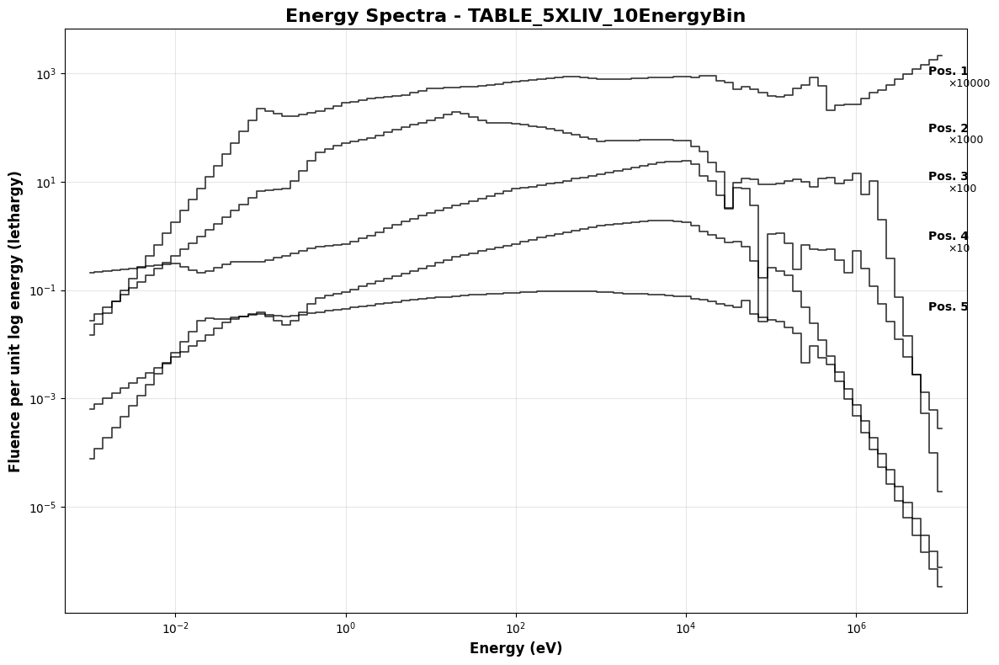


📊 Processing individual plot: TABLE_5XLI_10EnergyBin.csv
✅ Saved plot: TABLE_5XLI_10EnergyBin_SPECTRUM_PLOT.png


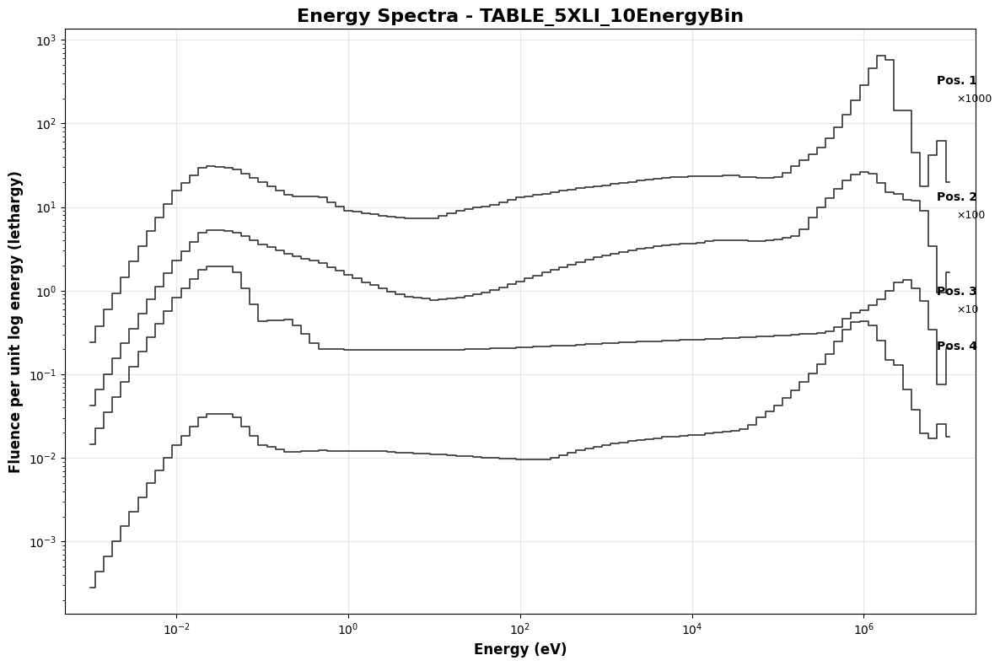


📊 Processing individual plot: TABLE_5XVIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XVIII_10EnergyBin_SPECTRUM_PLOT.png


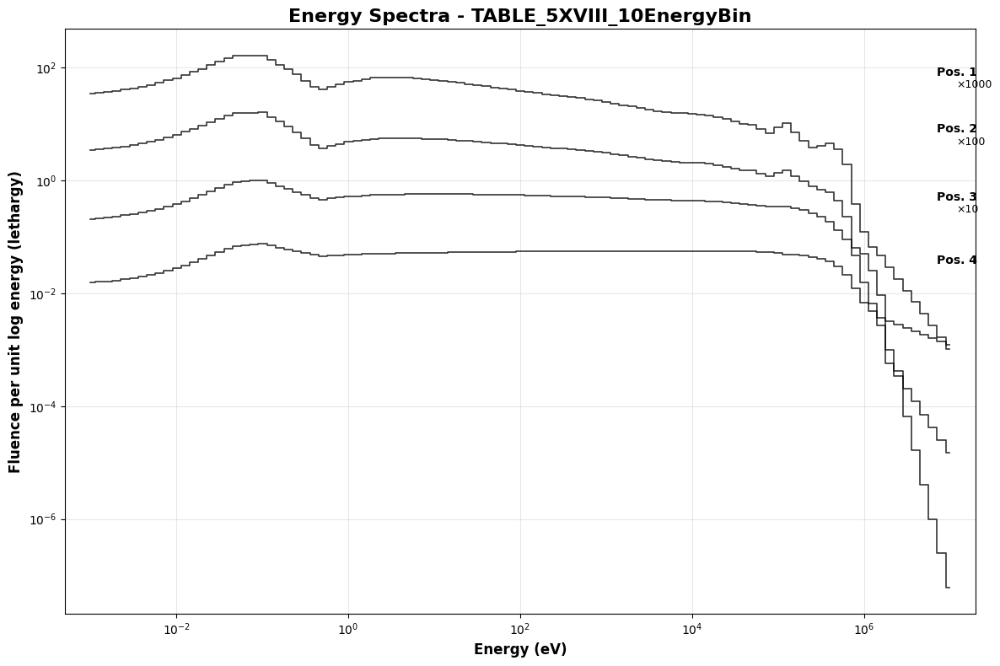


📊 Processing individual plot: TABLE_5XVII_10EnergyBin.csv
✅ Saved plot: TABLE_5XVII_10EnergyBin_SPECTRUM_PLOT.png


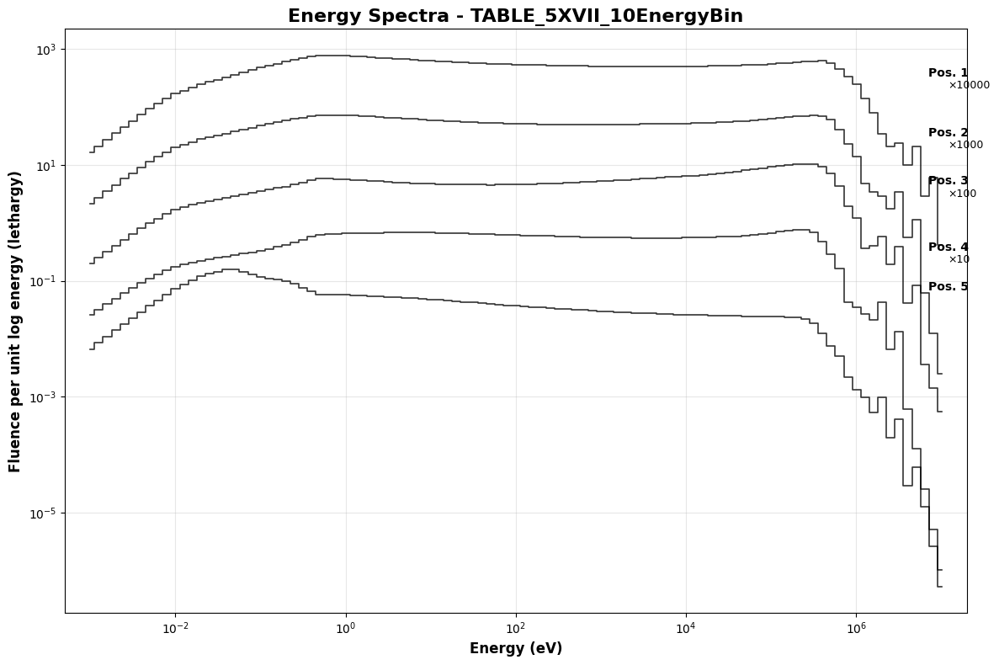


📊 Processing individual plot: TABLE_5XVI_10EnergyBin.csv
✅ Saved plot: TABLE_5XVI_10EnergyBin_SPECTRUM_PLOT.png


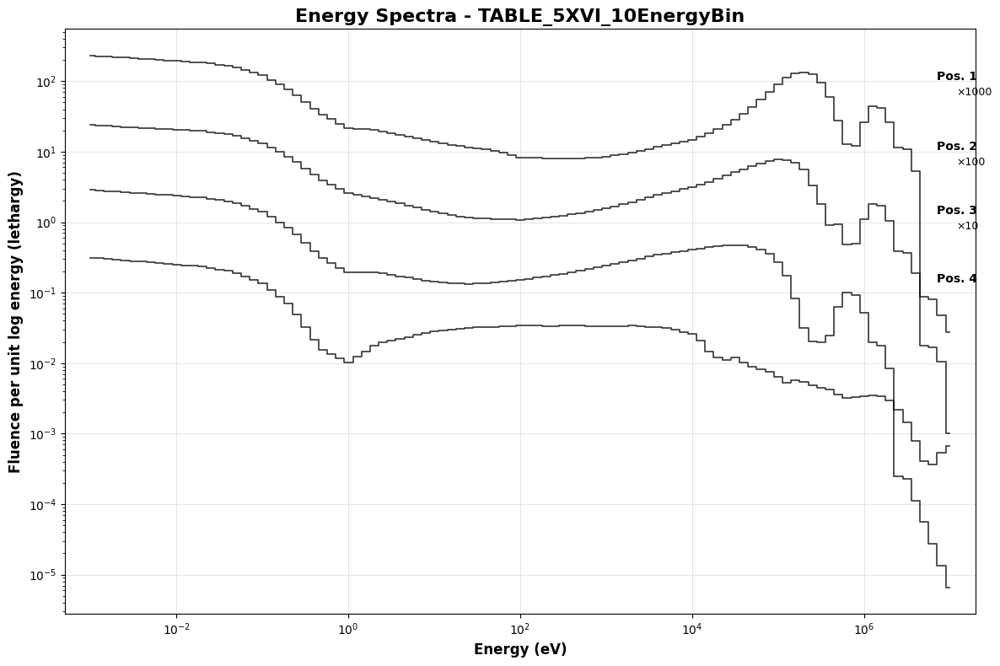


📊 Processing individual plot: TABLE_5XV_10EnergyBin.csv
✅ Saved plot: TABLE_5XV_10EnergyBin_SPECTRUM_PLOT.png


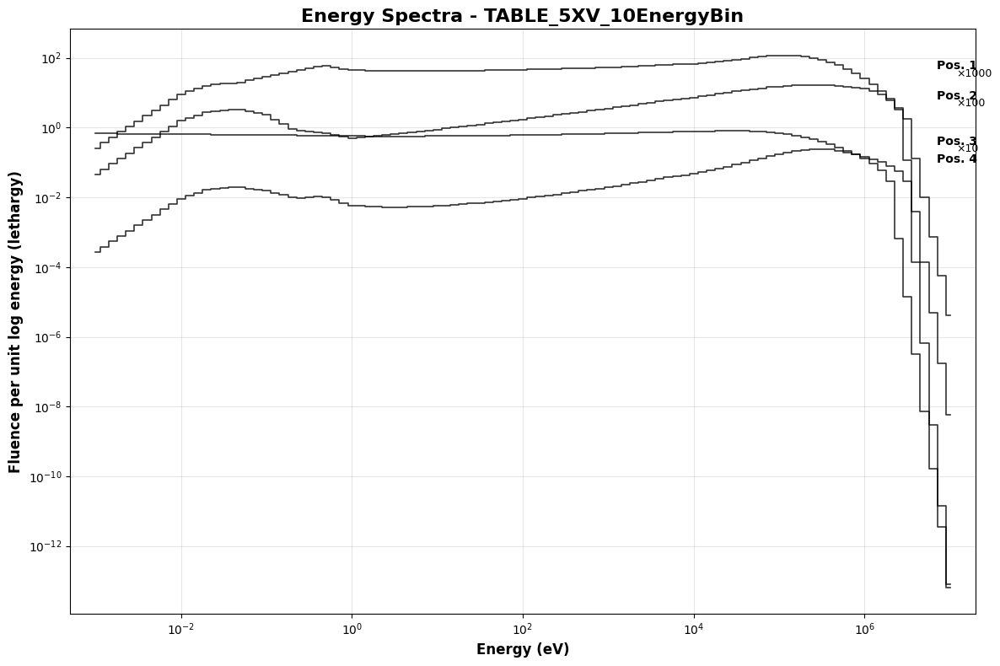


📊 Processing individual plot: TABLE_5XXIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXIII_10EnergyBin_SPECTRUM_PLOT.png


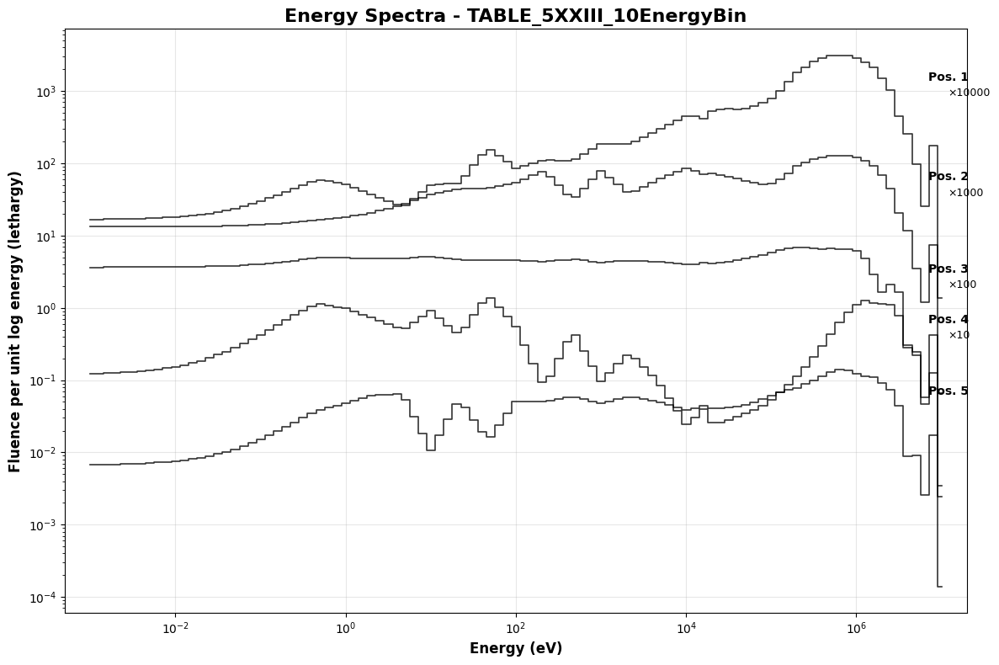


📊 Processing individual plot: TABLE_5XXII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXII_10EnergyBin_SPECTRUM_PLOT.png


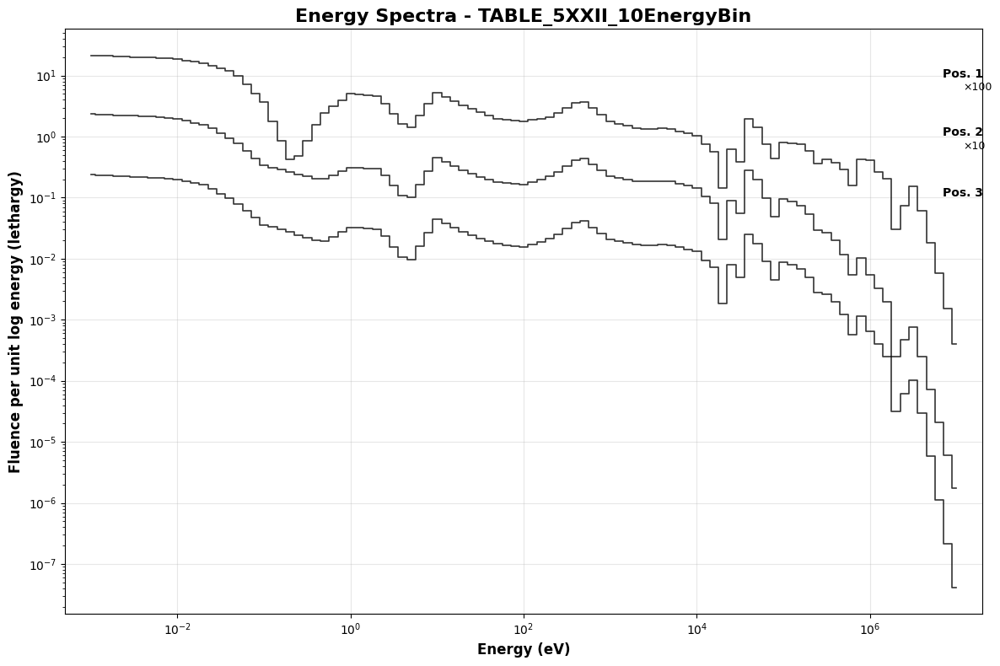


📊 Processing individual plot: TABLE_5XXIV_10EnergyBin.csv
✅ Saved plot: TABLE_5XXIV_10EnergyBin_SPECTRUM_PLOT.png


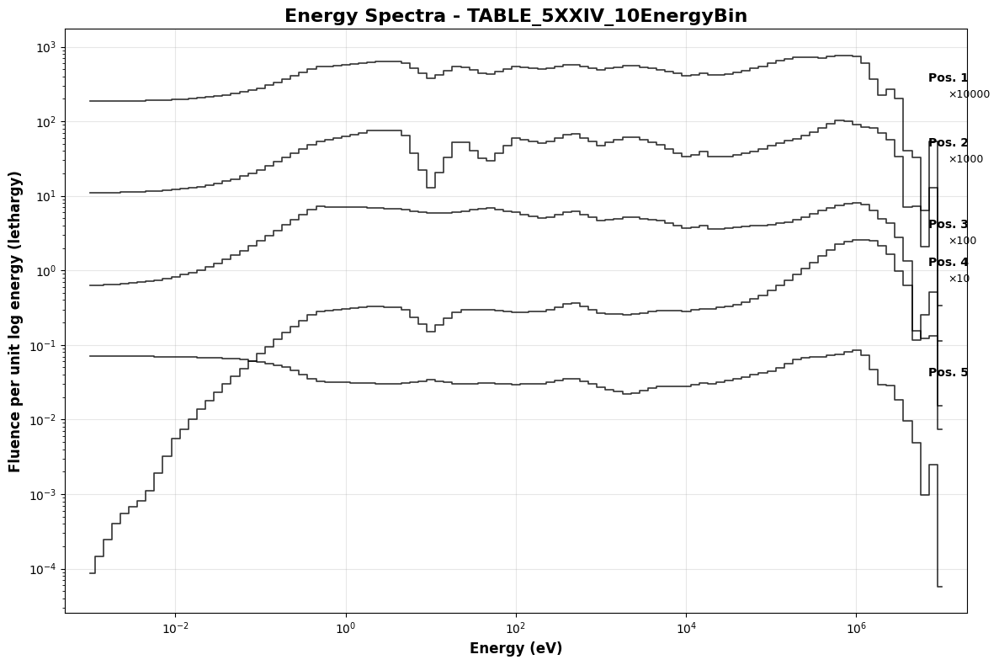


📊 Processing individual plot: TABLE_5XXIX_10EnergyBin.csv
✅ Saved plot: TABLE_5XXIX_10EnergyBin_SPECTRUM_PLOT.png


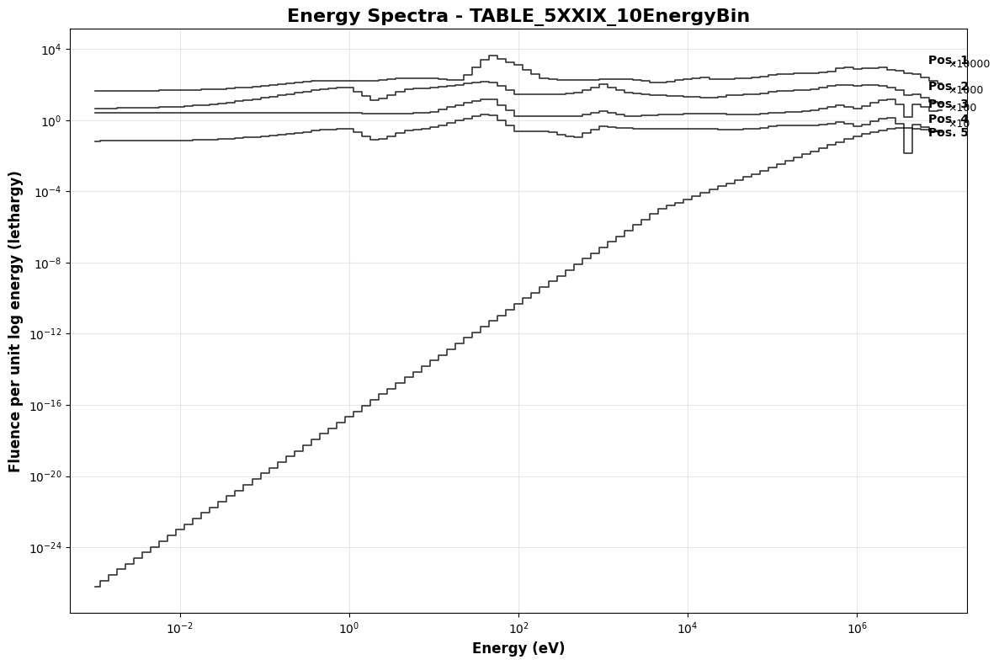


📊 Processing individual plot: TABLE_5XXI_10EnergyBin.csv
✅ Saved plot: TABLE_5XXI_10EnergyBin_SPECTRUM_PLOT.png


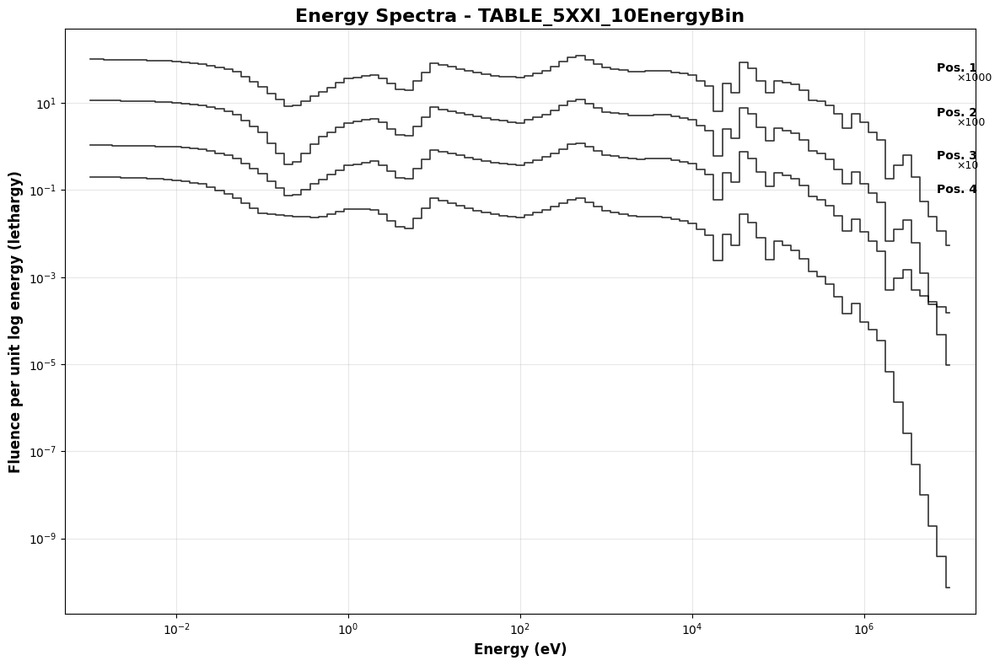


📊 Processing individual plot: TABLE_5XXVIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXVIII_10EnergyBin_SPECTRUM_PLOT.png


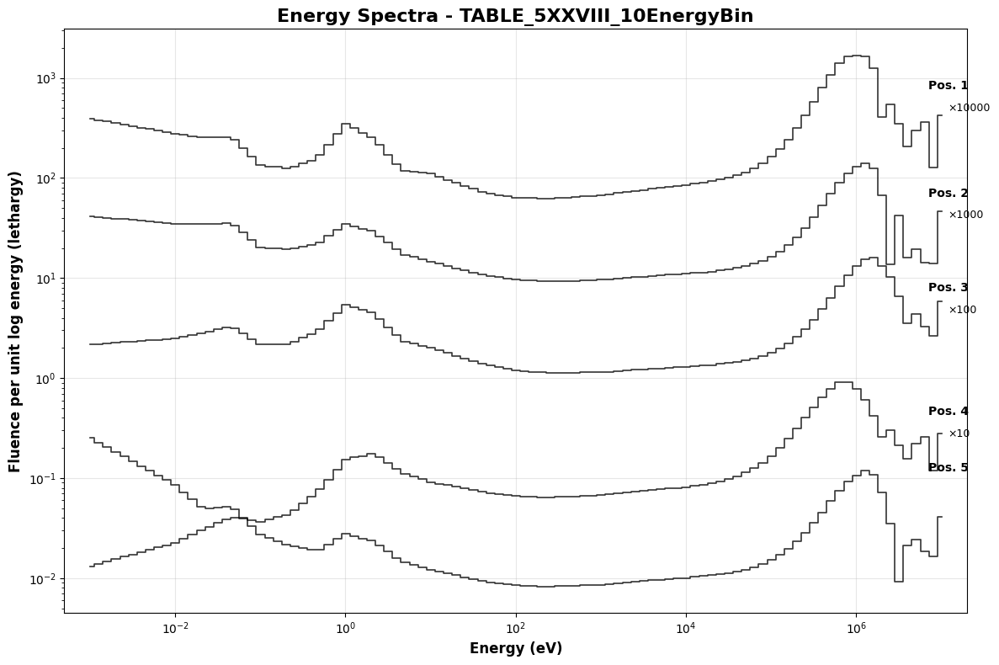


📊 Processing individual plot: TABLE_5XXVII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXVII_10EnergyBin_SPECTRUM_PLOT.png


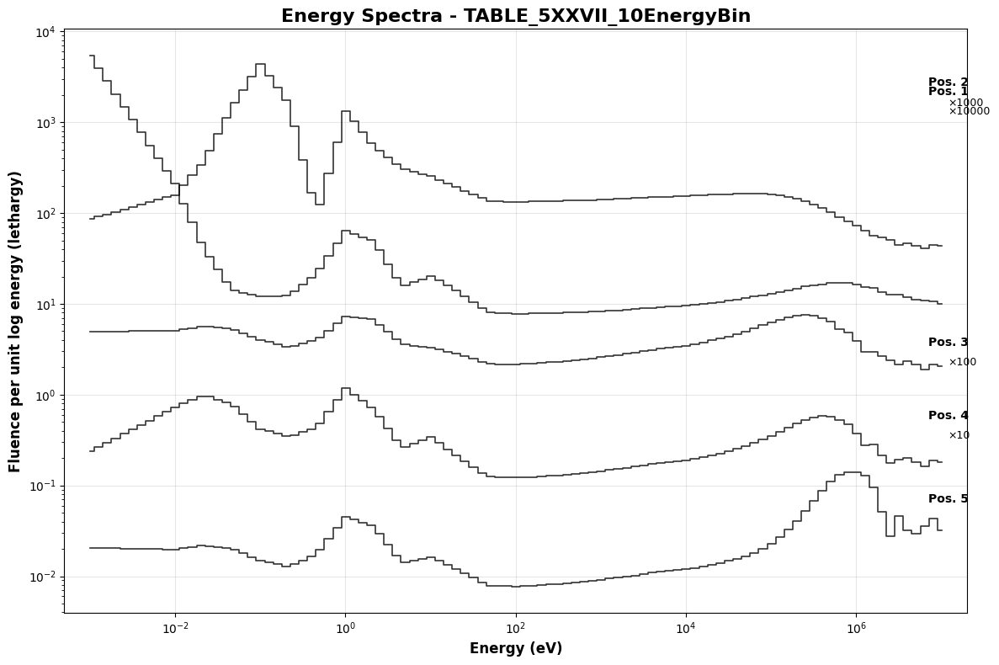


📊 Processing individual plot: TABLE_5XXVI_10EnergyBin.csv
✅ Saved plot: TABLE_5XXVI_10EnergyBin_SPECTRUM_PLOT.png


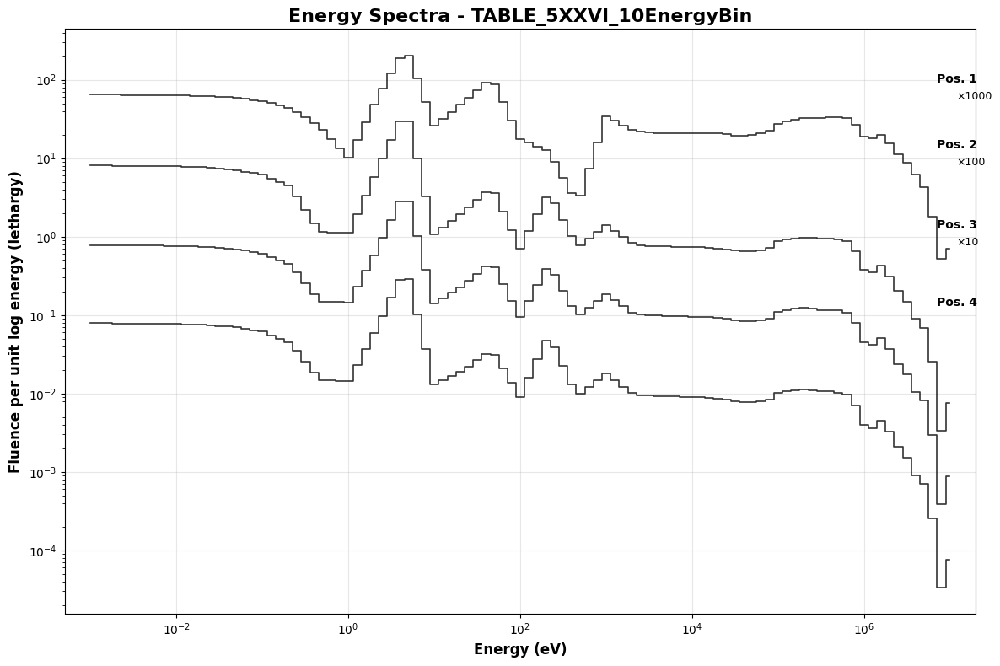


📊 Processing individual plot: TABLE_5XXV_10EnergyBin.csv
✅ Saved plot: TABLE_5XXV_10EnergyBin_SPECTRUM_PLOT.png


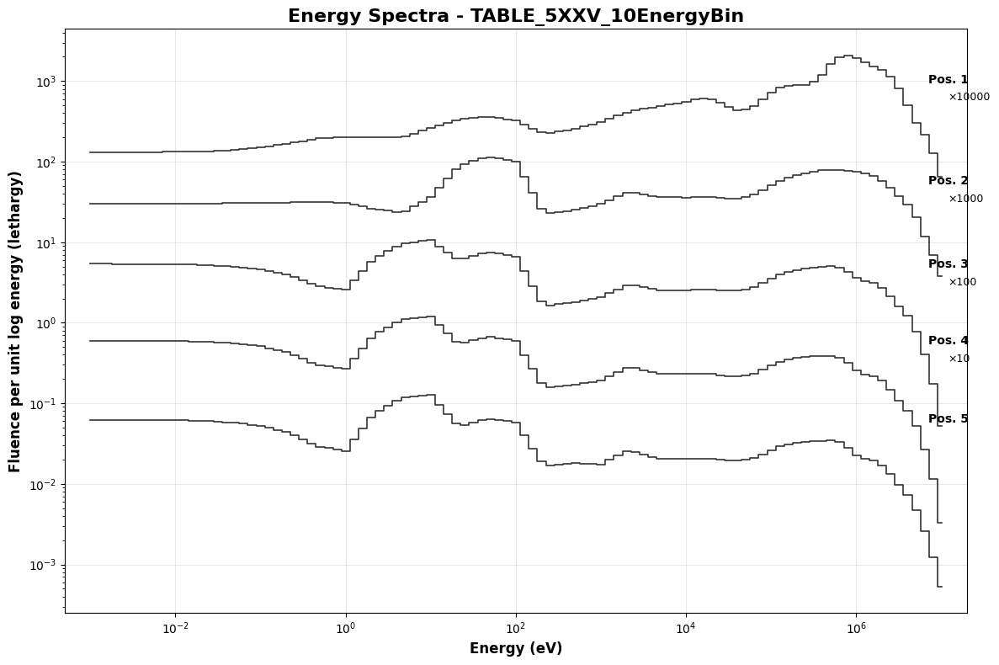


📊 Processing individual plot: TABLE_5XXXIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXIII_10EnergyBin_SPECTRUM_PLOT.png


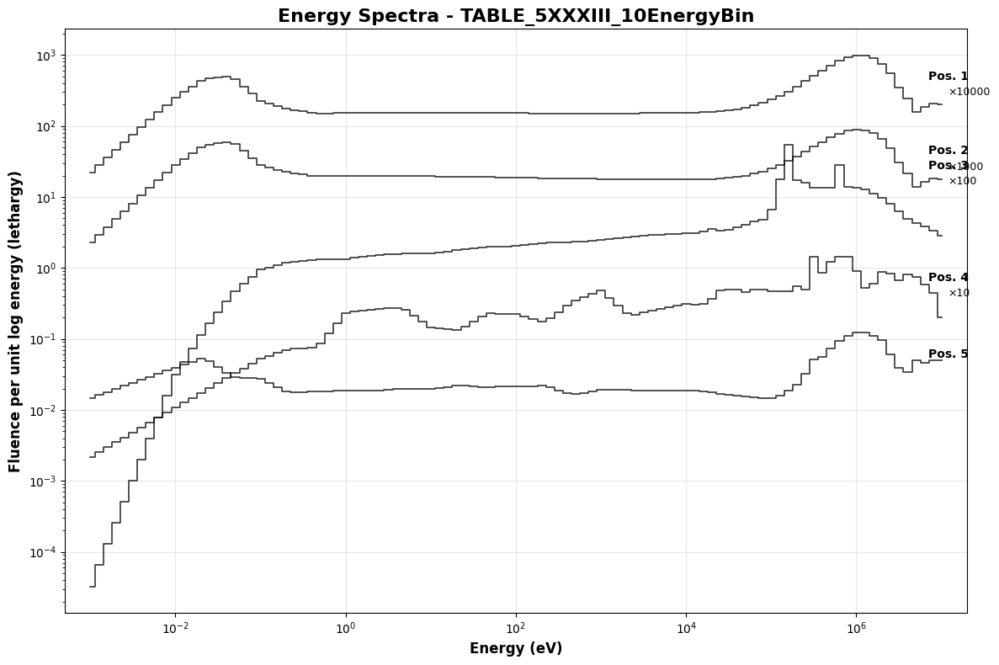


📊 Processing individual plot: TABLE_5XXXII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXII_10EnergyBin_SPECTRUM_PLOT.png


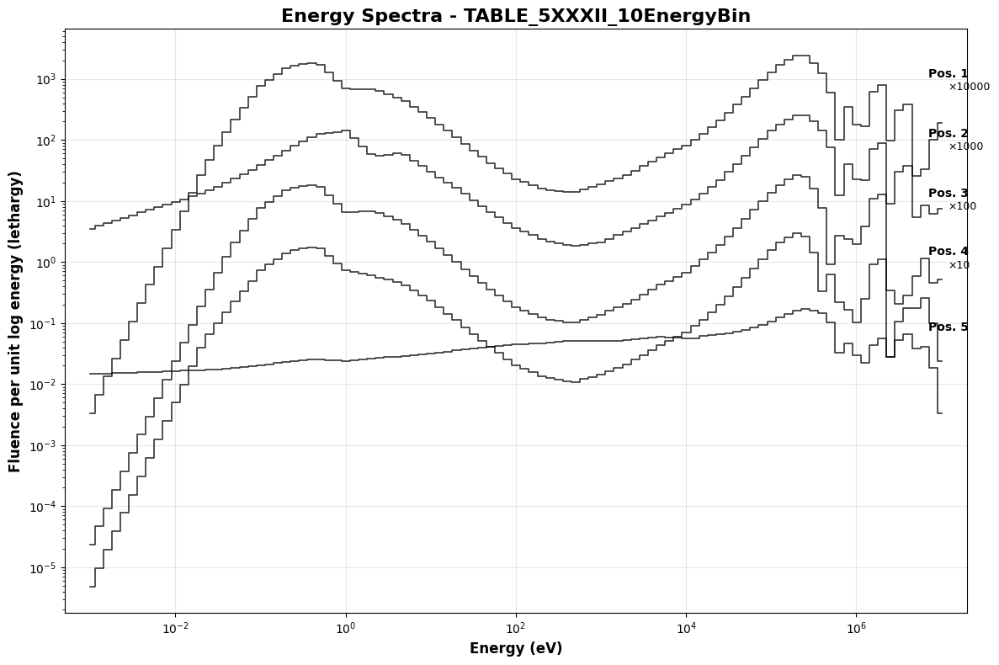


📊 Processing individual plot: TABLE_5XXXIV_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXIV_10EnergyBin_SPECTRUM_PLOT.png


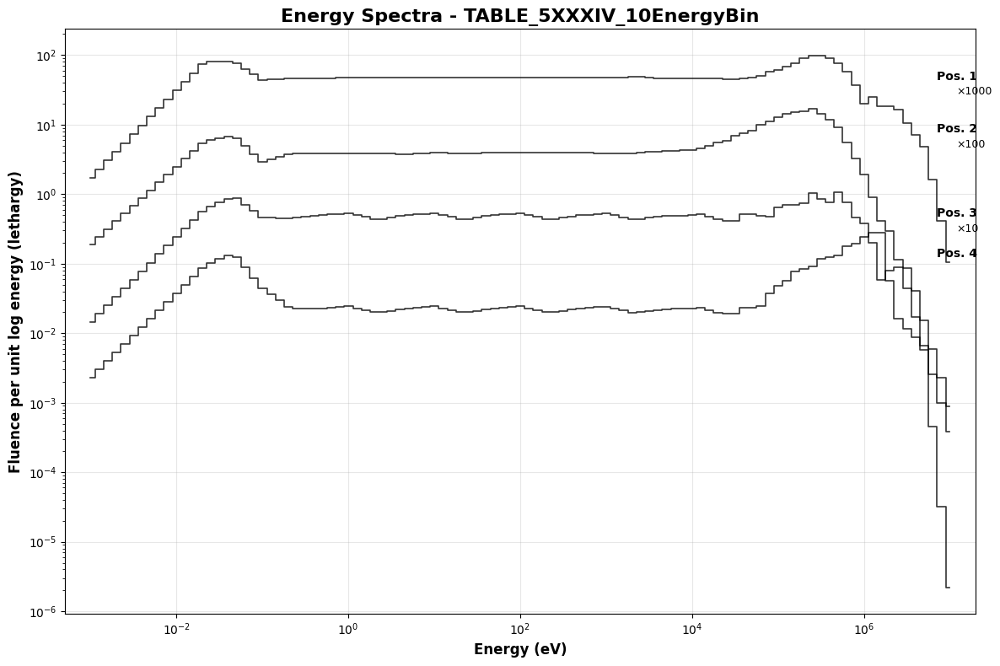


📊 Processing individual plot: TABLE_5XXXIX_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXIX_10EnergyBin_SPECTRUM_PLOT.png


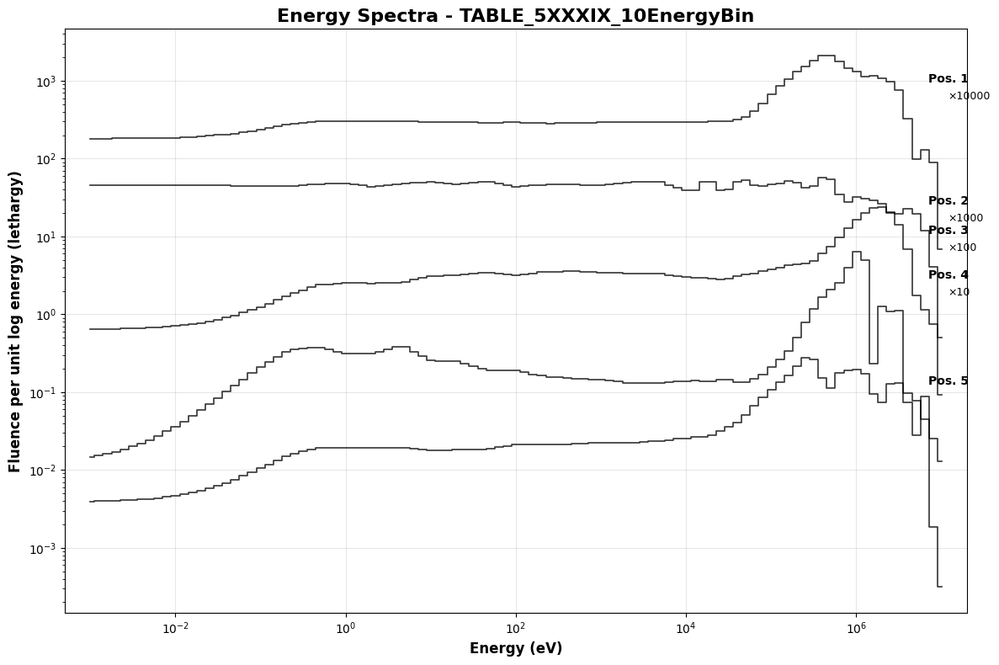


📊 Processing individual plot: TABLE_5XXXI_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXI_10EnergyBin_SPECTRUM_PLOT.png


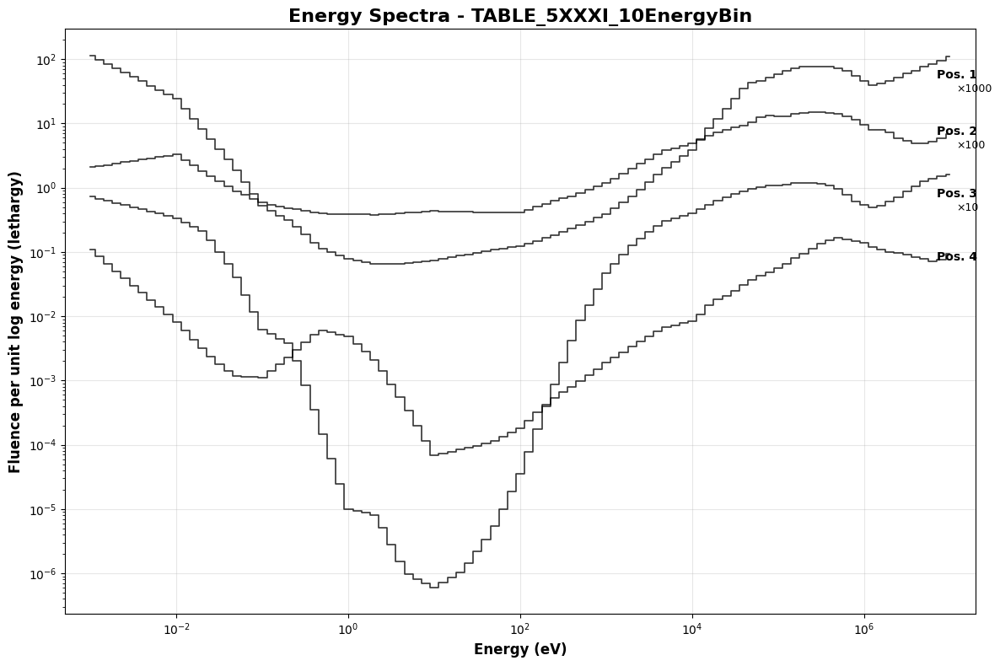


📊 Processing individual plot: TABLE_5XXXVIII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXVIII_10EnergyBin_SPECTRUM_PLOT.png


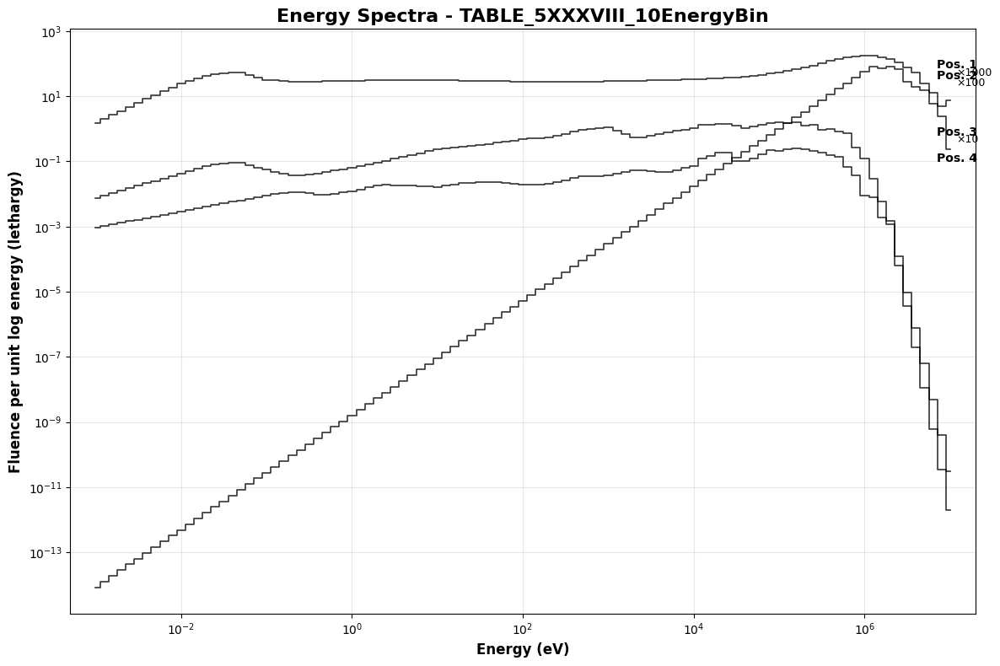


📊 Processing individual plot: TABLE_5XXXVII_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXVII_10EnergyBin_SPECTRUM_PLOT.png


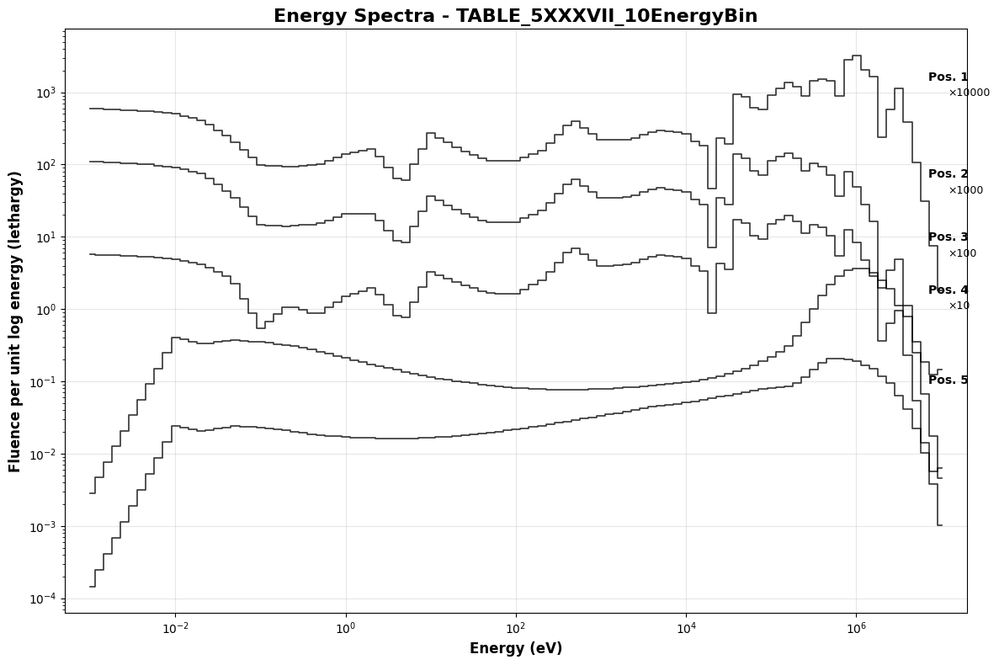


📊 Processing individual plot: TABLE_5XXXVI_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXVI_10EnergyBin_SPECTRUM_PLOT.png


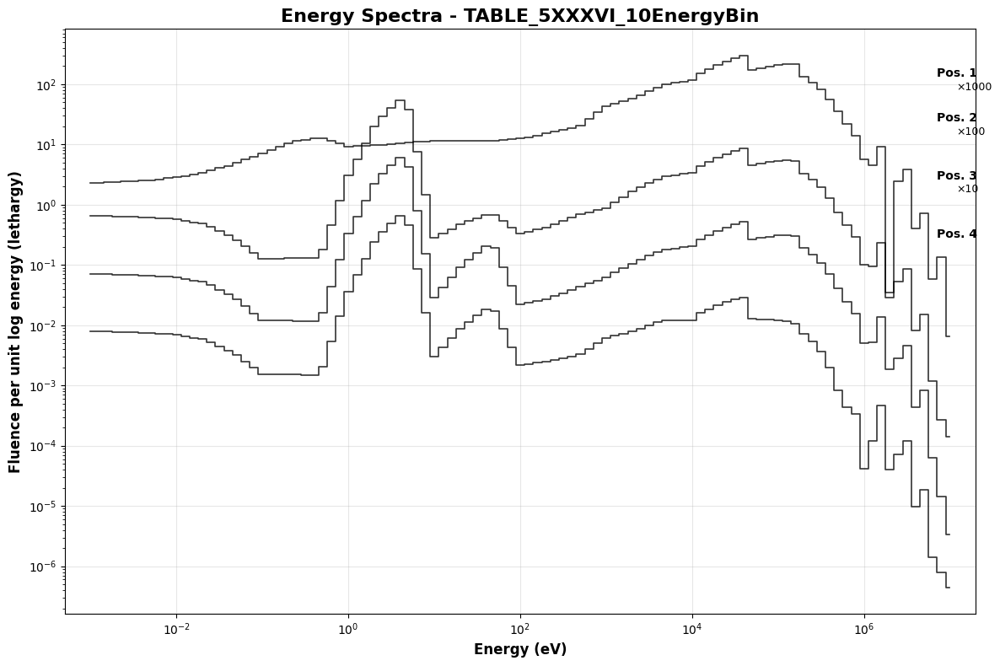


📊 Processing individual plot: TABLE_5XXXV_10EnergyBin.csv
✅ Saved plot: TABLE_5XXXV_10EnergyBin_SPECTRUM_PLOT.png


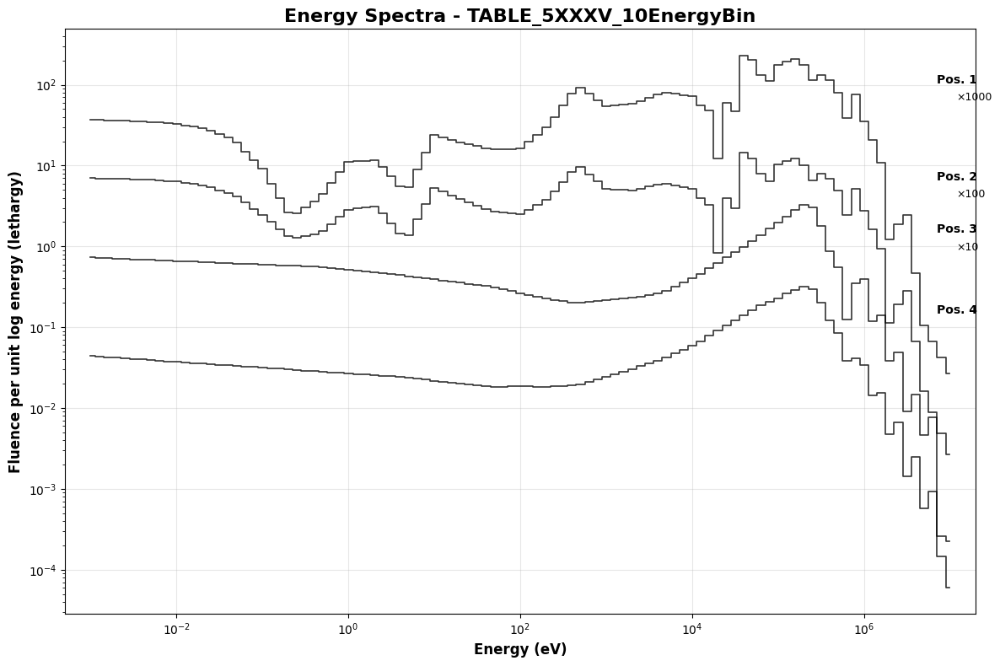


📊 Processing individual plot: TABLE_5XXX_10EnergyBin.csv
✅ Saved plot: TABLE_5XXX_10EnergyBin_SPECTRUM_PLOT.png


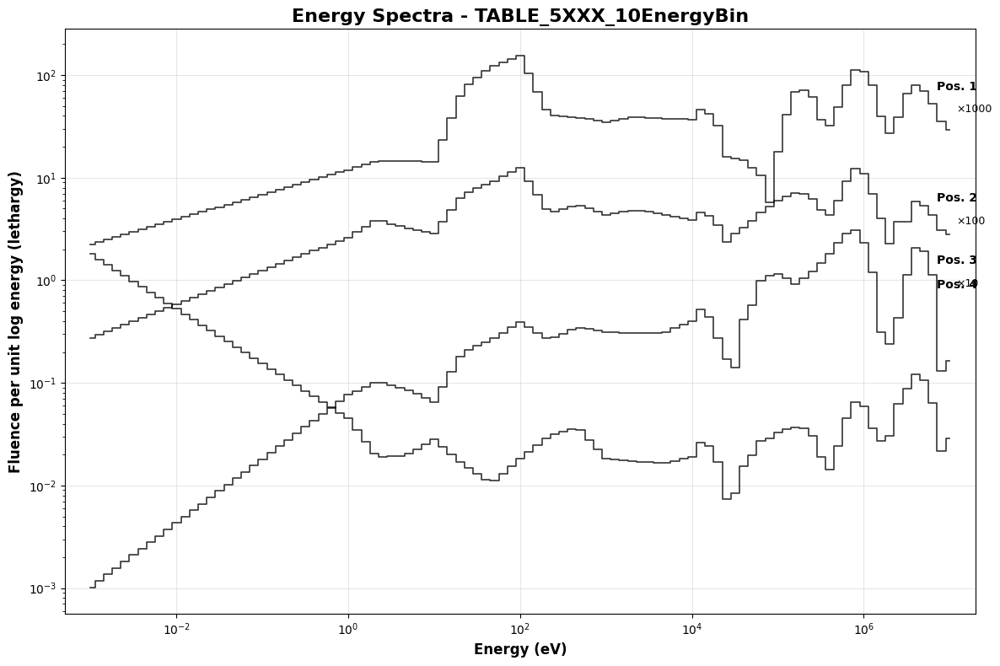


📊 Processing individual plot: TABLE_5XX_10EnergyBin.csv
✅ Saved plot: TABLE_5XX_10EnergyBin_SPECTRUM_PLOT.png


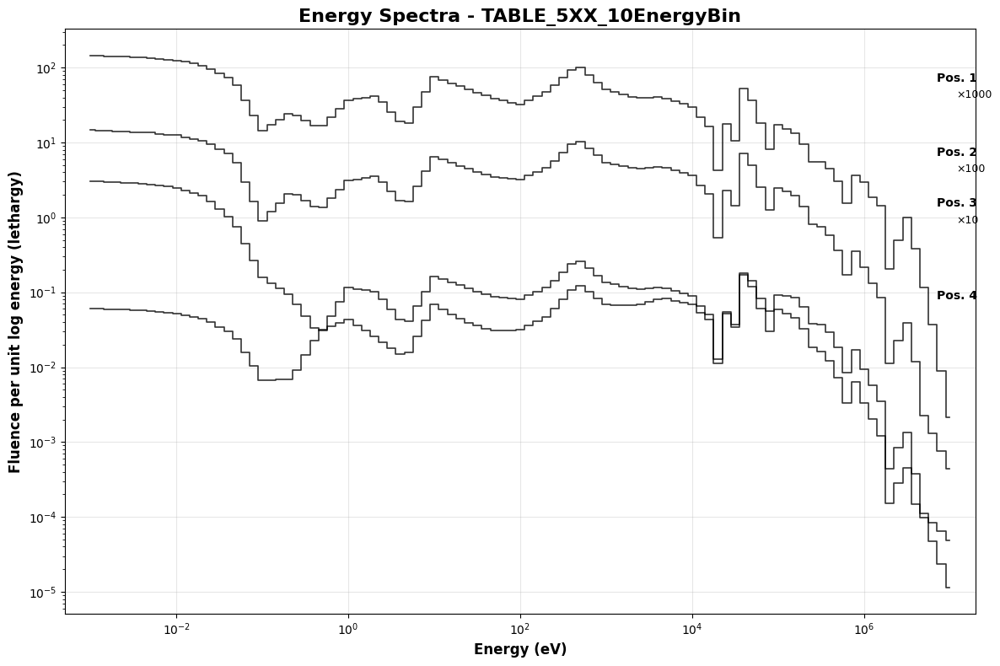


📊 Processing individual plot: TABLE_5X_10EnergyBin.csv
✅ Saved plot: TABLE_5X_10EnergyBin_SPECTRUM_PLOT.png


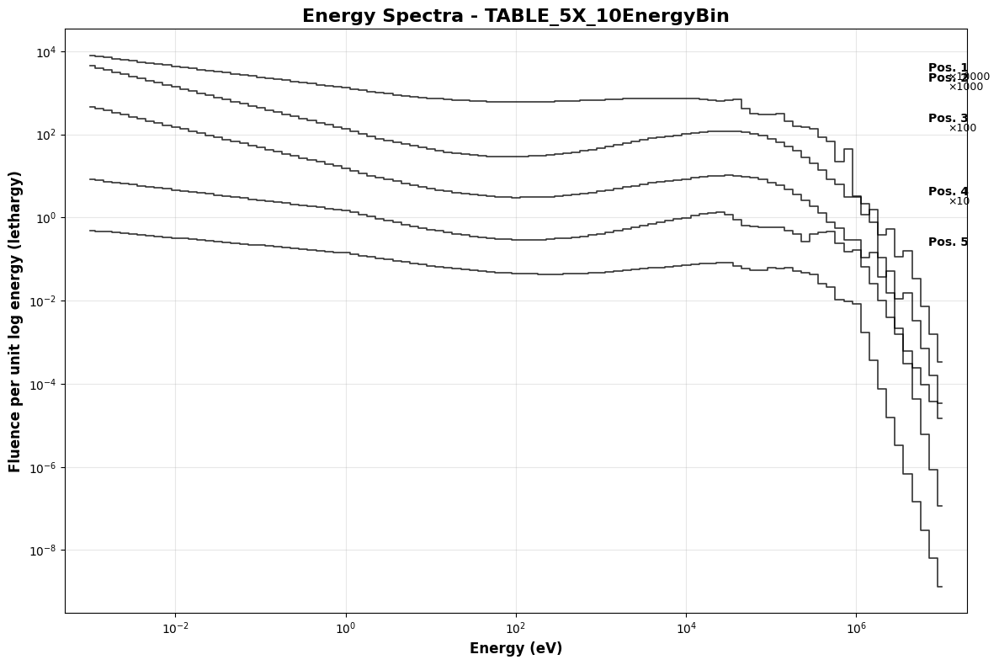


📊 Creating combined ladder plot...
✅ Saved combined ladder plot: CH5_COMBINED_LADDER_PLOT.png


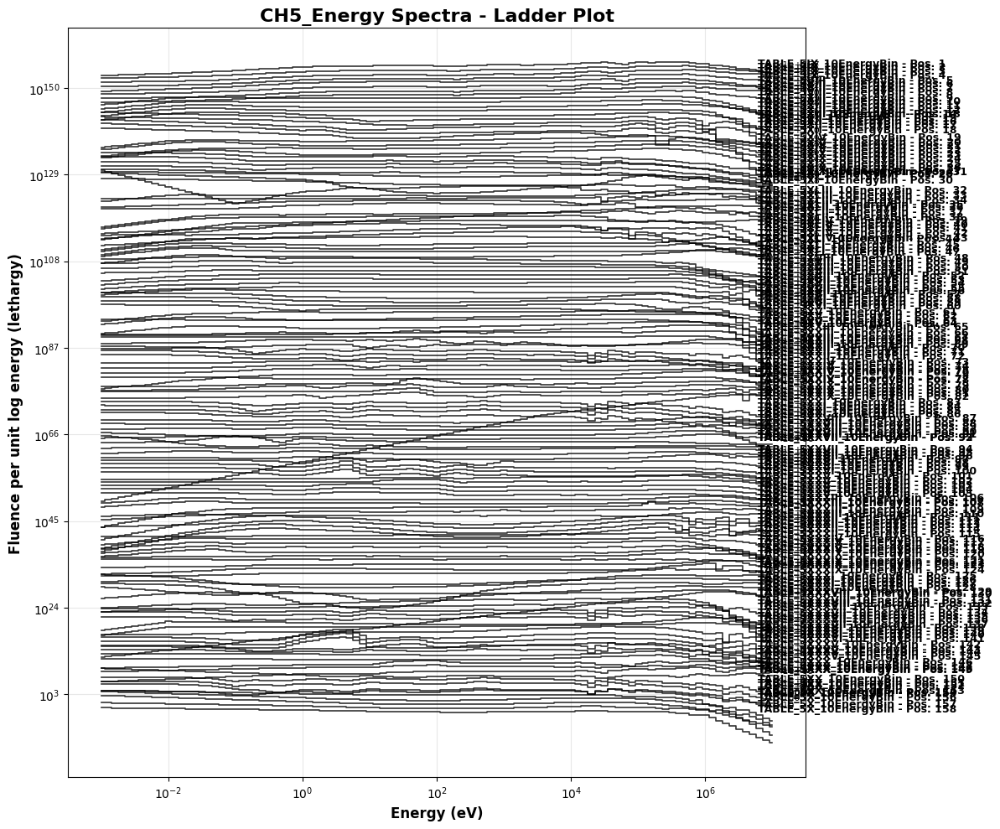


📈 PLOTTING SUMMARY:
   Individual plots: 36/36 files
   Combined ladder plot: 1 file
   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png

🎉 All plots completed!
📁 Check current directory for PNG plot files


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from pathlib import Path

def plot_spectra_from_csv(csv_file):
    """
    Plot spectral data from a single CSV file.
    X-axis: Energy_eV, Y-axis: All other columns
    """
    try:
        # Read the CSV file
        df = pd.read_csv(csv_file)

        # Check if the file has the expected structure
        if 'Energy_eV' not in df.columns:
            print(f"⚠️  Warning: No 'Energy_eV' column found in {csv_file}")
            return

        # Get all columns except Energy_eV
        data_columns = [col for col in df.columns if col != 'Energy_eV']

        if not data_columns:
            print(f"⚠️  Warning: No data columns found in {csv_file}")
            return

        # Convert Energy_eV to numeric, handling scientific notation
        df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')

        # Remove rows with NaN energy values
        df = df.dropna(subset=['Energy_eV'])

        if df.empty:
            print(f"⚠️  Warning: No valid energy data in {csv_file}")
            return

        # Create the plot
        plt.figure(figsize=(12, 8))

        # Plot each data column against energy with ladder offset
        colors = ['black'] * len(data_columns)  # Use black for all curves like the reference

        # Calculate offset multipliers for ladder effect (decreasing from top to bottom)
        offset_multipliers = [10**(i) for i in range(len(data_columns))][::-1]  # Reverse for top-to-bottom

        for i, col in enumerate(data_columns):
            # Convert column data to numeric
            df[col] = pd.to_numeric(df[col], errors='coerce')

            # Remove rows where this column has NaN values
            valid_data = df.dropna(subset=[col])

            if not valid_data.empty:
                # Apply vertical offset for ladder effect
                offset_data = valid_data[col] * offset_multipliers[i]

                plt.loglog(valid_data['Energy_eV'], offset_data,
                          color=colors[i], linewidth=1.2, drawstyle='steps-mid',
                          alpha=0.8)

                # Add position label and multiplier annotation
                pos_label = f"Pos. {i+1}"
                multiplier_label = f"×{offset_multipliers[i]:g}" if offset_multipliers[i] != 1 else ""

                # Position the labels on the right side of the plot
                if not valid_data.empty:
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    # Position label
                    plt.text(max_energy * 0.7, max_flux * 0.5, pos_label,
                            fontsize=10, fontweight='bold', ha='left', va='center')

                    # Multiplier label (if not 1)
                    if multiplier_label:
                        plt.text(max_energy * 1.2, max_flux * 0.3, multiplier_label,
                                fontsize=9, ha='left', va='center')

        # Customize the plot
        table_name = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')
        plt.title(f'Energy Spectra - {table_name}', fontsize=16, fontweight='bold')
        plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
        plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')

        plt.grid(True, alpha=0.3)
        # Remove legend since we're using position labels instead

        # Set axis limits if needed
        if not df['Energy_eV'].empty:
            plt.xlim(df['Energy_eV'].min() * 0.5, df['Energy_eV'].max() * 2)

        plt.tight_layout()

        # Save the plot
        plot_filename = f"{table_name}_SPECTRUM_PLOT.png"
        plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
        print(f"✅ Saved plot: {plot_filename}")

        # Show the plot
        plt.show()

        return True

    except Exception as e:
        print(f"❌ Error plotting {csv_file}: {e}")
        return False


def create_ladder_plot_multiple_files(csv_files, title_prefix=""):
    """
    Create a single ladder plot combining multiple CSV files.
    Each file's data will be offset vertically.
    """
    if not csv_files:
        print("❌ No CSV files provided")
        return

    plt.figure(figsize=(12, 10))

    all_multipliers = []
    position_counter = 1

    # Calculate total number of curves across all files
    total_curves = 0
    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)
            data_columns = [col for col in df.columns if col != 'Energy_eV']
            total_curves += len(data_columns)
        except:
            continue

    # Generate offset multipliers for all curves
    base_multipliers = [10**(i) for i in range(total_curves)][::-1]
    multiplier_idx = 0

    for csv_file in csv_files:
        try:
            df = pd.read_csv(csv_file)

            if 'Energy_eV' not in df.columns:
                continue

            data_columns = [col for col in df.columns if col != 'Energy_eV']
            df['Energy_eV'] = pd.to_numeric(df['Energy_eV'], errors='coerce')
            df = df.dropna(subset=['Energy_eV'])

            if df.empty:
                continue

            file_label = Path(csv_file).stem.replace('_SPECTRA_SECTIONS', '').replace('_SPECTRA', '')

            for col in data_columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                valid_data = df.dropna(subset=[col])

                if not valid_data.empty:
                    # Apply vertical offset
                    multiplier = base_multipliers[multiplier_idx]
                    offset_data = valid_data[col] * multiplier

                    plt.loglog(valid_data['Energy_eV'], offset_data,
                              color='black', linewidth=1.2, drawstyle='steps-mid',
                              alpha=0.8)

                    # Add labels
                    max_energy = valid_data['Energy_eV'].max()
                    max_flux = offset_data.max()

                    pos_label = f"{file_label} - Pos. {position_counter}"
                    multiplier_label = f"×{multiplier:g}" if multiplier != 1 else ""

                    plt.text(max_energy * 0.6, max_flux * 0.5, pos_label,
                            fontsize=9, fontweight='bold', ha='left', va='center')

                    if multiplier_label:
                        plt.text(max_energy * 1.1, max_flux * 0.3, multiplier_label,
                                fontsize=8, ha='left', va='center')

                    position_counter += 1
                    multiplier_idx += 1

        except Exception as e:
            print(f"⚠️  Error processing {csv_file}: {e}")
            continue

    plt.title(f'{title_prefix}Energy Spectra - Ladder Plot', fontsize=16, fontweight='bold')
    plt.xlabel('Energy (eV)', fontsize=12, fontweight='bold')
    plt.ylabel('Fluence per unit log energy (lethargy)', fontsize=12, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    plot_filename = f"{title_prefix}COMBINED_LADDER_PLOT.png"
    plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
    print(f"✅ Saved combined ladder plot: {plot_filename}")
    plt.show()


def plot_all_spectra_files(file_pattern="*10EnergyBin*.csv"):
    """
    Find and plot all CSV files - both individual and combined ladder plots.
    """
    csv_files = glob.glob(file_pattern)

    if not csv_files:
        print(f"❌ No CSV files found matching pattern: {file_pattern}")
        print("📂 Current directory contents:")
        for file in os.listdir('.'):
            if file.endswith('.csv'):
                print(f"   📄 {file}")
        return

    print(f"🎯 Found {len(csv_files)} spectral CSV files to plot:")
    for file in sorted(csv_files):
        print(f"   📄 {file}")

    print("\n🚀 Starting plotting process...")
    print("=" * 50)

    # Individual plots with ladder style
    successful_plots = 0
    for csv_file in sorted(csv_files):
        print(f"\n📊 Processing individual plot: {csv_file}")
        if plot_spectra_from_csv(csv_file):
            successful_plots += 1

    # Combined ladder plot
    print(f"\n📊 Creating combined ladder plot...")
    create_ladder_plot_multiple_files(sorted(csv_files), "CH5_")

    print(f"\n📈 PLOTTING SUMMARY:")
    print(f"   Individual plots: {successful_plots}/{len(csv_files)} files")
    print(f"   Combined ladder plot: 1 file")
    print(f"   Plot files saved as: *_SPECTRUM_PLOT.png and *_LADDER_PLOT.png")


def plot_specific_table(table_name):
    """
    Plot a specific table by name (e.g., "TABLE_5I")
    """
    # Look for files matching the table name
    patterns = [
        f"{table_name}*.csv",
        f"*{table_name}*.csv"
    ]

    csv_files = []
    for pattern in patterns:
        csv_files.extend(glob.glob(pattern))

    if not csv_files:
        print(f"❌ No CSV files found for table: {table_name}")
        return

    for csv_file in csv_files:
        print(f"📊 Plotting: {csv_file}")
        plot_spectra_from_csv(csv_file)


def create_summary_info():
    """
    Create a summary of all available spectral data files
    """
    csv_files = glob.glob("*SPECTRA*.csv")

    if not csv_files:
        print("❌ No spectral CSV files found")
        return

    print("📋 SPECTRAL DATA SUMMARY:")
    print("=" * 60)

    for csv_file in sorted(csv_files):
        try:
            df = pd.read_csv(csv_file)
            table_name = Path(csv_file).stem

            if 'Energy_eV' in df.columns:
                data_cols = [col for col in df.columns if col != 'Energy_eV']
                energy_range = f"{df['Energy_eV'].min():.1E} - {df['Energy_eV'].max():.1E} eV"

                print(f"📄 {table_name}:")
                print(f"   📊 Data columns: {len(data_cols)} ({', '.join(data_cols)})")
                print(f"   ⚡ Energy range: {energy_range}")
                print(f"   📈 Data points: {len(df)} rows")
                print()
        except Exception as e:
            print(f"⚠️  Error reading {csv_file}: {e}")


# Main execution options
if __name__ == "__main__":
    # Option 1: Plot all spectral files
    print("🎯 SPECTRAL DATA PLOTTING TOOL")
    print("=" * 40)

    # Show summary first
    create_summary_info()

    # Plot all files
    plot_all_spectra_files()

    # Example of plotting specific table:
    # plot_specific_table("TABLE_5I")

    print("\n🎉 All plots completed!")
    print("📁 Check current directory for PNG plot files")

#Removing The Lethargy

In [ ]:
import pandas as pd
import glob
import zipfile
import os

# --- 1) Load energy intervals ---
interval_df = pd.read_csv("energy_intervals.csv")
ln_interval = interval_df["ln(Ei+1/Ei)"].values

# --- 2) Process all CSV files ---
input_files = [f for f in glob.glob("*.csv") if "energy_intervals" not in f]

zip_filename = "processed_others_csvs.zip"
with zipfile.ZipFile(zip_filename, "w", compression=zipfile.ZIP_DEFLATED) as zipf:
    for file in input_files:
        df = pd.read_csv(file)

        if "Energy_eV" not in df.columns:
            print(f"⚠️ Skipping {file}, no Energy_eV column found.")
            continue

        if len(df) != len(ln_interval):
            print(f"⚠️ Skipping {file}, row mismatch ({len(df)} vs {len(ln_interval)}).")
            continue

        # Multiply all numeric columns except "Energy_eV"
        for col in df.columns:
            if col != "Energy_eV":
                df[col] = df[col] * ln_interval

        # Save to a temporary CSV (in memory)
        temp_filename = file  # keep original file name
        df.to_csv(temp_filename, index=False)

        # Add to ZIP
        zipf.write(temp_filename)

        # Remove the temporary file
        os.remove(temp_filename)

print(f"🎯 All processed CSVs stored in: {zip_filename}")


🎯 All processed CSVs stored in: processed_others_csvs.zip


# Generating The Counts

In [ ]:
import pandas as pd
import numpy as np
import glob
import os
import zipfile

# === Load the response matrix (log space) ===
response_file = "response_matrix_modified.csv"
response_df = pd.read_csv(response_file, sep=",")

# Convert response matrix to linear scale
response_matrix = response_df.iloc[:, :].to_numpy()


# === Process all spectrum CSV files ===
spectrum_files = glob.glob("*.csv")
spectrum_files = [f for f in spectrum_files if f != response_file]

generated_files = []

for spec_file in spectrum_files:
    spec_df = pd.read_csv(spec_file, sep=",")
    if spec_df.shape[1] == 1:
        spec_df = pd.read_csv(spec_file, sep=",")

    out_df = pd.DataFrame()

    for col_name in spec_df.columns[1:]:   # skip Energy_eV
        spectrum_vector = spec_df[col_name].to_numpy()



        counts = response_matrix.T @ spectrum_vector

        # Store counts
        out_df[col_name + "_counts"] = counts

    # Save results
    out_file = os.path.splitext(spec_file)[0] + "_counts.csv"
    out_df.to_csv(out_file, index=False)
    generated_files.append(out_file)
    print(f"✅ Saved counts (linear) to {out_file}")

# === Create a ZIP file with all generated CSVs ===
zip_filename = "counts_others_modified.zip"
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for file in generated_files:
        zipf.write(file)
        print(f"📦 Added {file} to {zip_filename}")

print(f"\n🎯 All results are zipped into {zip_filename}")


✅ Saved counts (linear) to TABLE_4IX_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XIX_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4X_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_5XLI_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_5XXXIX_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XV_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XVI_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XIV_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4VI_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XVIII_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4VII_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XII_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XXI_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4VIII_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_4XVII_10EnergyBin_counts.csv
✅ Saved counts (linear) to TABLE_5XXVIII_10EnergyBin_counts.csv
✅ Saved counts (line

#Grouping The Entire Dataset

In [ ]:
import pandas as pd
from pathlib import Path

# Paths
spectra_folder = Path("/content/spectra")
counts_folder = Path("/content/counts")

rows = []

for spectrum_file in spectra_folder.glob("*.csv"):
    base_name = spectrum_file.stem
    counts_file = counts_folder / f"{base_name}_counts.csv"

    if not counts_file.exists():
        print(f"⚠️ Skipping {base_name}: counts file not found")
        continue

    # Load spectra (ignore Energy_eV column)
    spectra_df = pd.read_csv(spectrum_file, sep=",")
    spectra_only = spectra_df.iloc[:, 1:]

    # Load counts
    counts_df = pd.read_csv(counts_file, sep=",")

    # For each spectrum column
    for i, col in enumerate(spectra_only.columns, start=1):
        spectrum_vector = spectra_only[col].tolist()  # length 104
        counts_vector   = counts_df[f"{col}_counts"].tolist()  # length 13

        # Build row dictionary
        row = {"Energy_Source": "Power Reactor"}
        row.update({f"count_{j+1}": v for j, v in enumerate(counts_vector)})
        row.update({f"spectrum_value_{j+1}": v for j, v in enumerate(spectrum_vector)})

        rows.append(row)

# Build final DataFrame
final_df = pd.DataFrame(rows)

print(final_df.head())
print("Shape of dataset:", final_df.shape)
import numpy as np

# Function to format values differently depending on column type
def format_value(col, val):
    if col.startswith("spectrum_value_"):
        # Keep scientific notation, 6 decimals
        return f"{val:.6E}"
    elif col.startswith("count_"):
        # Keep linear format (no scientific notation)
        return f"{val:.6f}"
    else:
        return val

# Apply formatting to all numeric columns
formatted_df = final_df.copy()
for col in formatted_df.columns:
    if col.startswith("spectrum_value_") or col.startswith("count_"):
        formatted_df[col] = formatted_df[col].apply(lambda v: format_value(col, v))

# Save to CSV (no additional float_format so counts stay normal)
output_file = "/content/others_modified.csv"
formatted_df.to_csv(output_file, index=False)

print(f"✅ Dataset saved to {output_file}")




   Energy_Source   count_1   count_2   count_3   count_4   count_5   count_6  \
0  Power Reactor  0.005337  0.024504  0.229903  0.441596  0.701633  0.983108   
1  Power Reactor  0.612578  0.667854  1.278214  1.536421  1.719969  1.824846   
2  Power Reactor  1.876028  1.239680  1.322607  1.340073  1.312738  1.245434   
3  Power Reactor  0.595443  0.706414  1.250532  1.490190  1.662355  1.760850   
4  Power Reactor  0.394609  0.229411  0.518570  0.753656  1.010530  1.261809   

    count_7   count_8   count_9  ...  spectrum_value_95  spectrum_value_96  \
0  1.256553  1.714066  1.992120  ...           0.083365           0.114663   
1  1.857311  1.762592  1.543942  ...           0.025332           0.019472   
2  1.150544  0.921809  0.696406  ...           0.002763           0.000713   
3  1.790764  1.698973  1.490879  ...           0.031780           0.026993   
4  1.483067  1.796261  1.920624  ...           0.035465           0.134042   

   spectrum_value_97  spectrum_value_98  spectrum_

#Builiding The New Dataset

In [ ]:
import pandas as pd

# --- Load CSV ---
df = pd.read_csv("Final_Dataset.csv")

# --- Define energy bins in order ---
energy_bins = [
    1.00E-03, 1.26E-03, 1.58E-03, 2.00E-03, 2.51E-03, 3.16E-03, 3.98E-03, 5.01E-03,
    6.31E-03, 7.94E-03, 1.00E-02, 1.26E-02, 1.58E-02, 2.00E-02, 2.51E-02, 3.16E-02,
    3.98E-02, 5.01E-02, 6.31E-02, 7.94E-02, 1.00E-01, 1.26E-01, 1.58E-01, 2.00E-01,
    2.51E-01, 3.16E-01, 3.98E-01, 5.01E-01, 6.31E-01, 7.94E-01, 1.00E+00, 1.26E+00,
    1.58E+00, 2.00E+00, 2.51E+00, 3.16E+00, 3.98E+00, 5.01E+00, 6.31E+00, 7.94E+00,
    1.00E+01, 1.26E+01, 1.58E+01, 2.00E+01, 2.51E+01, 3.16E+01, 3.98E+01, 5.01E+01,
    6.31E+01, 7.94E+01, 1.00E+02, 1.26E+02, 1.58E+02, 2.00E+02, 2.51E+02, 3.16E+02,
    3.98E+02, 5.01E+02, 6.31E+02, 7.94E+02, 1.00E+03, 1.26E+03, 1.58E+03, 2.00E+03,
    2.51E+03, 3.16E+03, 3.98E+03, 5.01E+03, 6.31E+03, 7.94E+03, 1.00E+04, 1.26E+04,
    1.58E+04, 2.00E+04, 2.51E+04, 3.16E+04, 3.98E+04, 5.01E+04, 6.31E+04, 7.94E+04,
    1.00E+05, 1.26E+05, 1.58E+05, 2.00E+05, 2.51E+05, 3.16E+05, 3.98E+05, 5.01E+05,
    6.31E+05, 7.94E+05, 1.00E+06, 1.26E+06, 1.58E+06, 2.00E+06, 2.51E+06, 3.16E+06,
    3.98E+06, 5.01E+06, 6.31E+06, 7.94E+06, 1.00E+07, 1.26E+07, 1.58E+07, 2.00E+07
]

# --- Empty count columns ---
count_cols = [col for col in df.columns if col.startswith("count_")]
df[count_cols] = ""

# --- Normalize spectrum values ---
spectrum_cols = [col for col in df.columns if col.startswith("spectrum_value_")]

for i, col in enumerate(spectrum_cols):
    if i < len(energy_bins):
        df[col] = df[col] / energy_bins[i]

# --- Save to new CSV ---
df.to_csv("normalized_output.csv", index=False)

print("✅ New CSV file 'normalized_output.csv' created successfully.")


✅ New CSV file 'normalized_output.csv' created successfully.


In [ ]:
import pandas as pd
import numpy as np

# --- Load normalized spectra ---
spectra_df = pd.read_csv("normalized_output.csv")

# --- Load response matrix ---
response_df = pd.read_csv("Response_Matrix.csv")

# Ensure response matrix has numeric values
response_matrix = response_df.to_numpy(dtype=float)

# Get spectrum value columns
spectrum_cols = [col for col in spectra_df.columns if col.startswith("spectrum_value_")]

# Prepare count columns based on response matrix columns
count_col_names = [f"count_{i+1}" for i in range(response_matrix.shape[1])]

# Iterate through each spectrum row and compute counts
count_results = []
for _, row in spectra_df.iterrows():
    spectrum_values = row[spectrum_cols].to_numpy(dtype=float)
    counts = np.dot(spectrum_values, response_matrix)  # matrix multiplication
    count_results.append(counts)

# Convert results to a DataFrame
counts_df = pd.DataFrame(count_results, columns=count_col_names)

# Replace counts in spectra_df
for col in count_col_names:
    spectra_df[col] = counts_df[col]

# Save to new CSV
spectra_df.to_csv("final_counts_output.csv", index=False)

print("✅ Counts calculated and saved to 'final_counts_output.csv'")


✅ Counts calculated and saved to 'final_counts_output.csv'


In [ ]:
counts_df

,count_1,count_2,count_3,count_4,count_5,count_6,count_7,count_8,count_9,count_10,count_11,count_12,count_13
0,1180.576736,252.442292,0.827514,163.863720,137.252113,114.659908,94.907758,78.054219,51.453081,33.174738,20.942035,7.982584,2.946487
1,1160.647089,247.886206,0.720271,160.803556,134.669562,112.493939,93.110903,76.575089,50.477290,32.545834,20.545114,7.831360,2.890714
2,695.722964,149.731627,0.786378,97.770312,81.981548,68.523068,56.734863,46.664591,30.762660,19.833035,12.519331,4.771747,1.761146
3,511.830168,110.791992,0.740958,72.648173,60.962674,50.973184,42.212435,34.722066,22.890540,14.757008,9.314879,3.550222,1.310200
4,7.832807,2.365924,0.273060,1.869628,1.631407,1.393744,1.168930,0.967503,0.641243,0.413141,0.260578,0.099178,0.036469
...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,15.141120,17.494765,1.422842,15.538791,13.529089,11.467097,9.556657,7.862335,5.175466,3.320374,2.092631,0.795857,0.292012
109,147.836368,38.492399,1.592884,27.394439,23.304525,19.602774,16.283177,13.403253,8.837832,5.689812,3.589385,1.367212,0.503642
110,14.351941,17.188430,1.398247,15.360218,13.380962,11.343128,9.453861,7.777453,5.119332,3.284103,2.069677,0.787089,0.288790
111,15.949734,17.426463,1.395158,15.312757,13.317087,11.282963,9.401443,7.734685,5.091586,3.266922,2.059109,0.783179,0.287367
